In [1]:
import time
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import os
from PIL import Image
from sklearn.model_selection import train_test_split

if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True

In [2]:
# Dataset Load and split

# 96 eyes, 49 OCT images, 2 visits, 16 biomarkers (binary)
# 96 eyes, 49 OCT images, 2 visits, 496 x 504 OCT images (grayscale)
scan_N = 9408
oct_N = 49
eye_N = 96
sh = [496, 504]

csv_file = '/storage/ice1/shared/d-pace_community/makerspace-datasets/MEDICAL/OLIVES/OLIVES/Biomarker_Clinical_Data_Images.csv'

data = pd.read_csv(csv_file)
col_names = data.columns
file_paths = data['Path (Trial/Arm/Folder/Visit/Eye/Image Name)'].values #[9408,]
file_paths = file_paths.reshape([eye_N,2*oct_N])
bio_markers = data[col_names[2:18]].values
bio_markers = bio_markers.reshape([eye_N,2*oct_N,-1])

clin_data = data[col_names[19:21]].values
clin_data = clin_data.reshape([eye_N,2*oct_N,-1])

home_dir = '/storage/ice1/shared/d-pace_community/makerspace-datasets/MEDICAL/OLIVES/OLIVES'

In [3]:
# Check for rows with Nan and identify the rows (get rid of them after Data split)
rows_with_nan = data[data.isna().any(axis=1)]
# data = data.dropna()

In [4]:
# DeiT preprocessing

transform_deit = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Convert grayscale to 3 channels
    transforms.CenterCrop(496),
    transforms.Resize((224,224)),                # 224x224 or 384x384
    transforms.ToTensor(),                        # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # Normalize with ImageNet stats
        std=[0.229, 0.224, 0.225])
])


# Create DataLoaders with the preprocessed data
class OCTDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, index):
        corrected_path = self.file_paths[index][0].replace('TREX DME', 'TREX_DME')
        img = Image.open(home_dir + corrected_path).convert("L")
        label = self.labels[index]  # Shape: [sample N, bio_marker_N]
        
        if self.transform:
            img = self.transform(img)
        label = torch.tensor(label, dtype=torch.float32)
        
        return img, label



In [5]:
'''
Data setup - No Stratification (OCT only)

'''

# Eye-wise split
# Split dataset into train/val/test
train_val_files, test_files, train_val_labels, test_labels = train_test_split(
    file_paths, bio_markers, test_size=0.2, random_state=42
)

train_files, val_files, train_labels, val_labels = train_test_split(
    train_val_files, train_val_labels, test_size=0.25, random_state=42
)
print(train_files.shape, val_files.shape, test_files.shape)
# Eye-wise -> scan-wise
train_files = train_files.reshape([-1,1])
val_files = val_files.reshape([-1,1])
test_files = test_files.reshape([-1,1])

train_labels = train_labels.reshape([-1,16])
val_labels = val_labels.reshape([-1,16])
test_labels = test_labels.reshape([-1,16])

######## Get rid of data points with Nan values #########
train_nan = ~np.isnan(train_labels).any(axis=1)
val_nan = ~np.isnan(val_labels).any(axis=1)
test_nan = ~np.isnan(test_labels).any(axis=1)

train_labels = train_labels[train_nan]
val_labels = val_labels[val_nan]
test_labels = test_labels[test_nan]

train_files = train_files[train_nan]
val_files = val_files[val_nan]
test_files = test_files[test_nan]
#########################################################

train_dataset = OCTDataset(train_files, train_labels, transform=transform_deit)
val_dataset = OCTDataset(val_files, val_labels, transform=transform_deit)
test_dataset = OCTDataset(test_files, test_labels, transform=transform_deit)

# Make DataLoader
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

(57, 98) (19, 98) (20, 98)


In [6]:
'''
Dataset setup with Stratification (OCT only)
'''

# Eye-wise split
# Split dataset into train/val/test

####### Handle rows with Nan -> mark them with ones(16,) ############
nan_rows = np.isnan(bio_markers).any(axis=2)  # Shape (96, 98), True where NaNs are present
print(np.sum(nan_rows))
# Replace NaN rows ones (checked that no data rows are filled with 1's)
alternating_row = np.ones(16)  
bio_markers[nan_rows] = alternating_row

####### Data stratification based on positive label count per eye #######
pos_count = np.sum(bio_markers,axis=(1,2)) # pos label count per eye
bins = [0,200,300,400,np.inf]
# print(pos_count)
stratify_bins = np.digitize(pos_count, bins)
# print(stratify_bins)
train_val_files, test_files, train_val_labels, test_labels = train_test_split(
    file_paths, bio_markers, test_size=0.2,
    stratify = stratify_bins,
    random_state=42
)

pos_count = np.sum(train_val_labels,axis=(1,2)) # pos label count per eye
bins = [0,200,300,400,np.inf]
stratify_bins = np.digitize(pos_count, bins)
# print(pos_count)
train_files, val_files, train_labels, val_labels = train_test_split(
    train_val_files, train_val_labels, test_size=0.25, 
    stratify = stratify_bins,
    random_state=42
)
print(train_files.shape, val_files.shape, test_files.shape)
##########################################################
# Eye-wise -> scan-wise
train_files = train_files.reshape([-1,1])
val_files = val_files.reshape([-1,1])
test_files = test_files.reshape([-1,1])

train_labels = train_labels.reshape([-1,16])
val_labels = val_labels.reshape([-1,16])
test_labels = test_labels.reshape([-1,16])

############################################
# Get rid of marked Nan rows
train_nan = np.sum(train_labels,axis=1)!=16
val_nan = np.sum(val_labels,axis=1)!=16
test_nan = np.sum(test_labels,axis=1)!=16

train_labels = train_labels[train_nan]
val_labels = val_labels[val_nan]
test_labels = test_labels[test_nan]

train_files = train_files[train_nan]
val_files = val_files[val_nan]
test_files = test_files[test_nan]

########################################################

train_dataset = OCTDataset(train_files, train_labels, transform=transform_deit)
val_dataset = OCTDataset(val_files, val_labels, transform=transform_deit)
test_dataset = OCTDataset(test_files, test_labels, transform=transform_deit)

# Make DataLoader
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

12
(57, 98) (19, 98) (20, 98)


In [6]:
# Check distribution of bio markers
print(np.sum(bio_markers,axis=(0,1)))
# Marker 2,9,13,14,15 has <100 markers -> Stratification based on these


[ 166.  604.   32.  373. 6341.   nan   nan   nan   nan   10. 3003. 4088.
  233.   10.   10.   76.]


In [7]:
'''
Dataset setup with Stratification for low-sample markers (OCT only)
'''

# TODO : 
# Here, stratify_labels indicates whether a sample contains positive instances for any rare biomarker (1 for positive, 0 otherwise).


# stratify_labels = np.any(bio_markers[:, rare_biomarkers] > 0, axis=1).astype(int)
# train_val_files, test_files, train_val_labels, test_labels = train_test_split(
#     file_paths, bio_markers, test_size=0.2, stratify=stratify_labels, random_state=42
# )
# train_val_stratify_labels = np.any(train_val_labels[:, rare_biomarkers] > 0, axis=1).astype(int)

# train_files, val_files, train_labels, val_labels = train_test_split(
#     train_val_files, train_val_labels, test_size=0.25, stratify=train_val_stratify_labels, random_state=42
# )

'\nDataset setup with Stratification for low-sample markers (OCT only)\n'

In [7]:
np.argwhere(np.isnan(clin_data))

array([], shape=(0, 3), dtype=int64)

In [8]:
# Quick analysis of biomarker distribution

train_ratio = np.sum(train_labels, axis=(0)) / np.sum(train_labels)
val_ratio = np.sum(val_labels, axis=(0)) / np.sum(val_labels)
test_ratio = np.sum(test_labels, axis=(0)) / np.sum(test_labels)
print(train_ratio/val_ratio)
print(test_ratio/train_ratio)

# discrepancy between train vs val class distribution (not too severe (?))

[2.36595641 0.98581517 0.13144202 1.05439362 1.02383436 0.82252373
 0.88532738 1.61592384 0.8867551         inf 1.18876451 1.16274063
 1.14301272 0.88723365        inf 0.64694121]
[ 0.50613819  1.25364514 13.98781913  0.69430339  1.09687196  1.3972887
  0.79621124  1.00012212  0.58006124  1.26205887  1.10529691  1.06702551
  1.09143086  5.88960805  0.          2.10343145]


/scratch/1000557/ipykernel_3938463/3005845574.py:6: RuntimeWarning: divide by zero encountered in true_divide
  print(train_ratio/val_ratio)


In [9]:
(2* np.sum(train_labels,axis=0)),(2* np.sum(val_labels,axis=0)),(2* np.sum(test_labels,axis=0))

(array([2.560e+02, 7.000e+02, 8.000e+00, 4.920e+02, 7.630e+03, 3.254e+03,
        6.502e+03, 1.060e+03, 3.706e+03, 1.400e+01, 3.698e+03, 5.056e+03,
        2.860e+02, 6.000e+00, 2.000e+01, 7.000e+01]),
 array([3.200e+01, 2.100e+02, 1.800e+01, 1.380e+02, 2.204e+03, 1.170e+03,
        2.172e+03, 1.940e+02, 1.236e+03, 0.000e+00, 9.200e+02, 1.286e+03,
        7.400e+01, 2.000e+00, 0.000e+00, 3.200e+01]),
 array([  44.,  298.,   38.,  116., 2842., 1544., 1758.,  360.,  730.,
           6., 1388., 1832.,  106.,   12.,    0.,   50.]))

In [10]:
# Weighted BCE for multi-label imbalanced (pos vs. neg) data

train_pos_weights = torch.tensor(train_labels.shape[0] / (2* np.sum(train_labels,axis=0)))
# val_pos_weights = val_labels.shape[0] / (2* np.sum(val_labels,axis=0))
# test_pos_weights = test_labels.shape[0] / (2* np.sum(test_labels,axis=0))

class WeightedBinaryCrossEntropyLoss(nn.Module):
    def __init__(self, pos_weights):
        """
        pos_weights: Tensor of shape (num_biomarkers,) containing weights for positive labels.
        """
        super(WeightedBinaryCrossEntropyLoss, self).__init__()
        self.pos_weights = pos_weights

    def forward(self, logits, targets):
        """
        logits: Predicted logits from the model, shape (batch_size, num_biomarkers).
        targets: Ground truth binary labels, shape (batch_size, num_biomarkers).
        """
        loss = nn.BCEWithLogitsLoss(reduction='none')(logits, targets)  # Compute BCE loss
        weighted_loss = loss * self.pos_weights  # Apply positive weights
        return weighted_loss.mean()
    


class FocalLoss(nn.Module):
    def __init__(self, gamma=2.0, alpha=None, reduction='mean'):
        """
        Focal Loss for multi-label classification.

        Parameters:
        - gamma (float): Focusing parameter that reduces the loss for well-classified samples (default: 2.0).
        - alpha (float or Tensor): Balancing factor to address class imbalance (default: None).
          If a tensor is provided, it should be of shape (num_classes,).
        - reduction (str): Specifies the reduction to apply to the output: 'none', 'mean', 'sum' (default: 'mean').
        """
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction

    def forward(self, logits, targets):
        """
        Compute Focal Loss.

        Parameters:
        - logits (Tensor): Predicted logits of shape (batch_size, num_classes).
        - targets (Tensor): Ground truth labels of shape (batch_size, num_classes).

        Returns:
        - loss (Tensor): Calculated focal loss.
        """
        # Convert logits to probabilities using sigmoid
        probs = torch.sigmoid(logits)
        
        # Binary cross-entropy loss
        bce_loss = F.binary_cross_entropy(probs, targets, reduction='none')
        
        # Compute the modulating factor (1 - p_t)^gamma
        pt = probs * targets + (1 - probs) * (1 - targets)
        focal_factor = (1 - pt) ** self.gamma

        # Apply class balancing factor alpha if provided
        if self.alpha is not None:
            if isinstance(self.alpha, (float, int)):
                alpha_factor = self.alpha * targets + (1 - self.alpha) * (1 - targets)
            elif isinstance(self.alpha, torch.Tensor):
                alpha_factor = self.alpha.unsqueeze(0) * targets + (1 - self.alpha).unsqueeze(0) * (1 - targets)
            else:
                raise ValueError("Alpha must be a float, int, or torch.Tensor.")
            focal_loss = alpha_factor * focal_factor * bce_loss
        else:
            focal_loss = focal_factor * bce_loss

        # Reduction
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Initialize Focal Loss (Example)
# 1. gamma (Focusing Parameter):
# Controls the strength of the focusing effect.
# Higher values put more focus on hard-to-classify samples.

# 2. alpha (Class Balancing Factor):
# Helps address class imbalance.
# If alpha is a scalar, it applies the same balancing for all classes.
# If alpha is a tensor, it applies per-class balancing.

# 3. reduction:
# 'mean': Average loss across the batch.
# 'sum': Sum of the loss across the batch.
# 'none': No reduction is applied; returns loss for each sample.

focal_loss = FocalLoss(gamma=2.0, alpha=0.25)


In [11]:
import timm 
import tqdm

# Load model (model_name, )
model_name = 'deit_base_patch16_224'
input_dim = 224
print(f'model name {model_name}, input size {input_dim}')
model = timm.create_model(model_name, pretrained=True) 
print(model.head)
###### Parameters ######
lr = 1e-3
num_classes = 16
epochs = 10
########################

# Modify the classifier head for multi-class output
model.head = nn.Sequential(
    nn.Linear(model.head.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, num_classes),  # 16 biomarkers
    nn.Sigmoid()  # Multi-label classification (probabilities for each class)
)

print(model.head)
model = model.to('cuda')

# Freeze Vision Encoder layers if needed
for param in model.parameters():
    param.requires_grad = False
for param in model.head.parameters():
    param.requires_grad = True

optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

######### Loss ###########
# criterion = torch.nn.BCELoss()  # Binary Cross-Entropy Loss for multi-label classification
criterion = WeightedBinaryCrossEntropyLoss(train_pos_weights.to('cuda'))
# criterion = FocalLoss(gamma=2.0, alpha=0.25)
##########################

# Training and validation
def train_one_epoch(model, train_loader, optimizer, criterion):
    model.train()
    running_loss = 0.0

    for images, labels in tqdm.tqdm(train_loader):
        images, labels = images.to('cuda'), labels.to('cuda')

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        print('loss : ',loss.item())
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(train_loader)

def validate_one_epoch(model, val_loader, criterion):
    model.eval()
    running_loss = 0.0
    all_outputs = np.zeros([len(val_dataset),num_classes])
    all_labels = np.zeros([len(val_dataset),num_classes])
    i = 0
    with torch.no_grad():
        for images, labels in tqdm.tqdm(val_loader):
            images, labels = images.to('cuda'), labels.to('cuda')
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
#             print(i*batch_size, min((i+1)*batch_size,len(val_dataset)))
#             print(outputs.shape)
            all_outputs[i*batch_size: min((i+1)*batch_size,len(val_dataset)),:] = outputs.cpu()
            all_labels[i*batch_size: min((i+1)*batch_size,len(val_dataset)),:] = labels.cpu()
            i+=1

    return running_loss / len(val_loader), all_outputs, all_labels

# Training loop
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    
#     print(train_loader)
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_outputs, val_labels = validate_one_epoch(model, val_loader, criterion)
    
    print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    scheduler.step()

# # Test the model
# def test_model(model, test_loader):
#     model.eval()
#     correct = 0
#     total = 0
#     threshold = 0.5
#     with torch.no_grad():
#         for images, labels in test_loader:
#             images, labels = images.to('cuda'), labels.to('cuda')
#             outputs = model(images)
#             predictions = (outputs > threshold).float()  # Threshold at 0.5 for binary decisions
#             correct += (predictions == labels).sum().item()
#             total += labels.numel()

#     accuracy = correct / total
#     print(f"Test Accuracy: {accuracy * 100:.2f}%")

# # Evaluate on test set

# test_model(model, test_loader, device)

model name deit_base_patch16_224, input size 224
Linear(in_features=768, out_features=1000, bias=True)
Sequential(
  (0): Linear(in_features=768, out_features=512, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=512, out_features=16, bias=True)
  (4): Sigmoid()
)
Epoch 1/10


  0%|          | 0/175 [00:00<?, ?it/s]

loss :  152.84677307695387


  1%|          | 2/175 [00:02<03:00,  1.04s/it]

loss :  129.1383809198777


  2%|▏         | 3/175 [00:02<02:34,  1.12it/s]

loss :  118.37873842018685


  2%|▏         | 4/175 [00:03<02:23,  1.19it/s]

loss :  112.27787942742282


  3%|▎         | 5/175 [00:04<02:13,  1.28it/s]

loss :  109.14355680452319


  3%|▎         | 6/175 [00:04<01:59,  1.42it/s]

loss :  107.86456348062039


  4%|▍         | 7/175 [00:05<01:57,  1.43it/s]

loss :  107.37891490911093


  5%|▍         | 8/175 [00:06<01:56,  1.44it/s]

loss :  106.87385433052272


  5%|▌         | 9/175 [00:06<01:51,  1.48it/s]

loss :  106.68642565265355


  6%|▌         | 10/175 [00:07<01:52,  1.47it/s]

loss :  106.6163235900728


  6%|▋         | 11/175 [00:08<01:48,  1.51it/s]

loss :  106.59013619154045


  7%|▋         | 12/175 [00:08<01:41,  1.60it/s]

loss :  106.57006452228264


  7%|▋         | 13/175 [00:09<01:36,  1.68it/s]

loss :  106.54936489184388


  8%|▊         | 14/175 [00:09<01:36,  1.67it/s]

loss :  106.5482146389208


  9%|▊         | 15/175 [00:10<01:39,  1.60it/s]

loss :  106.5224184326229


  9%|▉         | 16/175 [00:11<01:38,  1.62it/s]

loss :  106.53212788404375


 10%|▉         | 17/175 [00:11<01:32,  1.70it/s]

loss :  106.5239933403817


 10%|█         | 18/175 [00:12<01:33,  1.67it/s]

loss :  106.52381056275487


 11%|█         | 19/175 [00:13<01:35,  1.63it/s]

loss :  106.53284216333854


 11%|█▏        | 20/175 [00:13<01:37,  1.59it/s]

loss :  106.524623697705


 12%|█▏        | 21/175 [00:14<01:40,  1.54it/s]

loss :  106.52877655522794


 13%|█▎        | 22/175 [00:15<01:38,  1.55it/s]

loss :  106.52664719477798


 13%|█▎        | 23/175 [00:15<01:33,  1.63it/s]

loss :  106.52693178666816


 14%|█▎        | 24/175 [00:16<01:30,  1.67it/s]

loss :  106.52490270035744


 14%|█▍        | 25/175 [00:16<01:34,  1.59it/s]

loss :  106.51402098357806


 15%|█▍        | 26/175 [00:17<01:31,  1.63it/s]

loss :  106.52479951458196


 15%|█▌        | 27/175 [00:18<01:32,  1.60it/s]

loss :  106.52028339344193


 16%|█▌        | 28/175 [00:18<01:29,  1.64it/s]

loss :  106.52465251168722


 17%|█▋        | 29/175 [00:19<01:26,  1.70it/s]

loss :  106.52103262846461


 17%|█▋        | 30/175 [00:19<01:26,  1.68it/s]

loss :  106.52958377152854


 18%|█▊        | 31/175 [00:20<01:29,  1.61it/s]

loss :  106.524030317609


 18%|█▊        | 32/175 [00:21<01:25,  1.67it/s]

loss :  106.52666845724906


 19%|█▉        | 33/175 [00:21<01:25,  1.66it/s]

loss :  106.52402720434006


 19%|█▉        | 34/175 [00:22<01:24,  1.68it/s]

loss :  106.5215839557645


 20%|██        | 35/175 [00:22<01:25,  1.64it/s]

loss :  106.52374451380823


 21%|██        | 36/175 [00:23<01:26,  1.62it/s]

loss :  106.52314485023632


 21%|██        | 37/175 [00:24<01:28,  1.56it/s]

loss :  106.52571664811842


 22%|██▏       | 38/175 [00:24<01:23,  1.64it/s]

loss :  106.52241219890814


 22%|██▏       | 39/175 [00:25<01:23,  1.63it/s]

loss :  106.52205387242441


 23%|██▎       | 40/175 [00:25<01:22,  1.64it/s]

loss :  106.523144385782


 23%|██▎       | 41/175 [00:26<01:25,  1.58it/s]

loss :  106.52427043385728


 24%|██▍       | 42/175 [00:27<01:24,  1.58it/s]

loss :  106.5252812036192


 25%|██▍       | 43/175 [00:27<01:20,  1.63it/s]

loss :  106.5330831893999


 25%|██▌       | 44/175 [00:28<01:20,  1.63it/s]

loss :  106.52915907654165


 26%|██▌       | 45/175 [00:29<01:18,  1.66it/s]

loss :  106.52386505512024


 26%|██▋       | 46/175 [00:29<01:15,  1.72it/s]

loss :  106.52217852039597


 27%|██▋       | 47/175 [00:30<01:14,  1.72it/s]

loss :  106.52302796292547


 27%|██▋       | 48/175 [00:30<01:12,  1.75it/s]

loss :  106.5208980447554


 28%|██▊       | 49/175 [00:31<01:11,  1.77it/s]

loss :  106.52699546499433


 29%|██▊       | 50/175 [00:31<01:08,  1.84it/s]

loss :  106.52488218453266


 29%|██▉       | 51/175 [00:32<01:12,  1.72it/s]

loss :  106.52586103950586


 30%|██▉       | 52/175 [00:32<01:09,  1.77it/s]

loss :  106.52135289045741


 30%|███       | 53/175 [00:33<01:13,  1.67it/s]

loss :  106.52845463609899


 31%|███       | 54/175 [00:34<01:10,  1.71it/s]

loss :  106.5231753783532


 31%|███▏      | 55/175 [00:34<01:10,  1.70it/s]

loss :  106.52223705311548


 32%|███▏      | 56/175 [00:35<01:11,  1.66it/s]

loss :  106.52664202935661


 33%|███▎      | 57/175 [00:35<01:07,  1.74it/s]

loss :  106.52179747108183


 33%|███▎      | 58/175 [00:36<01:08,  1.70it/s]

loss :  106.5234678450501


 34%|███▎      | 59/175 [00:37<01:05,  1.78it/s]

loss :  106.52084715312657


 34%|███▍      | 60/175 [00:37<01:05,  1.74it/s]

loss :  106.51864284531176


 35%|███▍      | 61/175 [00:38<01:07,  1.68it/s]

loss :  106.5288867313195


 35%|███▌      | 62/175 [00:38<01:06,  1.70it/s]

loss :  106.52015361565284


 36%|███▌      | 63/175 [00:39<01:08,  1.63it/s]

loss :  106.52437888148248


 37%|███▋      | 64/175 [00:40<01:09,  1.60it/s]

loss :  106.51714889671482


 37%|███▋      | 65/175 [00:40<01:07,  1.64it/s]

loss :  106.52256453449662


 38%|███▊      | 66/175 [00:41<01:04,  1.68it/s]

loss :  106.52865828090574


 38%|███▊      | 67/175 [00:41<01:02,  1.73it/s]

loss :  106.52910161795965


 39%|███▉      | 68/175 [00:42<01:00,  1.77it/s]

loss :  106.52509104043158


 39%|███▉      | 69/175 [00:43<01:02,  1.69it/s]

loss :  106.52476846121436


 40%|████      | 70/175 [00:43<01:06,  1.57it/s]

loss :  106.5287570473541


 41%|████      | 71/175 [00:44<01:03,  1.63it/s]

loss :  106.53133871984394


 41%|████      | 72/175 [00:44<01:02,  1.65it/s]

loss :  106.5236330947169


 42%|████▏     | 73/175 [00:45<01:01,  1.66it/s]

loss :  106.51939314038695


 42%|████▏     | 74/175 [00:46<01:00,  1.67it/s]

loss :  106.51582514551154


 43%|████▎     | 75/175 [00:46<00:59,  1.69it/s]

loss :  106.51902552623653


 43%|████▎     | 76/175 [00:47<00:57,  1.71it/s]

loss :  106.521321607696


 44%|████▍     | 77/175 [00:47<00:59,  1.66it/s]

loss :  106.51580709002096


 45%|████▍     | 78/175 [00:48<01:04,  1.51it/s]

loss :  106.52617948492563


 45%|████▌     | 79/175 [00:49<01:00,  1.60it/s]

loss :  106.52797873564178


 46%|████▌     | 80/175 [00:49<00:56,  1.69it/s]

loss :  106.52689871544736


 46%|████▋     | 81/175 [00:50<00:54,  1.71it/s]

loss :  106.52071984374578


 47%|████▋     | 82/175 [00:50<00:53,  1.74it/s]

loss :  106.52014445731504


 47%|████▋     | 83/175 [00:51<00:56,  1.62it/s]

loss :  106.52421767119871


 48%|████▊     | 84/175 [00:52<00:57,  1.59it/s]

loss :  106.52515283369688


 49%|████▊     | 85/175 [00:52<00:55,  1.64it/s]

loss :  106.52715780005144


 49%|████▉     | 86/175 [00:53<00:53,  1.65it/s]

loss :  106.52640103368051


 50%|████▉     | 87/175 [00:53<00:51,  1.71it/s]

loss :  106.52419396885321


 50%|█████     | 88/175 [00:54<00:50,  1.72it/s]

loss :  106.52099279160626


 51%|█████     | 89/175 [00:55<00:49,  1.74it/s]

loss :  106.52010735598849


 51%|█████▏    | 90/175 [00:55<00:49,  1.70it/s]

loss :  106.51617109208067


 52%|█████▏    | 91/175 [00:56<00:48,  1.72it/s]

loss :  106.52605160890883


 53%|█████▎    | 92/175 [00:57<00:52,  1.59it/s]

loss :  106.52257482771708


 53%|█████▎    | 93/175 [00:57<00:50,  1.61it/s]

loss :  106.51984893920682


 54%|█████▎    | 94/175 [00:58<00:51,  1.57it/s]

loss :  106.52535804637773


 54%|█████▍    | 95/175 [00:58<00:49,  1.62it/s]

loss :  106.51814237916012


 55%|█████▍    | 96/175 [00:59<00:49,  1.58it/s]

loss :  106.52159236993758


 55%|█████▌    | 97/175 [01:00<00:49,  1.59it/s]

loss :  106.5186483505155


 56%|█████▌    | 98/175 [01:00<00:46,  1.64it/s]

loss :  106.52190464340173


 57%|█████▋    | 99/175 [01:01<00:46,  1.65it/s]

loss :  106.52267066436465


 57%|█████▋    | 100/175 [01:01<00:45,  1.64it/s]

loss :  106.52191001322598


 58%|█████▊    | 101/175 [01:02<00:43,  1.68it/s]

loss :  106.52182673623965


 58%|█████▊    | 102/175 [01:03<00:42,  1.70it/s]

loss :  106.5324832599443


 59%|█████▉    | 103/175 [01:03<00:41,  1.73it/s]

loss :  106.52381128934329


 59%|█████▉    | 104/175 [01:04<00:41,  1.72it/s]

loss :  106.53173694402838


 60%|██████    | 105/175 [01:04<00:41,  1.69it/s]

loss :  106.52369978059897


 61%|██████    | 106/175 [01:05<00:41,  1.68it/s]

loss :  106.52717888825723


 61%|██████    | 107/175 [01:06<00:42,  1.61it/s]

loss :  106.52717785579541


 62%|██████▏   | 108/175 [01:06<00:41,  1.62it/s]

loss :  106.52641900414218


 62%|██████▏   | 109/175 [01:07<00:39,  1.69it/s]

loss :  106.52054152109028


 63%|██████▎   | 110/175 [01:07<00:38,  1.69it/s]

loss :  106.52510586343071


 63%|██████▎   | 111/175 [01:08<00:36,  1.74it/s]

loss :  106.52202405739493


 64%|██████▍   | 112/175 [01:09<00:37,  1.67it/s]

loss :  106.5192614729572


 65%|██████▍   | 113/175 [01:09<00:36,  1.70it/s]

loss :  106.52423646898218


 65%|██████▌   | 114/175 [01:10<00:38,  1.59it/s]

loss :  106.52097692294345


 66%|██████▌   | 115/175 [01:11<00:41,  1.44it/s]

loss :  106.52131059928863


 66%|██████▋   | 116/175 [01:11<00:40,  1.44it/s]

loss :  106.5218670707076


 67%|██████▋   | 117/175 [01:12<00:38,  1.52it/s]

loss :  106.52346930285938


 67%|██████▋   | 118/175 [01:13<00:36,  1.55it/s]

loss :  106.5255438044117


 68%|██████▊   | 119/175 [01:13<00:38,  1.46it/s]

loss :  106.52307909849111


 69%|██████▊   | 120/175 [01:14<00:38,  1.44it/s]

loss :  106.52662451153053


 69%|██████▉   | 121/175 [01:15<00:38,  1.41it/s]

loss :  106.52438215688755


 70%|██████▉   | 122/175 [01:16<00:38,  1.38it/s]

loss :  106.52157515995378


 70%|███████   | 123/175 [01:16<00:41,  1.26it/s]

loss :  106.52181550505635


 71%|███████   | 124/175 [01:17<00:37,  1.37it/s]

loss :  106.52394574277864


 71%|███████▏  | 125/175 [01:18<00:33,  1.47it/s]

loss :  106.5191646571976


 72%|███████▏  | 126/175 [01:19<00:38,  1.28it/s]

loss :  106.51991125761623


 73%|███████▎  | 127/175 [01:19<00:34,  1.40it/s]

loss :  106.51671063687786


 73%|███████▎  | 128/175 [01:20<00:31,  1.50it/s]

loss :  106.52218544687928


 74%|███████▎  | 129/175 [01:20<00:31,  1.47it/s]

loss :  106.51970301090482


 74%|███████▍  | 130/175 [01:21<00:28,  1.58it/s]

loss :  106.51997256803685


 75%|███████▍  | 131/175 [01:22<00:26,  1.65it/s]

loss :  106.51388764410419


 75%|███████▌  | 132/175 [01:22<00:25,  1.68it/s]

loss :  106.52962771559211


 76%|███████▌  | 133/175 [01:23<00:24,  1.71it/s]

loss :  106.5168212907025


 77%|███████▋  | 134/175 [01:23<00:24,  1.70it/s]

loss :  106.51906991716562


 77%|███████▋  | 135/175 [01:24<00:26,  1.54it/s]

loss :  106.52924229541578


 78%|███████▊  | 136/175 [01:25<00:24,  1.57it/s]

loss :  106.53691304046808


 78%|███████▊  | 137/175 [01:25<00:23,  1.61it/s]

loss :  106.52234220900222


 79%|███████▉  | 138/175 [01:26<00:23,  1.56it/s]

loss :  106.52075457286291


 79%|███████▉  | 139/175 [01:27<00:23,  1.56it/s]

loss :  106.52283936089057


 80%|████████  | 140/175 [01:27<00:24,  1.43it/s]

loss :  106.52032692436768


 81%|████████  | 141/175 [01:28<00:24,  1.41it/s]

loss :  106.5202910104044


 81%|████████  | 142/175 [01:29<00:23,  1.42it/s]

loss :  106.52286367512109


 82%|████████▏ | 143/175 [01:30<00:23,  1.34it/s]

loss :  106.52234681619464


 82%|████████▏ | 144/175 [01:30<00:22,  1.37it/s]

loss :  106.52256002374159


 83%|████████▎ | 145/175 [01:31<00:21,  1.38it/s]

loss :  106.52424910039592


 83%|████████▎ | 146/175 [01:32<00:20,  1.42it/s]

loss :  106.52281174354492


 84%|████████▍ | 147/175 [01:32<00:19,  1.42it/s]

loss :  106.52352418489669


 85%|████████▍ | 148/175 [01:33<00:19,  1.36it/s]

loss :  106.52176562575958


 85%|████████▌ | 149/175 [01:34<00:18,  1.44it/s]

loss :  106.52065977054144


 86%|████████▌ | 150/175 [01:35<00:17,  1.44it/s]

loss :  106.52258698095719


 86%|████████▋ | 151/175 [01:35<00:16,  1.41it/s]

loss :  106.52401794360794


 87%|████████▋ | 152/175 [01:36<00:15,  1.48it/s]

loss :  106.5207593243779


 87%|████████▋ | 153/175 [01:37<00:14,  1.49it/s]

loss :  106.52642996013098


 88%|████████▊ | 154/175 [01:37<00:14,  1.47it/s]

loss :  106.52383062857932


 89%|████████▊ | 155/175 [01:38<00:13,  1.47it/s]

loss :  106.52249958684604


 89%|████████▉ | 156/175 [01:39<00:13,  1.43it/s]

loss :  106.51967166461361


 90%|████████▉ | 157/175 [01:39<00:12,  1.47it/s]

loss :  106.52285944409638


 90%|█████████ | 158/175 [01:40<00:12,  1.39it/s]

loss :  106.52308641567987


 91%|█████████ | 159/175 [01:41<00:11,  1.35it/s]

loss :  106.51988375637607


 91%|█████████▏| 160/175 [01:42<00:11,  1.34it/s]

loss :  106.52001887941996


 92%|█████████▏| 161/175 [01:42<00:09,  1.43it/s]

loss :  106.52240240682293


 93%|█████████▎| 162/175 [01:43<00:09,  1.42it/s]

loss :  106.51865077845684


 93%|█████████▎| 163/175 [01:44<00:08,  1.44it/s]

loss :  106.52908260876055


 94%|█████████▎| 164/175 [01:44<00:07,  1.39it/s]

loss :  106.51984582604632


 94%|█████████▍| 165/175 [01:45<00:07,  1.32it/s]

loss :  106.52166546859087


 95%|█████████▍| 166/175 [01:46<00:07,  1.28it/s]

loss :  106.52023505281521


 95%|█████████▌| 167/175 [01:47<00:06,  1.24it/s]

loss :  106.51862812366358


 96%|█████████▌| 168/175 [01:48<00:05,  1.26it/s]

loss :  106.5192613059837


 97%|█████████▋| 169/175 [01:48<00:04,  1.28it/s]

loss :  106.52262087892306


 97%|█████████▋| 170/175 [01:49<00:03,  1.36it/s]

loss :  106.52022394536417


 98%|█████████▊| 171/175 [01:50<00:02,  1.38it/s]

loss :  106.52361418086366


 98%|█████████▊| 172/175 [01:50<00:02,  1.44it/s]

loss :  106.52339391746202


 99%|█████████▉| 173/175 [01:51<00:01,  1.48it/s]

loss :  106.52074772415608


 99%|█████████▉| 174/175 [01:52<00:00,  1.50it/s]

loss :  106.52055721117573


100%|██████████| 175/175 [01:52<00:00,  1.55it/s]


loss :  106.52679117635907


100%|██████████| 58/58 [00:40<00:00,  1.42it/s]


Train Loss: 107.0498, Val Loss: 106.5234
Epoch 2/10


  1%|          | 1/175 [00:00<01:19,  2.19it/s]

loss :  106.52461872994924


  1%|          | 2/175 [00:01<01:29,  1.94it/s]

loss :  106.52116011343577


  2%|▏         | 3/175 [00:01<01:27,  1.97it/s]

loss :  106.52365755261795


  2%|▏         | 4/175 [00:02<01:29,  1.92it/s]

loss :  106.51410075748664


  3%|▎         | 5/175 [00:02<01:23,  2.03it/s]

loss :  106.52060843359736


  3%|▎         | 6/175 [00:02<01:19,  2.12it/s]

loss :  106.52485624923926


  4%|▍         | 7/175 [00:03<01:23,  2.01it/s]

loss :  106.51995272702811


  5%|▍         | 8/175 [00:04<01:26,  1.93it/s]

loss :  106.51818704807269


  5%|▌         | 9/175 [00:04<01:26,  1.93it/s]

loss :  106.52657297378343


  6%|▌         | 10/175 [00:05<01:29,  1.85it/s]

loss :  106.51905632758672


  6%|▋         | 11/175 [00:05<01:25,  1.92it/s]

loss :  106.523014322701


  7%|▋         | 12/175 [00:06<01:25,  1.90it/s]

loss :  106.52031478014803


  7%|▋         | 13/175 [00:06<01:23,  1.94it/s]

loss :  106.52002474165792


  8%|▊         | 14/175 [00:07<01:20,  2.01it/s]

loss :  106.52221516574988


  9%|▊         | 15/175 [00:07<01:17,  2.07it/s]

loss :  106.52296431784134


  9%|▉         | 16/175 [00:08<01:19,  2.01it/s]

loss :  106.51754490198171


 10%|▉         | 17/175 [00:08<01:25,  1.86it/s]

loss :  106.52304925377322


 10%|█         | 18/175 [00:09<01:22,  1.90it/s]

loss :  106.51757426043103


 11%|█         | 19/175 [00:09<01:24,  1.85it/s]

loss :  106.52129899232668


 11%|█▏        | 20/175 [00:10<01:19,  1.95it/s]

loss :  106.51785047344907


 12%|█▏        | 21/175 [00:10<01:15,  2.04it/s]

loss :  106.52232412236756


 13%|█▎        | 22/175 [00:11<01:21,  1.88it/s]

loss :  106.51673658254856


 13%|█▎        | 23/175 [00:11<01:21,  1.86it/s]

loss :  106.51974011809031


 14%|█▎        | 24/175 [00:12<01:23,  1.82it/s]

loss :  106.52074926924969


 14%|█▍        | 25/175 [00:12<01:14,  2.01it/s]

loss :  106.52608884543164


 15%|█▍        | 26/175 [00:13<01:15,  1.97it/s]

loss :  106.5251748338797


 15%|█▌        | 27/175 [00:14<01:21,  1.81it/s]

loss :  106.52064208376103


 16%|█▌        | 28/175 [00:14<01:21,  1.80it/s]

loss :  106.52425964238864


 17%|█▋        | 29/175 [00:15<01:18,  1.87it/s]

loss :  106.51451886873704


 17%|█▋        | 30/175 [00:15<01:17,  1.86it/s]

loss :  106.52330837143259


 18%|█▊        | 31/175 [00:16<01:16,  1.89it/s]

loss :  106.5127175293079


 18%|█▊        | 32/175 [00:16<01:16,  1.88it/s]

loss :  106.51862139505884


 19%|█▉        | 33/175 [00:17<01:16,  1.85it/s]

loss :  106.51908715760547


 19%|█▉        | 34/175 [00:17<01:15,  1.87it/s]

loss :  106.52431009099394


 20%|██        | 35/175 [00:18<01:16,  1.84it/s]

loss :  106.52615643345445


 21%|██        | 36/175 [00:18<01:21,  1.71it/s]

loss :  106.52478762097306


 21%|██        | 37/175 [00:19<01:18,  1.77it/s]

loss :  106.51904934360456


 22%|██▏       | 38/175 [00:20<01:16,  1.78it/s]

loss :  106.51882792114246


 22%|██▏       | 39/175 [00:20<01:14,  1.81it/s]

loss :  106.52320994590539


 23%|██▎       | 40/175 [00:21<01:12,  1.87it/s]

loss :  106.52841887997667


 23%|██▎       | 41/175 [00:21<01:11,  1.88it/s]

loss :  106.5332339204053


 24%|██▍       | 42/175 [00:22<01:15,  1.75it/s]

loss :  106.52119529135408


 25%|██▍       | 43/175 [00:22<01:10,  1.87it/s]

loss :  106.51499867223511


 25%|██▌       | 44/175 [00:23<01:11,  1.83it/s]

loss :  106.52123072568878


 26%|██▌       | 45/175 [00:23<01:05,  1.98it/s]

loss :  106.51597071251534


 26%|██▋       | 46/175 [00:24<01:07,  1.91it/s]

loss :  106.52209506795218


 27%|██▋       | 47/175 [00:24<01:03,  2.00it/s]

loss :  106.51770267925453


 27%|██▋       | 48/175 [00:25<01:02,  2.02it/s]

loss :  106.52210705445793


 28%|██▊       | 49/175 [00:25<01:05,  1.91it/s]

loss :  106.52190526886369


 29%|██▊       | 50/175 [00:26<01:05,  1.92it/s]

loss :  106.52655947072421


 29%|██▉       | 51/175 [00:26<01:05,  1.89it/s]

loss :  106.52022083842436


 30%|██▉       | 52/175 [00:27<01:09,  1.78it/s]

loss :  106.53063262211218


 30%|███       | 53/175 [00:28<01:07,  1.80it/s]

loss :  106.51733434813826


 31%|███       | 54/175 [00:28<01:05,  1.85it/s]

loss :  106.52780127762284


 31%|███▏      | 55/175 [00:29<01:07,  1.77it/s]

loss :  106.51990711274067


 32%|███▏      | 56/175 [00:29<01:08,  1.75it/s]

loss :  106.52062010758601


 33%|███▎      | 57/175 [00:30<01:06,  1.78it/s]

loss :  106.52839426631427


 33%|███▎      | 58/175 [00:30<01:05,  1.78it/s]

loss :  106.52186071366195


 34%|███▎      | 59/175 [00:31<01:02,  1.85it/s]

loss :  106.51925219731356


 34%|███▍      | 60/175 [00:31<01:05,  1.77it/s]

loss :  106.52149924276954


 35%|███▍      | 61/175 [00:32<01:08,  1.67it/s]

loss :  106.51802893859153


 35%|███▌      | 62/175 [00:33<01:06,  1.69it/s]

loss :  106.52343985475761


 36%|███▌      | 63/175 [00:33<01:03,  1.77it/s]

loss :  106.51562504344615


 37%|███▋      | 64/175 [00:34<01:02,  1.78it/s]

loss :  106.5188449391893


 37%|███▋      | 65/175 [00:34<01:01,  1.80it/s]

loss :  106.52181831700764


 38%|███▊      | 66/175 [00:35<01:03,  1.73it/s]

loss :  106.5224862241712


 38%|███▊      | 67/175 [00:36<01:02,  1.72it/s]

loss :  106.51852564332546


 39%|███▉      | 68/175 [00:36<01:01,  1.74it/s]

loss :  106.52138842105381


 39%|███▉      | 69/175 [00:37<00:58,  1.81it/s]

loss :  106.52475468923848


 40%|████      | 70/175 [00:37<00:58,  1.79it/s]

loss :  106.52377881387973


 41%|████      | 71/175 [00:38<00:57,  1.81it/s]

loss :  106.51614080346613


 41%|████      | 72/175 [00:38<00:52,  1.96it/s]

loss :  106.51986875207837


 42%|████▏     | 73/175 [00:39<00:53,  1.92it/s]

loss :  106.52154002568463


 42%|████▏     | 74/175 [00:39<00:53,  1.90it/s]

loss :  106.51978263434515


 43%|████▎     | 75/175 [00:40<00:52,  1.90it/s]

loss :  106.52388439551372


 43%|████▎     | 76/175 [00:40<00:51,  1.91it/s]

loss :  106.52101323228067


 44%|████▍     | 77/175 [00:41<00:51,  1.89it/s]

loss :  106.52185588620947


 45%|████▍     | 78/175 [00:41<00:49,  1.97it/s]

loss :  106.52574334693466


 45%|████▌     | 79/175 [00:42<00:48,  1.96it/s]

loss :  106.52147297405223


 46%|████▌     | 80/175 [00:42<00:50,  1.87it/s]

loss :  106.51951769175633


 46%|████▋     | 81/175 [00:43<00:52,  1.79it/s]

loss :  106.5184608731649


 47%|████▋     | 82/175 [00:44<00:54,  1.70it/s]

loss :  106.5209575976325


 47%|████▋     | 83/175 [00:44<00:53,  1.72it/s]

loss :  106.52599041772419


 48%|████▊     | 84/175 [00:45<00:52,  1.74it/s]

loss :  106.52255607720929


 49%|████▊     | 85/175 [00:45<00:49,  1.81it/s]

loss :  106.51432228950466


 49%|████▉     | 86/175 [00:46<00:46,  1.92it/s]

loss :  106.5214060838318


 50%|████▉     | 87/175 [00:46<00:44,  1.96it/s]

loss :  106.51905263941359


 50%|█████     | 88/175 [00:47<00:45,  1.92it/s]

loss :  106.51860593583845


 51%|█████     | 89/175 [00:47<00:48,  1.77it/s]

loss :  106.51810992132687


 51%|█████▏    | 90/175 [00:48<00:45,  1.87it/s]

loss :  106.51626672718561


 52%|█████▏    | 91/175 [00:48<00:42,  1.99it/s]

loss :  106.51127874258755


 53%|█████▎    | 92/175 [00:49<00:44,  1.88it/s]

loss :  106.52343014760837


 53%|█████▎    | 93/175 [00:49<00:41,  1.97it/s]

loss :  106.51134869376759


 54%|█████▎    | 94/175 [00:50<00:40,  1.98it/s]

loss :  106.51913157122333


 54%|█████▍    | 95/175 [00:50<00:41,  1.94it/s]

loss :  106.52489072113127


 55%|█████▍    | 96/175 [00:51<00:38,  2.04it/s]

loss :  106.52172299702437


 55%|█████▌    | 97/175 [00:51<00:39,  1.97it/s]

loss :  106.51570075272153


 56%|█████▌    | 98/175 [00:52<00:39,  1.96it/s]

loss :  106.5148453746054


 57%|█████▋    | 99/175 [00:52<00:41,  1.85it/s]

loss :  106.52675217106018


 57%|█████▋    | 100/175 [00:53<00:41,  1.80it/s]

loss :  106.51351152769115


 58%|█████▊    | 101/175 [00:54<00:43,  1.70it/s]

loss :  106.51385483170537


 58%|█████▊    | 102/175 [00:54<00:42,  1.70it/s]

loss :  106.50752005115164


 59%|█████▉    | 103/175 [00:55<00:42,  1.69it/s]

loss :  106.51615644333805


 59%|█████▉    | 104/175 [00:55<00:41,  1.71it/s]

loss :  106.51846276332877


 60%|██████    | 105/175 [00:56<00:40,  1.71it/s]

loss :  106.51523792577008


 61%|██████    | 106/175 [00:57<00:42,  1.61it/s]

loss :  106.51936800101929


 61%|██████    | 107/175 [00:57<00:42,  1.58it/s]

loss :  106.51386996258759


 62%|██████▏   | 108/175 [00:58<00:42,  1.56it/s]

loss :  106.51079984319237


 62%|██████▏   | 109/175 [00:59<00:42,  1.55it/s]

loss :  106.5184376054528


 63%|██████▎   | 110/175 [00:59<00:42,  1.54it/s]

loss :  106.5186255397383


 63%|██████▎   | 111/175 [01:00<00:41,  1.56it/s]

loss :  106.51850890642888


 64%|██████▍   | 112/175 [01:01<00:41,  1.51it/s]

loss :  106.51059489718128


 65%|██████▍   | 113/175 [01:01<00:41,  1.50it/s]

loss :  106.51845316444775


 65%|██████▌   | 114/175 [01:02<00:41,  1.49it/s]

loss :  106.51600977267044


 66%|██████▌   | 115/175 [01:03<00:39,  1.51it/s]

loss :  106.52056603571799


 66%|██████▋   | 116/175 [01:03<00:39,  1.50it/s]

loss :  106.51956647334063


 67%|██████▋   | 117/175 [01:04<00:38,  1.50it/s]

loss :  106.51881133071065


 67%|██████▋   | 118/175 [01:05<00:37,  1.53it/s]

loss :  106.52580579664965


 68%|██████▊   | 119/175 [01:05<00:37,  1.49it/s]

loss :  106.51907349002016


 69%|██████▊   | 120/175 [01:06<00:38,  1.42it/s]

loss :  106.52125654304571


 69%|██████▉   | 121/175 [01:07<00:36,  1.47it/s]

loss :  106.51878606737677


 70%|██████▉   | 122/175 [01:07<00:35,  1.51it/s]

loss :  106.5226098254636


 70%|███████   | 123/175 [01:08<00:36,  1.44it/s]

loss :  106.52010214710126


 71%|███████   | 124/175 [01:09<00:35,  1.43it/s]

loss :  106.51538084208826


 71%|███████▏  | 125/175 [01:10<00:34,  1.46it/s]

loss :  106.51759170622066


 72%|███████▏  | 126/175 [01:10<00:33,  1.47it/s]

loss :  106.51386527271725


 73%|███████▎  | 127/175 [01:11<00:33,  1.44it/s]

loss :  106.51992322962349


 73%|███████▎  | 128/175 [01:12<00:32,  1.43it/s]

loss :  106.52467075716885


 74%|███████▎  | 129/175 [01:13<00:35,  1.31it/s]

loss :  106.51891389425795


 74%|███████▍  | 130/175 [01:13<00:35,  1.25it/s]

loss :  106.51856975921751


 75%|███████▍  | 131/175 [01:14<00:34,  1.29it/s]

loss :  106.52492981745938


 75%|███████▌  | 132/175 [01:15<00:32,  1.34it/s]

loss :  106.51498023108387


 76%|███████▌  | 133/175 [01:16<00:30,  1.36it/s]

loss :  106.510893301666


 77%|███████▋  | 134/175 [01:16<00:31,  1.32it/s]

loss :  106.51994426289286


 77%|███████▋  | 135/175 [01:17<00:29,  1.37it/s]

loss :  106.51198937115029


 78%|███████▊  | 136/175 [01:18<00:29,  1.34it/s]

loss :  106.51532519670727


 78%|███████▊  | 137/175 [01:19<00:27,  1.40it/s]

loss :  106.52036783982452


 79%|███████▉  | 138/175 [01:19<00:26,  1.39it/s]

loss :  106.52032208567998


 79%|███████▉  | 139/175 [01:20<00:25,  1.40it/s]

loss :  106.5176239226011


 80%|████████  | 140/175 [01:21<00:23,  1.48it/s]

loss :  106.51860083580762


 81%|████████  | 141/175 [01:21<00:22,  1.48it/s]

loss :  106.520852704674


 81%|████████  | 142/175 [01:22<00:22,  1.50it/s]

loss :  106.51398017886527


 82%|████████▏ | 143/175 [01:23<00:22,  1.44it/s]

loss :  106.5175871295614


 82%|████████▏ | 144/175 [01:23<00:21,  1.45it/s]

loss :  106.5176996285789


 83%|████████▎ | 145/175 [01:24<00:21,  1.37it/s]

loss :  106.52144036027931


 83%|████████▎ | 146/175 [01:25<00:21,  1.34it/s]

loss :  106.51504194643701


 84%|████████▍ | 147/175 [01:26<00:20,  1.38it/s]

loss :  106.51274104587858


 85%|████████▍ | 148/175 [01:26<00:19,  1.42it/s]

loss :  106.51729069462215


 85%|████████▌ | 149/175 [01:27<00:18,  1.41it/s]

loss :  106.51562413834372


 86%|████████▌ | 150/175 [01:28<00:17,  1.43it/s]

loss :  106.51732739259765


 86%|████████▋ | 151/175 [01:28<00:17,  1.36it/s]

loss :  106.51496338955701


 87%|████████▋ | 152/175 [01:29<00:16,  1.37it/s]

loss :  106.50964511315661


 87%|████████▋ | 153/175 [01:30<00:16,  1.31it/s]

loss :  106.52061285835535


 88%|████████▊ | 154/175 [01:31<00:15,  1.33it/s]

loss :  106.52181641724982


 89%|████████▊ | 155/175 [01:31<00:14,  1.39it/s]

loss :  106.50735159282203


 89%|████████▉ | 156/175 [01:32<00:13,  1.41it/s]

loss :  106.51456775998204


 90%|████████▉ | 157/175 [01:33<00:12,  1.43it/s]

loss :  106.51886769927782


 90%|█████████ | 158/175 [01:33<00:11,  1.46it/s]

loss :  106.513234178504


 91%|█████████ | 159/175 [01:34<00:11,  1.42it/s]

loss :  106.52321360736863


 91%|█████████▏| 160/175 [01:35<00:10,  1.48it/s]

loss :  106.52301648365778


 92%|█████████▏| 161/175 [01:35<00:09,  1.48it/s]

loss :  106.52105920971165


 93%|█████████▎| 162/175 [01:36<00:09,  1.42it/s]

loss :  106.51846391897058


 93%|█████████▎| 163/175 [01:37<00:08,  1.40it/s]

loss :  106.51428872342633


 94%|█████████▎| 164/175 [01:38<00:07,  1.40it/s]

loss :  106.51222281404665


 94%|█████████▍| 165/175 [01:38<00:07,  1.41it/s]

loss :  106.51475601083901


 95%|█████████▍| 166/175 [01:39<00:06,  1.40it/s]

loss :  106.51149297617076


 95%|█████████▌| 167/175 [01:40<00:05,  1.38it/s]

loss :  106.52073688844328


 96%|█████████▌| 168/175 [01:41<00:05,  1.38it/s]

loss :  106.51387411109266


 97%|█████████▋| 169/175 [01:41<00:04,  1.45it/s]

loss :  106.51668512053968


 97%|█████████▋| 170/175 [01:42<00:03,  1.43it/s]

loss :  106.5147296840835


 98%|█████████▊| 171/175 [01:43<00:02,  1.38it/s]

loss :  106.51324800855807


 98%|█████████▊| 172/175 [01:43<00:02,  1.44it/s]

loss :  106.5154364587764


 99%|█████████▉| 173/175 [01:44<00:01,  1.43it/s]

loss :  106.51469219501342


 99%|█████████▉| 174/175 [01:45<00:00,  1.43it/s]

loss :  106.52131896884302


100%|██████████| 175/175 [01:45<00:00,  1.66it/s]


loss :  106.51778084462993


100%|██████████| 58/58 [00:41<00:00,  1.40it/s]


Train Loss: 106.5193, Val Loss: 106.5197
Epoch 3/10


  1%|          | 1/175 [00:00<01:22,  2.10it/s]

loss :  106.51667151955705


  1%|          | 2/175 [00:00<01:16,  2.25it/s]

loss :  106.51741238767906


  2%|▏         | 3/175 [00:01<01:18,  2.21it/s]

loss :  106.51542499435212


  2%|▏         | 4/175 [00:01<01:15,  2.27it/s]

loss :  106.51252174169849


  3%|▎         | 5/175 [00:02<01:12,  2.34it/s]

loss :  106.51598089793477


  3%|▎         | 6/175 [00:02<01:04,  2.63it/s]

loss :  106.51671418986078


  4%|▍         | 7/175 [00:02<01:02,  2.71it/s]

loss :  106.5176140805405


  5%|▍         | 8/175 [00:03<01:01,  2.71it/s]

loss :  106.51850256493807


  5%|▌         | 9/175 [00:03<01:10,  2.35it/s]

loss :  106.51290565117071


  6%|▌         | 10/175 [00:04<01:06,  2.48it/s]

loss :  106.51762033149643


  6%|▋         | 11/175 [00:04<01:05,  2.49it/s]

loss :  106.51477192263569


  7%|▋         | 12/175 [00:04<01:02,  2.59it/s]

loss :  106.51504651822819


  7%|▋         | 13/175 [00:05<01:02,  2.61it/s]

loss :  106.51026044558665


  8%|▊         | 14/175 [00:05<01:04,  2.49it/s]

loss :  106.51923074397783


  9%|▊         | 15/175 [00:06<01:07,  2.39it/s]

loss :  106.51385938271605


  9%|▉         | 16/175 [00:06<01:06,  2.40it/s]

loss :  106.5085564284376


 10%|▉         | 17/175 [00:06<01:04,  2.47it/s]

loss :  106.51820105103039


 10%|█         | 18/175 [00:07<00:57,  2.73it/s]

loss :  106.51626207976985


 11%|█         | 19/175 [00:07<00:56,  2.78it/s]

loss :  106.51509765392291


 11%|█▏        | 20/175 [00:07<00:59,  2.61it/s]

loss :  106.50926422807765


 12%|█▏        | 21/175 [00:08<01:06,  2.32it/s]

loss :  106.52027685049501


 13%|█▎        | 22/175 [00:09<01:23,  1.83it/s]

loss :  106.51848742234789


 13%|█▎        | 23/175 [00:09<01:22,  1.84it/s]

loss :  106.513012183736


 14%|█▎        | 24/175 [00:10<01:15,  2.01it/s]

loss :  106.51919495295768


 14%|█▍        | 25/175 [00:10<01:15,  1.98it/s]

loss :  106.52105891822613


 15%|█▍        | 26/175 [00:11<01:07,  2.21it/s]

loss :  106.50924917517693


 15%|█▌        | 27/175 [00:11<01:03,  2.33it/s]

loss :  106.51012957391379


 16%|█▌        | 28/175 [00:11<01:02,  2.35it/s]

loss :  106.51174149268653


 17%|█▋        | 29/175 [00:12<01:04,  2.27it/s]

loss :  106.51125032590053


 17%|█▋        | 30/175 [00:12<01:03,  2.27it/s]

loss :  106.5171366373955


 18%|█▊        | 31/175 [00:13<01:03,  2.26it/s]

loss :  106.51294150903152


 18%|█▊        | 32/175 [00:13<01:00,  2.37it/s]

loss :  106.52104732588201


 19%|█▉        | 33/175 [00:13<00:54,  2.59it/s]

loss :  106.5080089959284


 19%|█▉        | 34/175 [00:14<00:54,  2.57it/s]

loss :  106.51148645903935


 20%|██        | 35/175 [00:14<00:54,  2.56it/s]

loss :  106.5111610866943


 21%|██        | 36/175 [00:15<00:56,  2.47it/s]

loss :  106.50677610906016


 21%|██        | 37/175 [00:15<00:57,  2.41it/s]

loss :  106.51124738109894


 22%|██▏       | 38/175 [00:16<01:00,  2.28it/s]

loss :  106.51670879555108


 22%|██▏       | 39/175 [00:16<01:00,  2.24it/s]

loss :  106.51481285160722


 23%|██▎       | 40/175 [00:17<01:01,  2.20it/s]

loss :  106.51372797125823


 23%|██▎       | 41/175 [00:17<00:59,  2.24it/s]

loss :  106.52204470544683


 24%|██▍       | 42/175 [00:17<01:00,  2.18it/s]

loss :  106.51528568024784


 25%|██▍       | 43/175 [00:18<00:56,  2.34it/s]

loss :  106.5132491562448


 25%|██▌       | 44/175 [00:18<00:57,  2.26it/s]

loss :  106.51498278286253


 26%|██▌       | 45/175 [00:19<00:57,  2.27it/s]

loss :  106.51242022345264


 26%|██▋       | 46/175 [00:19<00:52,  2.43it/s]

loss :  106.52453408477189


 27%|██▋       | 47/175 [00:19<00:49,  2.57it/s]

loss :  106.5149960359308


 27%|██▋       | 48/175 [00:20<00:54,  2.32it/s]

loss :  106.52262596424849


 28%|██▊       | 49/175 [00:20<00:55,  2.27it/s]

loss :  106.51284997426839


 29%|██▊       | 50/175 [00:21<00:54,  2.28it/s]

loss :  106.51318686392614


 29%|██▉       | 51/175 [00:21<00:53,  2.30it/s]

loss :  106.51620076415333


 30%|██▉       | 52/175 [00:22<00:53,  2.31it/s]

loss :  106.51545023514998


 30%|███       | 53/175 [00:22<00:50,  2.41it/s]

loss :  106.51159590115367


 31%|███       | 54/175 [00:23<00:53,  2.28it/s]

loss :  106.51571604681467


 31%|███▏      | 55/175 [00:23<00:48,  2.46it/s]

loss :  106.51100136930106


 32%|███▏      | 56/175 [00:23<00:47,  2.49it/s]

loss :  106.5237550844654


 33%|███▎      | 57/175 [00:24<00:48,  2.42it/s]

loss :  106.5121501649049


 33%|███▎      | 58/175 [00:24<00:46,  2.49it/s]

loss :  106.50752373604843


 34%|███▎      | 59/175 [00:25<00:48,  2.40it/s]

loss :  106.51920623940562


 34%|███▍      | 60/175 [00:25<00:51,  2.22it/s]

loss :  106.51087160364295


 35%|███▍      | 61/175 [00:25<00:49,  2.32it/s]

loss :  106.51607530819186


 35%|███▌      | 62/175 [00:26<00:50,  2.25it/s]

loss :  106.50726329142853


 36%|███▌      | 63/175 [00:26<00:54,  2.07it/s]

loss :  106.51407054947774


 37%|███▋      | 64/175 [00:27<00:57,  1.95it/s]

loss :  106.50221373011925


 37%|███▋      | 65/175 [00:28<01:01,  1.79it/s]

loss :  106.50736164965582


 38%|███▊      | 66/175 [00:28<01:02,  1.73it/s]

loss :  106.51355686845297


 38%|███▊      | 67/175 [00:29<00:58,  1.86it/s]

loss :  106.51256698159301


 39%|███▉      | 68/175 [00:29<00:55,  1.92it/s]

loss :  106.51005159872831


 39%|███▉      | 69/175 [00:30<00:54,  1.94it/s]

loss :  106.5099491990725


 40%|████      | 70/175 [00:31<01:00,  1.74it/s]

loss :  106.51500334909929


 41%|████      | 71/175 [00:31<00:56,  1.83it/s]

loss :  106.51528146488997


 41%|████      | 72/175 [00:31<00:54,  1.90it/s]

loss :  106.50216508355936


 42%|████▏     | 73/175 [00:32<00:54,  1.86it/s]

loss :  106.5145344052847


 42%|████▏     | 74/175 [00:33<00:55,  1.82it/s]

loss :  106.51219512388093


 43%|████▎     | 75/175 [00:33<00:52,  1.91it/s]

loss :  106.51255644699931


 43%|████▎     | 76/175 [00:34<00:52,  1.87it/s]

loss :  106.5094417258465


 44%|████▍     | 77/175 [00:34<00:51,  1.89it/s]

loss :  106.51398748189774


 45%|████▍     | 78/175 [00:35<00:55,  1.76it/s]

loss :  106.51990489748081


 45%|████▌     | 79/175 [00:35<00:54,  1.75it/s]

loss :  106.52315470426834


 46%|████▌     | 80/175 [00:36<00:53,  1.77it/s]

loss :  106.5145072377378


 46%|████▋     | 81/175 [00:36<00:49,  1.90it/s]

loss :  106.5062777485108


 47%|████▋     | 82/175 [00:37<00:48,  1.92it/s]

loss :  106.5017566999629


 47%|████▋     | 83/175 [00:37<00:48,  1.88it/s]

loss :  106.50832154286924


 48%|████▊     | 84/175 [00:38<00:51,  1.76it/s]

loss :  106.51301071182657


 49%|████▊     | 85/175 [00:39<00:54,  1.67it/s]

loss :  106.50343487108876


 49%|████▉     | 86/175 [00:39<00:55,  1.59it/s]

loss :  106.52333733800229


 50%|████▉     | 87/175 [00:40<00:53,  1.63it/s]

loss :  106.50756337373379


 50%|█████     | 88/175 [00:41<00:50,  1.72it/s]

loss :  106.50239850553496


 51%|█████     | 89/175 [00:41<00:52,  1.62it/s]

loss :  106.51459177307632


 51%|█████▏    | 90/175 [00:42<00:54,  1.56it/s]

loss :  106.52467771382119


 52%|█████▏    | 91/175 [00:43<00:54,  1.55it/s]

loss :  106.52537891728781


 53%|█████▎    | 92/175 [00:43<00:54,  1.52it/s]

loss :  106.5113277352377


 53%|█████▎    | 93/175 [00:44<00:53,  1.52it/s]

loss :  106.51376215927873


 54%|█████▎    | 94/175 [00:45<00:54,  1.49it/s]

loss :  106.51524683994876


 54%|█████▍    | 95/175 [00:45<00:52,  1.53it/s]

loss :  106.50518378823315


 55%|█████▍    | 96/175 [00:46<00:49,  1.59it/s]

loss :  106.5134230331281


 55%|█████▌    | 97/175 [00:46<00:47,  1.64it/s]

loss :  106.50985837131861


 56%|█████▌    | 98/175 [00:47<00:46,  1.66it/s]

loss :  106.51570916305224


 57%|█████▋    | 99/175 [00:48<00:43,  1.73it/s]

loss :  106.51633459919522


 57%|█████▋    | 100/175 [00:48<00:45,  1.64it/s]

loss :  106.50873965310399


 58%|█████▊    | 101/175 [00:49<00:49,  1.50it/s]

loss :  106.51403033826207


 58%|█████▊    | 102/175 [00:50<00:50,  1.46it/s]

loss :  106.52088816813304


 59%|█████▉    | 103/175 [00:50<00:47,  1.53it/s]

loss :  106.5125180646703


 59%|█████▉    | 104/175 [00:51<00:47,  1.49it/s]

loss :  106.49846787851268


 60%|██████    | 105/175 [00:52<00:47,  1.48it/s]

loss :  106.50465408482302


 61%|██████    | 106/175 [00:52<00:48,  1.42it/s]

loss :  106.50906224287567


 61%|██████    | 107/175 [00:53<00:47,  1.44it/s]

loss :  106.50100545245488


 62%|██████▏   | 108/175 [00:54<00:46,  1.44it/s]

loss :  106.50770507771954


 62%|██████▏   | 109/175 [00:55<00:45,  1.45it/s]

loss :  106.50766499501995


 63%|██████▎   | 110/175 [00:55<00:44,  1.44it/s]

loss :  106.51443710400886


 63%|██████▎   | 111/175 [00:56<00:45,  1.40it/s]

loss :  106.51531923956284


 64%|██████▍   | 112/175 [00:57<00:41,  1.51it/s]

loss :  106.49867809926224


 65%|██████▍   | 113/175 [00:57<00:39,  1.57it/s]

loss :  106.51224387502694


 65%|██████▌   | 114/175 [00:58<00:38,  1.60it/s]

loss :  106.51719490274141


 66%|██████▌   | 115/175 [00:58<00:40,  1.49it/s]

loss :  106.516115429443


 66%|██████▋   | 116/175 [00:59<00:39,  1.49it/s]

loss :  106.5123974251357


 67%|██████▋   | 117/175 [01:00<00:40,  1.45it/s]

loss :  106.51288831826632


 67%|██████▋   | 118/175 [01:01<00:39,  1.43it/s]

loss :  106.4956186998792


 68%|██████▊   | 119/175 [01:01<00:39,  1.42it/s]

loss :  106.5157656356041


 69%|██████▊   | 120/175 [01:02<00:37,  1.47it/s]

loss :  106.51418732631691


 69%|██████▉   | 121/175 [01:03<00:36,  1.47it/s]

loss :  106.51644928921874


 70%|██████▉   | 122/175 [01:03<00:36,  1.47it/s]

loss :  106.5076448877325


 70%|███████   | 123/175 [01:04<00:33,  1.53it/s]

loss :  106.51550037195149


 71%|███████   | 124/175 [01:05<00:34,  1.49it/s]

loss :  106.50506134196618


 71%|███████▏  | 125/175 [01:05<00:33,  1.48it/s]

loss :  106.51114872749898


 72%|███████▏  | 126/175 [01:06<00:33,  1.47it/s]

loss :  106.50582178558719


 73%|███████▎  | 127/175 [01:07<00:31,  1.52it/s]

loss :  106.49649672772694


 73%|███████▎  | 128/175 [01:07<00:30,  1.53it/s]

loss :  106.51754770711933


 74%|███████▎  | 129/175 [01:08<00:28,  1.61it/s]

loss :  106.51264816852515


 74%|███████▍  | 130/175 [01:08<00:29,  1.55it/s]

loss :  106.50564886290692


 75%|███████▍  | 131/175 [01:09<00:30,  1.46it/s]

loss :  106.52167325918566


 75%|███████▌  | 132/175 [01:10<00:29,  1.44it/s]

loss :  106.51043737345623


 76%|███████▌  | 133/175 [01:11<00:29,  1.43it/s]

loss :  106.51669245887129


 77%|███████▋  | 134/175 [01:11<00:28,  1.44it/s]

loss :  106.50940606372635


 77%|███████▋  | 135/175 [01:12<00:27,  1.47it/s]

loss :  106.51972473195357


 78%|███████▊  | 136/175 [01:13<00:27,  1.44it/s]

loss :  106.51192604249367


 78%|███████▊  | 137/175 [01:13<00:25,  1.47it/s]

loss :  106.51042561880101


 79%|███████▉  | 138/175 [01:14<00:26,  1.39it/s]

loss :  106.5183539696936


 79%|███████▉  | 139/175 [01:15<00:24,  1.49it/s]

loss :  106.50800858922072


 80%|████████  | 140/175 [01:15<00:22,  1.54it/s]

loss :  106.51286547824476


 81%|████████  | 141/175 [01:16<00:22,  1.50it/s]

loss :  106.51244787924159


 81%|████████  | 142/175 [01:17<00:22,  1.48it/s]

loss :  106.51577739121683


 82%|████████▏ | 143/175 [01:17<00:21,  1.52it/s]

loss :  106.50934768934154


 82%|████████▏ | 144/175 [01:18<00:20,  1.52it/s]

loss :  106.5146152317038


 83%|████████▎ | 145/175 [01:19<00:21,  1.42it/s]

loss :  106.51096523336612


 83%|████████▎ | 146/175 [01:20<00:20,  1.43it/s]

loss :  106.51647942774233


 84%|████████▍ | 147/175 [01:20<00:20,  1.40it/s]

loss :  106.50978105474528


 85%|████████▍ | 148/175 [01:21<00:18,  1.46it/s]

loss :  106.50640583952537


 85%|████████▌ | 149/175 [01:22<00:17,  1.48it/s]

loss :  106.51535813679774


 86%|████████▌ | 150/175 [01:22<00:16,  1.50it/s]

loss :  106.51277118346076


 86%|████████▋ | 151/175 [01:23<00:15,  1.52it/s]

loss :  106.50859828786294


 87%|████████▋ | 152/175 [01:24<00:15,  1.51it/s]

loss :  106.50913507239947


 87%|████████▋ | 153/175 [01:24<00:14,  1.56it/s]

loss :  106.51131489288281


 88%|████████▊ | 154/175 [01:25<00:13,  1.58it/s]

loss :  106.51408525183533


 89%|████████▊ | 155/175 [01:25<00:12,  1.55it/s]

loss :  106.5134341826301


 89%|████████▉ | 156/175 [01:26<00:12,  1.57it/s]

loss :  106.50603671765093


 90%|████████▉ | 157/175 [01:27<00:11,  1.53it/s]

loss :  106.51450364702768


 90%|█████████ | 158/175 [01:27<00:11,  1.52it/s]

loss :  106.50488113096895


 91%|█████████ | 159/175 [01:28<00:11,  1.44it/s]

loss :  106.50976805374682


 91%|█████████▏| 160/175 [01:29<00:10,  1.47it/s]

loss :  106.5011470410241


 92%|█████████▏| 161/175 [01:29<00:09,  1.48it/s]

loss :  106.50390873695028


 93%|█████████▎| 162/175 [01:30<00:09,  1.41it/s]

loss :  106.50910513425764


 93%|█████████▎| 163/175 [01:31<00:09,  1.32it/s]

loss :  106.50121516669022


 94%|█████████▎| 164/175 [01:32<00:07,  1.40it/s]

loss :  106.50974087157473


 94%|█████████▍| 165/175 [01:32<00:07,  1.38it/s]

loss :  106.50564855702468


 95%|█████████▍| 166/175 [01:33<00:06,  1.39it/s]

loss :  106.51759631313374


 95%|█████████▌| 167/175 [01:34<00:05,  1.43it/s]

loss :  106.51444389239491


 96%|█████████▌| 168/175 [01:34<00:04,  1.51it/s]

loss :  106.50911860454093


 97%|█████████▋| 169/175 [01:35<00:04,  1.50it/s]

loss :  106.51396643144952


 97%|█████████▋| 170/175 [01:36<00:03,  1.44it/s]

loss :  106.50125673891623


 98%|█████████▊| 171/175 [01:37<00:02,  1.44it/s]

loss :  106.51507007752602


 98%|█████████▊| 172/175 [01:37<00:02,  1.42it/s]

loss :  106.51623069054313


 99%|█████████▉| 173/175 [01:38<00:01,  1.44it/s]

loss :  106.4983428129853


 99%|█████████▉| 174/175 [01:39<00:00,  1.41it/s]

loss :  106.51491988657008


100%|██████████| 175/175 [01:39<00:00,  1.76it/s]


loss :  106.51839276642382


100%|██████████| 58/58 [00:38<00:00,  1.50it/s]


Train Loss: 106.5124, Val Loss: 106.5157
Epoch 4/10


  1%|          | 1/175 [00:00<01:07,  2.59it/s]

loss :  106.5166657243573


  1%|          | 2/175 [00:00<01:04,  2.68it/s]

loss :  106.5097589001565


  2%|▏         | 3/175 [00:01<00:59,  2.88it/s]

loss :  106.5107300120671


  2%|▏         | 4/175 [00:01<00:53,  3.20it/s]

loss :  106.50923564425239


  3%|▎         | 5/175 [00:01<00:52,  3.24it/s]

loss :  106.49692693528975


  3%|▎         | 6/175 [00:01<00:46,  3.67it/s]

loss :  106.49411990985068


  4%|▍         | 7/175 [00:02<00:48,  3.46it/s]

loss :  106.51193085955063


  5%|▍         | 8/175 [00:02<00:46,  3.59it/s]

loss :  106.50936449735701


  5%|▌         | 9/175 [00:02<00:48,  3.41it/s]

loss :  106.50868849153308


  6%|▌         | 10/175 [00:03<00:53,  3.07it/s]

loss :  106.50607150185982


  6%|▋         | 11/175 [00:03<00:52,  3.13it/s]

loss :  106.49945759665874


  7%|▋         | 12/175 [00:03<00:47,  3.46it/s]

loss :  106.51565464147593


  7%|▋         | 13/175 [00:04<00:50,  3.19it/s]

loss :  106.51698501832333


  8%|▊         | 14/175 [00:04<00:50,  3.18it/s]

loss :  106.5066926590345


  9%|▊         | 15/175 [00:04<00:52,  3.07it/s]

loss :  106.51513703779035


  9%|▉         | 16/175 [00:05<00:54,  2.90it/s]

loss :  106.51327464309347


 10%|▉         | 17/175 [00:05<00:56,  2.82it/s]

loss :  106.50631926708084


 10%|█         | 18/175 [00:05<00:55,  2.83it/s]

loss :  106.51273451482652


 11%|█         | 19/175 [00:06<00:55,  2.79it/s]

loss :  106.50654468160923


 11%|█▏        | 20/175 [00:06<00:52,  2.94it/s]

loss :  106.50415083766877


 12%|█▏        | 21/175 [00:06<00:52,  2.92it/s]

loss :  106.50586004121956


 13%|█▎        | 22/175 [00:07<00:53,  2.87it/s]

loss :  106.5116738639275


 13%|█▎        | 23/175 [00:07<00:55,  2.74it/s]

loss :  106.51337259906079


 14%|█▎        | 24/175 [00:07<00:51,  2.94it/s]

loss :  106.5108222856361


 14%|█▍        | 25/175 [00:08<00:56,  2.66it/s]

loss :  106.5059074183651


 15%|█▍        | 26/175 [00:08<01:00,  2.46it/s]

loss :  106.51705395157703


 15%|█▌        | 27/175 [00:09<00:59,  2.50it/s]

loss :  106.51148003131536


 16%|█▌        | 28/175 [00:09<00:50,  2.93it/s]

loss :  106.5125573550751


 17%|█▋        | 29/175 [00:09<00:47,  3.06it/s]

loss :  106.50812739241957


 17%|█▋        | 30/175 [00:10<00:50,  2.88it/s]

loss :  106.50476001582713


 18%|█▊        | 31/175 [00:10<00:58,  2.48it/s]

loss :  106.51177454314227


 18%|█▊        | 32/175 [00:10<00:55,  2.56it/s]

loss :  106.50851048669935


 19%|█▉        | 33/175 [00:11<00:54,  2.62it/s]

loss :  106.51651085379021


 19%|█▉        | 34/175 [00:11<00:55,  2.53it/s]

loss :  106.51120262731413


 20%|██        | 35/175 [00:12<00:54,  2.55it/s]

loss :  106.5059782822135


 21%|██        | 36/175 [00:12<00:58,  2.36it/s]

loss :  106.50608919401347


 21%|██        | 37/175 [00:13<00:56,  2.45it/s]

loss :  106.51949358496458


 22%|██▏       | 38/175 [00:13<00:57,  2.40it/s]

loss :  106.503433219613


 22%|██▏       | 39/175 [00:13<00:54,  2.49it/s]

loss :  106.51037506057526


 23%|██▎       | 40/175 [00:14<00:56,  2.40it/s]

loss :  106.5105720429177


 23%|██▎       | 41/175 [00:14<00:56,  2.38it/s]

loss :  106.50705203907609


 24%|██▍       | 42/175 [00:15<00:56,  2.34it/s]

loss :  106.50389094936195


 25%|██▍       | 43/175 [00:15<00:55,  2.38it/s]

loss :  106.51298391358114


 25%|██▌       | 44/175 [00:16<00:57,  2.27it/s]

loss :  106.52209107510406


 26%|██▌       | 45/175 [00:16<00:55,  2.33it/s]

loss :  106.50821681598518


 26%|██▋       | 46/175 [00:16<00:54,  2.38it/s]

loss :  106.504142450426


 27%|██▋       | 47/175 [00:17<00:53,  2.41it/s]

loss :  106.51138996149612


 27%|██▋       | 48/175 [00:17<00:56,  2.24it/s]

loss :  106.5017144356955


 28%|██▊       | 49/175 [00:18<00:52,  2.39it/s]

loss :  106.51552999506345


 29%|██▊       | 50/175 [00:18<00:50,  2.47it/s]

loss :  106.51623083613089


 29%|██▉       | 51/175 [00:18<00:53,  2.31it/s]

loss :  106.51385403008089


 30%|██▉       | 52/175 [00:19<00:54,  2.27it/s]

loss :  106.50129955588784


 30%|███       | 53/175 [00:19<00:55,  2.19it/s]

loss :  106.50852300355837


 31%|███       | 54/175 [00:20<00:51,  2.33it/s]

loss :  106.50632716332777


 31%|███▏      | 55/175 [00:20<00:53,  2.23it/s]

loss :  106.51886259204773


 32%|███▏      | 56/175 [00:21<00:53,  2.24it/s]

loss :  106.50336513139834


 33%|███▎      | 57/175 [00:21<00:55,  2.12it/s]

loss :  106.50128318386281


 33%|███▎      | 58/175 [00:22<00:57,  2.03it/s]

loss :  106.51127925205785


 34%|███▎      | 59/175 [00:22<00:51,  2.24it/s]

loss :  106.5102136923491


 34%|███▍      | 60/175 [00:23<00:52,  2.19it/s]

loss :  106.51245614053617


 35%|███▍      | 61/175 [00:23<00:51,  2.23it/s]

loss :  106.50800459074169


 35%|███▌      | 62/175 [00:23<00:49,  2.30it/s]

loss :  106.50430247363141


 36%|███▌      | 63/175 [00:24<00:47,  2.34it/s]

loss :  106.5080884403537


 37%|███▋      | 64/175 [00:24<00:53,  2.09it/s]

loss :  106.50999019941392


 37%|███▋      | 65/175 [00:25<00:48,  2.26it/s]

loss :  106.5014769919152


 38%|███▊      | 66/175 [00:25<00:50,  2.15it/s]

loss :  106.5081476253387


 38%|███▊      | 67/175 [00:26<00:50,  2.13it/s]

loss :  106.50183635460287


 39%|███▉      | 68/175 [00:26<00:53,  2.02it/s]

loss :  106.5119315973329


 39%|███▉      | 69/175 [00:27<00:50,  2.08it/s]

loss :  106.5056608821094


 40%|████      | 70/175 [00:27<00:52,  2.02it/s]

loss :  106.5046519564716


 41%|████      | 71/175 [00:28<00:47,  2.20it/s]

loss :  106.51036495514444


 41%|████      | 72/175 [00:28<00:45,  2.28it/s]

loss :  106.503042444096


 42%|████▏     | 73/175 [00:29<00:46,  2.20it/s]

loss :  106.50737712646972


 42%|████▏     | 74/175 [00:29<00:45,  2.22it/s]

loss :  106.50542283361496


 43%|████▎     | 75/175 [00:30<00:48,  2.06it/s]

loss :  106.50605622626993


 43%|████▎     | 76/175 [00:30<00:43,  2.27it/s]

loss :  106.51065530447195


 44%|████▍     | 77/175 [00:31<00:48,  2.04it/s]

loss :  106.51431259216848


 45%|████▍     | 78/175 [00:31<00:47,  2.04it/s]

loss :  106.5132816424318


 45%|████▌     | 79/175 [00:31<00:44,  2.15it/s]

loss :  106.51121313682921


 46%|████▌     | 80/175 [00:32<00:41,  2.27it/s]

loss :  106.51531143141077


 46%|████▋     | 81/175 [00:32<00:43,  2.17it/s]

loss :  106.50339657418118


 47%|████▋     | 82/175 [00:33<00:44,  2.10it/s]

loss :  106.50569355870057


 47%|████▋     | 83/175 [00:33<00:43,  2.13it/s]

loss :  106.50962773829762


 48%|████▊     | 84/175 [00:34<00:44,  2.07it/s]

loss :  106.50481093048742


 49%|████▊     | 85/175 [00:34<00:41,  2.19it/s]

loss :  106.51359532516439


 49%|████▉     | 86/175 [00:35<00:42,  2.08it/s]

loss :  106.49469359056567


 50%|████▉     | 87/175 [00:35<00:40,  2.18it/s]

loss :  106.50929832850959


 50%|█████     | 88/175 [00:36<00:39,  2.20it/s]

loss :  106.50040201475373


 51%|█████     | 89/175 [00:36<00:42,  2.04it/s]

loss :  106.49966160757715


 51%|█████▏    | 90/175 [00:37<00:44,  1.91it/s]

loss :  106.50492710891203


 52%|█████▏    | 91/175 [00:37<00:43,  1.94it/s]

loss :  106.51454603276295


 53%|█████▎    | 92/175 [00:38<00:40,  2.03it/s]

loss :  106.49985299959897


 53%|█████▎    | 93/175 [00:38<00:42,  1.93it/s]

loss :  106.50374200474299


 54%|█████▎    | 94/175 [00:39<00:41,  1.97it/s]

loss :  106.50437779119056


 54%|█████▍    | 95/175 [00:39<00:42,  1.89it/s]

loss :  106.50445420081407


 55%|█████▍    | 96/175 [00:40<00:41,  1.89it/s]

loss :  106.50068409879653


 55%|█████▌    | 97/175 [00:40<00:40,  1.92it/s]

loss :  106.50820872920247


 56%|█████▌    | 98/175 [00:41<00:41,  1.86it/s]

loss :  106.51068604010115


 57%|█████▋    | 99/175 [00:42<00:43,  1.73it/s]

loss :  106.51104259929107


 57%|█████▋    | 100/175 [00:42<00:42,  1.76it/s]

loss :  106.51120299866075


 58%|█████▊    | 101/175 [00:43<00:44,  1.65it/s]

loss :  106.49926982862368


 58%|█████▊    | 102/175 [00:43<00:41,  1.75it/s]

loss :  106.50663466846555


 59%|█████▉    | 103/175 [00:44<00:41,  1.73it/s]

loss :  106.50386044069785


 59%|█████▉    | 104/175 [00:45<00:40,  1.74it/s]

loss :  106.49450390499095


 60%|██████    | 105/175 [00:45<00:38,  1.81it/s]

loss :  106.50111559295893


 61%|██████    | 106/175 [00:46<00:39,  1.77it/s]

loss :  106.51269363266441


 61%|██████    | 107/175 [00:46<00:38,  1.75it/s]

loss :  106.51101646977577


 62%|██████▏   | 108/175 [00:47<00:39,  1.71it/s]

loss :  106.50103073139627


 62%|██████▏   | 109/175 [00:47<00:39,  1.67it/s]

loss :  106.51074085508479


 63%|██████▎   | 110/175 [00:48<00:39,  1.66it/s]

loss :  106.51457237323947


 63%|██████▎   | 111/175 [00:49<00:40,  1.58it/s]

loss :  106.496163122774


 64%|██████▍   | 112/175 [00:49<00:37,  1.67it/s]

loss :  106.49041557184009


 65%|██████▍   | 113/175 [00:50<00:35,  1.76it/s]

loss :  106.51110066124977


 65%|██████▌   | 114/175 [00:50<00:35,  1.74it/s]

loss :  106.51166304062045


 66%|██████▌   | 115/175 [00:51<00:34,  1.76it/s]

loss :  106.50580108931092


 66%|██████▋   | 116/175 [00:52<00:35,  1.68it/s]

loss :  106.50899300943749


 67%|██████▋   | 117/175 [00:52<00:33,  1.73it/s]

loss :  106.49576095439782


 67%|██████▋   | 118/175 [00:53<00:35,  1.60it/s]

loss :  106.5043559698619


 68%|██████▊   | 119/175 [00:54<00:36,  1.52it/s]

loss :  106.51153843963732


 69%|██████▊   | 120/175 [00:54<00:36,  1.49it/s]

loss :  106.50044700023797


 69%|██████▉   | 121/175 [00:55<00:38,  1.42it/s]

loss :  106.50748556263665


 70%|██████▉   | 122/175 [00:56<00:36,  1.47it/s]

loss :  106.50863738401276


 70%|███████   | 123/175 [00:56<00:36,  1.43it/s]

loss :  106.50102010382818


 71%|███████   | 124/175 [00:57<00:34,  1.48it/s]

loss :  106.50004375776408


 71%|███████▏  | 125/175 [00:58<00:33,  1.49it/s]

loss :  106.50808595970577


 72%|███████▏  | 126/175 [00:58<00:31,  1.55it/s]

loss :  106.50078326097517


 73%|███████▎  | 127/175 [00:59<00:30,  1.58it/s]

loss :  106.50814575118947


 73%|███████▎  | 128/175 [00:59<00:28,  1.65it/s]

loss :  106.51496963407772


 74%|███████▎  | 129/175 [01:00<00:27,  1.66it/s]

loss :  106.493161860453


 74%|███████▍  | 130/175 [01:01<00:27,  1.63it/s]

loss :  106.50460786987153


 75%|███████▍  | 131/175 [01:01<00:26,  1.65it/s]

loss :  106.50845323188204


 75%|███████▌  | 132/175 [01:02<00:27,  1.56it/s]

loss :  106.50665952524727


 76%|███████▌  | 133/175 [01:03<00:27,  1.51it/s]

loss :  106.50239385314106


 77%|███████▋  | 134/175 [01:03<00:27,  1.52it/s]

loss :  106.51584394482599


 77%|███████▋  | 135/175 [01:04<00:27,  1.45it/s]

loss :  106.50974300208945


 78%|███████▊  | 136/175 [01:05<00:26,  1.48it/s]

loss :  106.5067336693448


 78%|███████▊  | 137/175 [01:05<00:25,  1.49it/s]

loss :  106.50941015764238


 79%|███████▉  | 138/175 [01:06<00:25,  1.48it/s]

loss :  106.50707265990138


 79%|███████▉  | 139/175 [01:07<00:23,  1.51it/s]

loss :  106.50182593154707


 80%|████████  | 140/175 [01:07<00:21,  1.61it/s]

loss :  106.4990799239005


 81%|████████  | 141/175 [01:08<00:21,  1.57it/s]

loss :  106.49625946021199


 81%|████████  | 142/175 [01:09<00:21,  1.54it/s]

loss :  106.51315359721166


 82%|████████▏ | 143/175 [01:09<00:21,  1.48it/s]

loss :  106.51341189499772


 82%|████████▏ | 144/175 [01:10<00:21,  1.46it/s]

loss :  106.51276680543255


 83%|████████▎ | 145/175 [01:11<00:20,  1.45it/s]

loss :  106.51182083122148


 83%|████████▎ | 146/175 [01:11<00:19,  1.50it/s]

loss :  106.49926191956004


 84%|████████▍ | 147/175 [01:12<00:18,  1.55it/s]

loss :  106.50769899932196


 85%|████████▍ | 148/175 [01:13<00:17,  1.55it/s]

loss :  106.50836276661457


 85%|████████▌ | 149/175 [01:13<00:16,  1.58it/s]

loss :  106.50774300776482


 86%|████████▌ | 150/175 [01:14<00:16,  1.54it/s]

loss :  106.50913394419356


 86%|████████▋ | 151/175 [01:15<00:15,  1.58it/s]

loss :  106.48768719107642


 87%|████████▋ | 152/175 [01:15<00:15,  1.50it/s]

loss :  106.51667918402617


 87%|████████▋ | 153/175 [01:16<00:14,  1.49it/s]

loss :  106.50468992403336


 88%|████████▊ | 154/175 [01:17<00:14,  1.49it/s]

loss :  106.49670094359566


 89%|████████▊ | 155/175 [01:17<00:13,  1.51it/s]

loss :  106.5104204035096


 89%|████████▉ | 156/175 [01:18<00:12,  1.54it/s]

loss :  106.50150796612296


 90%|████████▉ | 157/175 [01:19<00:12,  1.49it/s]

loss :  106.50194907851656


 90%|█████████ | 158/175 [01:19<00:11,  1.49it/s]

loss :  106.49808779367629


 91%|█████████ | 159/175 [01:20<00:11,  1.45it/s]

loss :  106.50216014175628


 91%|█████████▏| 160/175 [01:21<00:10,  1.49it/s]

loss :  106.50534747506615


 92%|█████████▏| 161/175 [01:21<00:09,  1.45it/s]

loss :  106.49944301701231


 93%|█████████▎| 162/175 [01:22<00:09,  1.43it/s]

loss :  106.50157850453746


 93%|█████████▎| 163/175 [01:23<00:08,  1.46it/s]

loss :  106.51190356090596


 94%|█████████▎| 164/175 [01:23<00:07,  1.49it/s]

loss :  106.50302401126172


 94%|█████████▍| 165/175 [01:24<00:06,  1.55it/s]

loss :  106.49968522790121


 95%|█████████▍| 166/175 [01:25<00:06,  1.50it/s]

loss :  106.49277174881568


 95%|█████████▌| 167/175 [01:25<00:05,  1.56it/s]

loss :  106.50274525200857


 96%|█████████▌| 168/175 [01:26<00:04,  1.48it/s]

loss :  106.4995635514745


 97%|█████████▋| 169/175 [01:27<00:04,  1.45it/s]

loss :  106.49801332664947


 97%|█████████▋| 170/175 [01:27<00:03,  1.46it/s]

loss :  106.51805797912624


 98%|█████████▊| 171/175 [01:28<00:02,  1.45it/s]

loss :  106.50500261943694


 98%|█████████▊| 172/175 [01:29<00:02,  1.47it/s]

loss :  106.50356602999796


 99%|█████████▉| 173/175 [01:29<00:01,  1.47it/s]

loss :  106.5091964789535


 99%|█████████▉| 174/175 [01:30<00:00,  1.44it/s]

loss :  106.50818375062845


100%|██████████| 175/175 [01:30<00:00,  1.92it/s]


loss :  106.50130442017894


100%|██████████| 58/58 [00:34<00:00,  1.69it/s]


Train Loss: 106.5069, Val Loss: 106.5126
Epoch 5/10


  1%|          | 1/175 [00:00<00:41,  4.16it/s]

loss :  106.50931387940773


  1%|          | 2/175 [00:00<00:50,  3.39it/s]

loss :  106.50055638564547


  2%|▏         | 3/175 [00:01<01:04,  2.68it/s]

loss :  106.50979055690219


  2%|▏         | 4/175 [00:01<01:08,  2.50it/s]

loss :  106.50078098288989


  3%|▎         | 5/175 [00:01<01:01,  2.76it/s]

loss :  106.50537696517655


  3%|▎         | 6/175 [00:02<01:02,  2.72it/s]

loss :  106.51173252428917


  4%|▍         | 7/175 [00:02<01:02,  2.67it/s]

loss :  106.50777850525833


  5%|▍         | 8/175 [00:03<01:11,  2.33it/s]

loss :  106.50592461825121


  5%|▌         | 9/175 [00:03<01:09,  2.40it/s]

loss :  106.50406494371433


  6%|▌         | 10/175 [00:03<01:12,  2.29it/s]

loss :  106.50289182371503


  6%|▋         | 11/175 [00:04<01:09,  2.36it/s]

loss :  106.51731707490761


  7%|▋         | 12/175 [00:04<01:07,  2.41it/s]

loss :  106.50068528719385


  7%|▋         | 13/175 [00:05<01:09,  2.34it/s]

loss :  106.49409470809621


  8%|▊         | 14/175 [00:05<01:04,  2.51it/s]

loss :  106.49899565772182


  9%|▊         | 15/175 [00:05<00:59,  2.70it/s]

loss :  106.50480830347522


  9%|▉         | 16/175 [00:06<01:00,  2.62it/s]

loss :  106.50108583309013


 10%|▉         | 17/175 [00:06<00:57,  2.74it/s]

loss :  106.50372513284852


 10%|█         | 18/175 [00:06<00:55,  2.83it/s]

loss :  106.49914416362833


 11%|█         | 19/175 [00:07<00:55,  2.83it/s]

loss :  106.51118187088504


 11%|█▏        | 20/175 [00:07<00:59,  2.60it/s]

loss :  106.50236902956914


 12%|█▏        | 21/175 [00:08<01:05,  2.36it/s]

loss :  106.5021546418194


 13%|█▎        | 22/175 [00:08<01:06,  2.30it/s]

loss :  106.50903181634692


 13%|█▎        | 23/175 [00:09<01:00,  2.51it/s]

loss :  106.50542423652311


 14%|█▎        | 24/175 [00:09<01:01,  2.46it/s]

loss :  106.51113599104318


 14%|█▍        | 25/175 [00:09<01:02,  2.40it/s]

loss :  106.50252957386154


 15%|█▍        | 26/175 [00:10<01:00,  2.44it/s]

loss :  106.5084817620023


 15%|█▌        | 27/175 [00:10<01:00,  2.45it/s]

loss :  106.50649266148567


 16%|█▌        | 28/175 [00:11<01:00,  2.45it/s]

loss :  106.51808426500187


 17%|█▋        | 29/175 [00:11<01:01,  2.39it/s]

loss :  106.50837925038357


 17%|█▋        | 30/175 [00:11<01:00,  2.38it/s]

loss :  106.50940232832718


 18%|█▊        | 31/175 [00:12<01:00,  2.37it/s]

loss :  106.5142633176617


 18%|█▊        | 32/175 [00:12<00:57,  2.50it/s]

loss :  106.50703447330781


 19%|█▉        | 33/175 [00:13<01:01,  2.29it/s]

loss :  106.49577545887229


 19%|█▉        | 34/175 [00:13<01:01,  2.30it/s]

loss :  106.50605587608267


 20%|██        | 35/175 [00:14<00:58,  2.41it/s]

loss :  106.51598024573983


 21%|██        | 36/175 [00:14<00:57,  2.43it/s]

loss :  106.50105736869571


 21%|██        | 37/175 [00:14<00:55,  2.49it/s]

loss :  106.50909203333433


 22%|██▏       | 38/175 [00:15<00:55,  2.48it/s]

loss :  106.50521616772886


 22%|██▏       | 39/175 [00:15<01:02,  2.16it/s]

loss :  106.5002793424166


 23%|██▎       | 40/175 [00:16<00:58,  2.30it/s]

loss :  106.5033214385115


 23%|██▎       | 41/175 [00:16<01:02,  2.13it/s]

loss :  106.50586070457602


 24%|██▍       | 42/175 [00:17<01:02,  2.13it/s]

loss :  106.50215357484717


 25%|██▍       | 43/175 [00:17<01:05,  2.02it/s]

loss :  106.50820619159605


 25%|██▌       | 44/175 [00:18<01:01,  2.13it/s]

loss :  106.49791567405937


 26%|██▌       | 45/175 [00:18<00:57,  2.25it/s]

loss :  106.4969910114953


 26%|██▋       | 46/175 [00:18<00:52,  2.44it/s]

loss :  106.50564574483808


 27%|██▋       | 47/175 [00:19<01:10,  1.83it/s]

loss :  106.5103969039894


 27%|██▋       | 48/175 [00:20<01:11,  1.78it/s]

loss :  106.50344305389933


 28%|██▊       | 49/175 [00:20<01:08,  1.84it/s]

loss :  106.4876973623851


 29%|██▊       | 50/175 [00:21<01:03,  1.96it/s]

loss :  106.49833706306177


 29%|██▉       | 51/175 [00:21<01:01,  2.03it/s]

loss :  106.50277275095338


 30%|██▉       | 52/175 [00:22<00:56,  2.19it/s]

loss :  106.50333628929495


 30%|███       | 53/175 [00:22<00:48,  2.49it/s]

loss :  106.5098874726226


 31%|███       | 54/175 [00:22<00:48,  2.48it/s]

loss :  106.50389963353311


 31%|███▏      | 55/175 [00:23<00:50,  2.36it/s]

loss :  106.50029206472419


 32%|███▏      | 56/175 [00:23<00:55,  2.16it/s]

loss :  106.48806655702593


 33%|███▎      | 57/175 [00:24<00:59,  1.98it/s]

loss :  106.50230827058878


 33%|███▎      | 58/175 [00:24<00:58,  1.99it/s]

loss :  106.49841550286023


 34%|███▎      | 59/175 [00:25<00:53,  2.15it/s]

loss :  106.50099884861721


 34%|███▍      | 60/175 [00:25<00:53,  2.14it/s]

loss :  106.50163208185742


 35%|███▍      | 61/175 [00:26<00:54,  2.08it/s]

loss :  106.51526068857368


 35%|███▌      | 62/175 [00:26<00:59,  1.91it/s]

loss :  106.50047495904657


 36%|███▌      | 63/175 [00:27<00:59,  1.88it/s]

loss :  106.52047421368682


 37%|███▋      | 64/175 [00:27<00:58,  1.90it/s]

loss :  106.49785448620486


 37%|███▋      | 65/175 [00:28<00:54,  2.01it/s]

loss :  106.49236744768078


 38%|███▊      | 66/175 [00:28<00:55,  1.96it/s]

loss :  106.49725662685115


 38%|███▊      | 67/175 [00:29<00:54,  1.99it/s]

loss :  106.5010990766981


 39%|███▉      | 68/175 [00:30<00:57,  1.87it/s]

loss :  106.49500103076869


 39%|███▉      | 69/175 [00:30<00:56,  1.87it/s]

loss :  106.50515319467854


 40%|████      | 70/175 [00:31<00:57,  1.83it/s]

loss :  106.49904488335142


 41%|████      | 71/175 [00:31<00:56,  1.83it/s]

loss :  106.49256172496598


 41%|████      | 72/175 [00:32<00:55,  1.86it/s]

loss :  106.49552940737689


 42%|████▏     | 73/175 [00:32<00:54,  1.86it/s]

loss :  106.49812196969597


 42%|████▏     | 74/175 [00:33<00:57,  1.77it/s]

loss :  106.50971269651305


 43%|████▎     | 75/175 [00:33<00:57,  1.73it/s]

loss :  106.50854834787279


 43%|████▎     | 76/175 [00:34<00:54,  1.82it/s]

loss :  106.50618616098023


 44%|████▍     | 77/175 [00:35<00:54,  1.79it/s]

loss :  106.50259559517734


 45%|████▍     | 78/175 [00:35<00:55,  1.76it/s]

loss :  106.5017491072854


 45%|████▌     | 79/175 [00:36<00:55,  1.73it/s]

loss :  106.5007387491356


 46%|████▌     | 80/175 [00:36<00:53,  1.79it/s]

loss :  106.50104783366764


 46%|████▋     | 81/175 [00:37<00:52,  1.79it/s]

loss :  106.49591803053139


 47%|████▋     | 82/175 [00:37<00:52,  1.77it/s]

loss :  106.51132884113065


 47%|████▋     | 83/175 [00:38<00:49,  1.85it/s]

loss :  106.50036576845719


 48%|████▊     | 84/175 [00:38<00:48,  1.88it/s]

loss :  106.5088890070413


 49%|████▊     | 85/175 [00:39<00:50,  1.77it/s]

loss :  106.50054607250621


 49%|████▉     | 86/175 [00:40<00:48,  1.82it/s]

loss :  106.5020740983419


 50%|████▉     | 87/175 [00:40<00:49,  1.77it/s]

loss :  106.50402230707985


 50%|█████     | 88/175 [00:41<00:46,  1.85it/s]

loss :  106.49815004637043


 51%|█████     | 89/175 [00:41<00:50,  1.69it/s]

loss :  106.50607722883734


 51%|█████▏    | 90/175 [00:42<00:50,  1.70it/s]

loss :  106.49623327456551


 52%|█████▏    | 91/175 [00:42<00:47,  1.76it/s]

loss :  106.49739859840369


 53%|█████▎    | 92/175 [00:43<00:50,  1.64it/s]

loss :  106.506710660049


 53%|█████▎    | 93/175 [00:44<00:50,  1.63it/s]

loss :  106.4965519396934


 54%|█████▎    | 94/175 [00:44<00:48,  1.68it/s]

loss :  106.50551624914333


 54%|█████▍    | 95/175 [00:45<00:52,  1.52it/s]

loss :  106.50912941113016


 55%|█████▍    | 96/175 [00:46<00:48,  1.64it/s]

loss :  106.51036706306553


 55%|█████▌    | 97/175 [00:46<00:48,  1.62it/s]

loss :  106.5060564130429


 56%|█████▌    | 98/175 [00:47<00:44,  1.73it/s]

loss :  106.50405769823016


 57%|█████▋    | 99/175 [00:47<00:42,  1.77it/s]

loss :  106.5050140375781


 57%|█████▋    | 100/175 [00:48<00:41,  1.81it/s]

loss :  106.49742407380958


 58%|█████▊    | 101/175 [00:48<00:43,  1.71it/s]

loss :  106.50608479782305


 58%|█████▊    | 102/175 [00:49<00:42,  1.71it/s]

loss :  106.50654030173708


 59%|█████▉    | 103/175 [00:50<00:41,  1.75it/s]

loss :  106.5019173520942


 59%|█████▉    | 104/175 [00:50<00:40,  1.73it/s]

loss :  106.5019041088164


 60%|██████    | 105/175 [00:51<00:40,  1.72it/s]

loss :  106.50329968756631


 61%|██████    | 106/175 [00:51<00:40,  1.70it/s]

loss :  106.50873992327149


 61%|██████    | 107/175 [00:52<00:37,  1.80it/s]

loss :  106.49596399091038


 62%|██████▏   | 108/175 [00:52<00:37,  1.79it/s]

loss :  106.50613564623478


 62%|██████▏   | 109/175 [00:53<00:36,  1.80it/s]

loss :  106.51588848698006


 63%|██████▎   | 110/175 [00:53<00:35,  1.84it/s]

loss :  106.50703996980143


 63%|██████▎   | 111/175 [00:54<00:32,  1.97it/s]

loss :  106.50140691408217


 64%|██████▍   | 112/175 [00:55<00:34,  1.81it/s]

loss :  106.51062855843008


 65%|██████▍   | 113/175 [00:55<00:34,  1.80it/s]

loss :  106.50779978122085


 65%|██████▌   | 114/175 [00:56<00:35,  1.74it/s]

loss :  106.50108370668781


 66%|██████▌   | 115/175 [00:56<00:35,  1.69it/s]

loss :  106.51238930835049


 66%|██████▋   | 116/175 [00:57<00:33,  1.78it/s]

loss :  106.50905931798638


 67%|██████▋   | 117/175 [00:57<00:30,  1.88it/s]

loss :  106.50948346554681


 67%|██████▋   | 118/175 [00:58<00:30,  1.90it/s]

loss :  106.50753665635278


 68%|██████▊   | 119/175 [00:59<00:32,  1.70it/s]

loss :  106.50120887186088


 69%|██████▊   | 120/175 [00:59<00:32,  1.69it/s]

loss :  106.49728082857662


 69%|██████▉   | 121/175 [01:00<00:31,  1.70it/s]

loss :  106.50692886996814


 70%|██████▉   | 122/175 [01:00<00:31,  1.69it/s]

loss :  106.51311576098183


 70%|███████   | 123/175 [01:01<00:31,  1.68it/s]

loss :  106.50703868809458


 71%|███████   | 124/175 [01:02<00:31,  1.64it/s]

loss :  106.49637878025828


 71%|███████▏  | 125/175 [01:02<00:30,  1.66it/s]

loss :  106.4936672759085


 72%|███████▏  | 126/175 [01:03<00:28,  1.74it/s]

loss :  106.50720990437273


 73%|███████▎  | 127/175 [01:03<00:28,  1.71it/s]

loss :  106.48219677579013


 73%|███████▎  | 128/175 [01:04<00:27,  1.74it/s]

loss :  106.50628354305928


 74%|███████▎  | 129/175 [01:04<00:26,  1.76it/s]

loss :  106.50618720699197


 74%|███████▍  | 130/175 [01:05<00:25,  1.78it/s]

loss :  106.51258050624293


 75%|███████▍  | 131/175 [01:06<00:25,  1.74it/s]

loss :  106.4964252527382


 75%|███████▌  | 132/175 [01:06<00:25,  1.72it/s]

loss :  106.51666712018022


 76%|███████▌  | 133/175 [01:07<00:24,  1.71it/s]

loss :  106.51438003954999


 77%|███████▋  | 134/175 [01:07<00:25,  1.60it/s]

loss :  106.51049301775964


 77%|███████▋  | 135/175 [01:08<00:24,  1.61it/s]

loss :  106.50046784980933


 78%|███████▊  | 136/175 [01:09<00:23,  1.64it/s]

loss :  106.51536049197708


 78%|███████▊  | 137/175 [01:09<00:22,  1.67it/s]

loss :  106.50197040864415


 79%|███████▉  | 138/175 [01:10<00:22,  1.64it/s]

loss :  106.50635164817888


 79%|███████▉  | 139/175 [01:10<00:21,  1.69it/s]

loss :  106.50109150297247


 80%|████████  | 140/175 [01:11<00:21,  1.66it/s]

loss :  106.50755541484872


 81%|████████  | 141/175 [01:12<00:21,  1.59it/s]

loss :  106.50818435931104


 81%|████████  | 142/175 [01:12<00:20,  1.61it/s]

loss :  106.50757644921171


 82%|████████▏ | 143/175 [01:13<00:19,  1.60it/s]

loss :  106.49043820002066


 82%|████████▏ | 144/175 [01:14<00:20,  1.54it/s]

loss :  106.49954570627634


 83%|████████▎ | 145/175 [01:14<00:19,  1.54it/s]

loss :  106.50228199951748


 83%|████████▎ | 146/175 [01:15<00:19,  1.49it/s]

loss :  106.50275596826872


 84%|████████▍ | 147/175 [01:16<00:18,  1.55it/s]

loss :  106.50790522464379


 85%|████████▍ | 148/175 [01:16<00:16,  1.61it/s]

loss :  106.50814078127564


 85%|████████▌ | 149/175 [01:17<00:15,  1.66it/s]

loss :  106.502684397134


 86%|████████▌ | 150/175 [01:17<00:14,  1.75it/s]

loss :  106.5017080924019


 86%|████████▋ | 151/175 [01:18<00:13,  1.72it/s]

loss :  106.50282579353923


 87%|████████▋ | 152/175 [01:19<00:13,  1.67it/s]

loss :  106.51118126966298


 87%|████████▋ | 153/175 [01:19<00:13,  1.64it/s]

loss :  106.49293726190373


 88%|████████▊ | 154/175 [01:20<00:12,  1.62it/s]

loss :  106.50905877987675


 89%|████████▊ | 155/175 [01:20<00:12,  1.57it/s]

loss :  106.51038014638004


 89%|████████▉ | 156/175 [01:21<00:12,  1.52it/s]

loss :  106.5061704724688


 90%|████████▉ | 157/175 [01:22<00:11,  1.61it/s]

loss :  106.50535159127122


 90%|█████████ | 158/175 [01:22<00:10,  1.60it/s]

loss :  106.49892037673254


 91%|█████████ | 159/175 [01:23<00:09,  1.74it/s]

loss :  106.48875555577513


 91%|█████████▏| 160/175 [01:23<00:08,  1.74it/s]

loss :  106.51198292104084


 92%|█████████▏| 161/175 [01:24<00:07,  1.81it/s]

loss :  106.50777623967586


 93%|█████████▎| 162/175 [01:24<00:07,  1.75it/s]

loss :  106.50332139233494


 93%|█████████▎| 163/175 [01:25<00:06,  1.73it/s]

loss :  106.50710108299484


 94%|█████████▎| 164/175 [01:26<00:06,  1.72it/s]

loss :  106.52429721831953


 94%|█████████▍| 165/175 [01:26<00:05,  1.70it/s]

loss :  106.50362383260986


 95%|█████████▍| 166/175 [01:27<00:05,  1.64it/s]

loss :  106.50715808786654


 95%|█████████▌| 167/175 [01:28<00:04,  1.66it/s]

loss :  106.50560856023202


 96%|█████████▌| 168/175 [01:28<00:04,  1.71it/s]

loss :  106.51639238460677


 97%|█████████▋| 169/175 [01:29<00:03,  1.75it/s]

loss :  106.509635394


 97%|█████████▋| 170/175 [01:29<00:03,  1.64it/s]

loss :  106.49029167137195


 98%|█████████▊| 171/175 [01:30<00:02,  1.64it/s]

loss :  106.50489563741655


 98%|█████████▊| 172/175 [01:31<00:01,  1.61it/s]

loss :  106.4902874026983


 99%|█████████▉| 173/175 [01:31<00:01,  1.58it/s]

loss :  106.50052303673225


 99%|█████████▉| 174/175 [01:32<00:00,  1.53it/s]

loss :  106.49995254147505


100%|██████████| 175/175 [01:32<00:00,  1.89it/s]


loss :  106.51180202686584


100%|██████████| 58/58 [00:18<00:00,  3.20it/s]


Train Loss: 106.5042, Val Loss: 106.5119
Epoch 6/10


  1%|          | 1/175 [00:00<00:51,  3.37it/s]

loss :  106.49467373063386


  2%|▏         | 3/175 [00:00<00:44,  3.90it/s]

loss :  106.50823455377349
loss :  106.48993470693219


  2%|▏         | 4/175 [00:01<00:42,  4.04it/s]

loss :  106.50220410551229


  3%|▎         | 5/175 [00:01<00:43,  3.91it/s]

loss :  106.51753739454801


  3%|▎         | 6/175 [00:01<00:46,  3.64it/s]

loss :  106.49786424911666


  4%|▍         | 7/175 [00:02<00:54,  3.11it/s]

loss :  106.51327484796325


  5%|▍         | 8/175 [00:02<00:54,  3.05it/s]

loss :  106.49733958423226


  5%|▌         | 9/175 [00:02<00:55,  3.02it/s]

loss :  106.5041149317091


  6%|▌         | 10/175 [00:03<00:57,  2.86it/s]

loss :  106.50208038559379


  6%|▋         | 11/175 [00:03<00:52,  3.13it/s]

loss :  106.49128325018762


  7%|▋         | 12/175 [00:03<00:52,  3.12it/s]

loss :  106.51127749664384


  7%|▋         | 13/175 [00:03<00:50,  3.20it/s]

loss :  106.51398533882994


  8%|▊         | 14/175 [00:04<00:49,  3.28it/s]

loss :  106.50936088041425


  9%|▊         | 15/175 [00:04<00:46,  3.42it/s]

loss :  106.50441929268351


  9%|▉         | 16/175 [00:04<00:46,  3.44it/s]

loss :  106.49781529129129


 10%|▉         | 17/175 [00:05<00:44,  3.54it/s]

loss :  106.50528313270055


 11%|█         | 19/175 [00:05<00:39,  3.94it/s]

loss :  106.50599275316017
loss :  106.49703785899791


 11%|█▏        | 20/175 [00:05<00:44,  3.47it/s]

loss :  106.50449628553402


 13%|█▎        | 22/175 [00:06<00:39,  3.88it/s]

loss :  106.50786657125039
loss :  106.50386865000844


 14%|█▎        | 24/175 [00:06<00:36,  4.11it/s]

loss :  106.5015281900858
loss :  106.50854413816559


 14%|█▍        | 25/175 [00:07<00:35,  4.17it/s]

loss :  106.50114650445028


 15%|█▌        | 27/175 [00:07<00:32,  4.49it/s]

loss :  106.50048244902733
loss :  106.50856442170067


 17%|█▋        | 29/175 [00:07<00:28,  5.16it/s]

loss :  106.50037472129893
loss :  106.50178789135174


 18%|█▊        | 31/175 [00:08<00:30,  4.65it/s]

loss :  106.49553797535124
loss :  106.50064067346906


 18%|█▊        | 32/175 [00:08<00:31,  4.55it/s]

loss :  106.49294079754846


 19%|█▉        | 33/175 [00:08<00:31,  4.45it/s]

loss :  106.50647718578472


 19%|█▉        | 34/175 [00:09<00:34,  4.13it/s]

loss :  106.49468385402916


 20%|██        | 35/175 [00:09<00:35,  3.94it/s]

loss :  106.50399768725829


 21%|██        | 36/175 [00:09<00:36,  3.76it/s]

loss :  106.50612871338853


 21%|██        | 37/175 [00:09<00:38,  3.62it/s]

loss :  106.49963489686601


 22%|██▏       | 38/175 [00:10<00:39,  3.44it/s]

loss :  106.49841460387084


 22%|██▏       | 39/175 [00:10<00:39,  3.40it/s]

loss :  106.49427059155836
loss :  106.5000286148621


 23%|██▎       | 41/175 [00:10<00:33,  4.04it/s]

loss :  106.50007660077715


 24%|██▍       | 42/175 [00:11<00:31,  4.16it/s]

loss :  106.49884408207708


 25%|██▍       | 43/175 [00:11<00:31,  4.22it/s]

loss :  106.51359142139461


 25%|██▌       | 44/175 [00:11<00:32,  4.02it/s]

loss :  106.49464279042394


 26%|██▌       | 45/175 [00:11<00:32,  3.99it/s]

loss :  106.49431857687884


 27%|██▋       | 47/175 [00:12<00:28,  4.46it/s]

loss :  106.50327222515025
loss :  106.49474035648342


 27%|██▋       | 48/175 [00:12<00:30,  4.23it/s]

loss :  106.508506886101


 28%|██▊       | 49/175 [00:12<00:30,  4.17it/s]

loss :  106.50422261885407


 29%|██▊       | 50/175 [00:13<00:30,  4.04it/s]

loss :  106.51400953319327


 29%|██▉       | 51/175 [00:13<00:29,  4.24it/s]

loss :  106.50368224693686


 30%|██▉       | 52/175 [00:13<00:31,  3.95it/s]

loss :  106.50758884518932


 30%|███       | 53/175 [00:13<00:29,  4.10it/s]

loss :  106.5104967120804


 31%|███       | 54/175 [00:14<00:29,  4.12it/s]

loss :  106.49872299916686


 31%|███▏      | 55/175 [00:14<00:32,  3.73it/s]

loss :  106.50199221336811


 32%|███▏      | 56/175 [00:14<00:33,  3.54it/s]

loss :  106.50433826649495


 33%|███▎      | 57/175 [00:15<00:34,  3.42it/s]

loss :  106.51001867939132


 33%|███▎      | 58/175 [00:15<00:36,  3.23it/s]

loss :  106.50224247975693


 34%|███▎      | 59/175 [00:15<00:36,  3.17it/s]

loss :  106.5088563225082


 34%|███▍      | 60/175 [00:16<00:34,  3.38it/s]

loss :  106.49903565064167


 35%|███▍      | 61/175 [00:16<00:34,  3.31it/s]

loss :  106.49751845581451


 35%|███▌      | 62/175 [00:16<00:35,  3.15it/s]

loss :  106.50830299991682


 36%|███▌      | 63/175 [00:17<00:37,  2.98it/s]

loss :  106.50255641683677


 37%|███▋      | 64/175 [00:17<00:37,  2.97it/s]

loss :  106.50585344243139


 37%|███▋      | 65/175 [00:17<00:35,  3.07it/s]

loss :  106.51606499014905


 38%|███▊      | 66/175 [00:18<00:34,  3.15it/s]

loss :  106.51208690017685


 39%|███▉      | 68/175 [00:18<00:29,  3.59it/s]

loss :  106.503420065573
loss :  106.50761267757859


 39%|███▉      | 69/175 [00:18<00:33,  3.21it/s]

loss :  106.49141525121773


 40%|████      | 70/175 [00:19<00:31,  3.33it/s]

loss :  106.51591162239527


 41%|████      | 71/175 [00:19<00:31,  3.29it/s]

loss :  106.48892157104018


 41%|████      | 72/175 [00:19<00:30,  3.36it/s]

loss :  106.5060731826588


 42%|████▏     | 73/175 [00:20<00:30,  3.33it/s]

loss :  106.51540906315995


 42%|████▏     | 74/175 [00:20<00:33,  3.05it/s]

loss :  106.50440748683278


 43%|████▎     | 75/175 [00:20<00:32,  3.10it/s]

loss :  106.50666797708537


 43%|████▎     | 76/175 [00:21<00:29,  3.31it/s]

loss :  106.51582770120416


 44%|████▍     | 77/175 [00:21<00:30,  3.26it/s]

loss :  106.502537640323


 45%|████▍     | 78/175 [00:21<00:31,  3.07it/s]

loss :  106.50686488096399


 45%|████▌     | 79/175 [00:22<00:34,  2.81it/s]

loss :  106.49459345665672


 46%|████▌     | 80/175 [00:22<00:32,  2.90it/s]

loss :  106.50371284885111


 46%|████▋     | 81/175 [00:22<00:31,  2.95it/s]

loss :  106.50851153034552


 47%|████▋     | 82/175 [00:23<00:31,  2.96it/s]

loss :  106.50172890083553


 47%|████▋     | 83/175 [00:23<00:29,  3.07it/s]

loss :  106.49854416346133


 48%|████▊     | 84/175 [00:23<00:30,  2.96it/s]

loss :  106.50237583584406


 49%|████▊     | 85/175 [00:24<00:30,  2.92it/s]

loss :  106.49931119790295


 49%|████▉     | 86/175 [00:24<00:27,  3.18it/s]

loss :  106.50630417540151
loss :  106.50768875751633


 50%|█████     | 88/175 [00:24<00:24,  3.52it/s]

loss :  106.49541502805016


 51%|█████     | 89/175 [00:25<00:26,  3.25it/s]

loss :  106.49322051750119


 51%|█████▏    | 90/175 [00:25<00:26,  3.25it/s]

loss :  106.5017697006507


 52%|█████▏    | 91/175 [00:25<00:25,  3.26it/s]

loss :  106.50153131713874


 53%|█████▎    | 92/175 [00:26<00:25,  3.25it/s]

loss :  106.50928626740524


 53%|█████▎    | 93/175 [00:26<00:26,  3.15it/s]

loss :  106.51065724041383


 54%|█████▎    | 94/175 [00:26<00:27,  2.95it/s]

loss :  106.50110352666107


 54%|█████▍    | 95/175 [00:27<00:26,  3.07it/s]

loss :  106.50655481111566


 55%|█████▍    | 96/175 [00:27<00:27,  2.88it/s]

loss :  106.49138589081531


 55%|█████▌    | 97/175 [00:27<00:26,  2.90it/s]

loss :  106.50147799590098


 56%|█████▌    | 98/175 [00:28<00:25,  3.05it/s]

loss :  106.51031734425572


 57%|█████▋    | 99/175 [00:28<00:26,  2.88it/s]

loss :  106.50482263788211


 57%|█████▋    | 100/175 [00:28<00:26,  2.82it/s]

loss :  106.51686520488539


 58%|█████▊    | 101/175 [00:29<00:29,  2.50it/s]

loss :  106.49181005676365


 58%|█████▊    | 102/175 [00:29<00:29,  2.50it/s]

loss :  106.50110797394066


 59%|█████▉    | 103/175 [00:30<00:27,  2.65it/s]

loss :  106.49832945410398


 59%|█████▉    | 104/175 [00:30<00:26,  2.68it/s]

loss :  106.4951215952588


 60%|██████    | 105/175 [00:31<00:27,  2.51it/s]

loss :  106.50473394754133


 61%|██████    | 106/175 [00:31<00:28,  2.39it/s]

loss :  106.5032157787011


 61%|██████    | 107/175 [00:31<00:26,  2.55it/s]

loss :  106.50645343149804


 62%|██████▏   | 108/175 [00:32<00:27,  2.39it/s]

loss :  106.50391645118647


 62%|██████▏   | 109/175 [00:32<00:25,  2.60it/s]

loss :  106.50725152632772


 63%|██████▎   | 110/175 [00:32<00:24,  2.60it/s]

loss :  106.5041648617292


 63%|██████▎   | 111/175 [00:33<00:27,  2.35it/s]

loss :  106.50429282479027


 64%|██████▍   | 112/175 [00:33<00:25,  2.46it/s]

loss :  106.4946349274289


 65%|██████▍   | 113/175 [00:34<00:25,  2.42it/s]

loss :  106.49237033355365


 65%|██████▌   | 114/175 [00:34<00:26,  2.32it/s]

loss :  106.50072103054242


 66%|██████▌   | 115/175 [00:35<00:26,  2.24it/s]

loss :  106.49636633157475


 66%|██████▋   | 116/175 [00:35<00:27,  2.11it/s]

loss :  106.51181834846356


 67%|██████▋   | 117/175 [00:36<00:26,  2.16it/s]

loss :  106.50191753781604


 67%|██████▋   | 118/175 [00:36<00:23,  2.41it/s]

loss :  106.50425741525224


 68%|██████▊   | 119/175 [00:37<00:25,  2.20it/s]

loss :  106.50485978997064


 69%|██████▊   | 120/175 [00:37<00:25,  2.17it/s]

loss :  106.50546204662831


 69%|██████▉   | 121/175 [00:38<00:26,  2.02it/s]

loss :  106.49860750749313


 70%|██████▉   | 122/175 [00:38<00:26,  2.01it/s]

loss :  106.50901534369984


 70%|███████   | 123/175 [00:38<00:23,  2.24it/s]

loss :  106.49388004674564


 71%|███████   | 124/175 [00:39<00:23,  2.14it/s]

loss :  106.49901426903435


 71%|███████▏  | 125/175 [00:39<00:21,  2.34it/s]

loss :  106.50937678019457


 72%|███████▏  | 126/175 [00:40<00:20,  2.37it/s]

loss :  106.5005074852873


 73%|███████▎  | 127/175 [00:40<00:20,  2.33it/s]

loss :  106.50929687046325


 73%|███████▎  | 128/175 [00:41<00:21,  2.23it/s]

loss :  106.50332510990593


 74%|███████▎  | 129/175 [00:41<00:19,  2.35it/s]

loss :  106.49114345647486


 74%|███████▍  | 130/175 [00:41<00:18,  2.37it/s]

loss :  106.50231458035759


 75%|███████▍  | 131/175 [00:42<00:17,  2.50it/s]

loss :  106.51238051997156


 75%|███████▌  | 132/175 [00:42<00:18,  2.28it/s]

loss :  106.50838920125389


 76%|███████▌  | 133/175 [00:43<00:18,  2.28it/s]

loss :  106.51046373004715


 77%|███████▋  | 134/175 [00:43<00:17,  2.40it/s]

loss :  106.50271070354896


 77%|███████▋  | 135/175 [00:44<00:16,  2.43it/s]

loss :  106.49736387529212


 78%|███████▊  | 136/175 [00:44<00:16,  2.42it/s]

loss :  106.49662514214596


 78%|███████▊  | 137/175 [00:44<00:15,  2.44it/s]

loss :  106.50665390679876


 79%|███████▉  | 138/175 [00:45<00:15,  2.39it/s]

loss :  106.50123179457702


 79%|███████▉  | 139/175 [00:45<00:15,  2.30it/s]

loss :  106.50490207224871


 80%|████████  | 140/175 [00:46<00:14,  2.41it/s]

loss :  106.49841886956547


 81%|████████  | 141/175 [00:46<00:14,  2.40it/s]

loss :  106.50479984273491


 81%|████████  | 142/175 [00:47<00:14,  2.28it/s]

loss :  106.49944326519085


 82%|████████▏ | 143/175 [00:47<00:13,  2.29it/s]

loss :  106.50556894710037


 82%|████████▏ | 144/175 [00:48<00:14,  2.12it/s]

loss :  106.50690485688648


 83%|████████▎ | 145/175 [00:48<00:15,  1.96it/s]

loss :  106.49870226436273


 83%|████████▎ | 146/175 [00:48<00:12,  2.25it/s]

loss :  106.5063113175795


 84%|████████▍ | 147/175 [00:49<00:13,  2.06it/s]

loss :  106.49640068746439


 85%|████████▍ | 148/175 [00:49<00:12,  2.11it/s]

loss :  106.49455288327192


 85%|████████▌ | 149/175 [00:50<00:12,  2.05it/s]

loss :  106.50514029259182


 86%|████████▌ | 150/175 [00:50<00:12,  2.05it/s]

loss :  106.49909627317422


 86%|████████▋ | 151/175 [00:51<00:11,  2.02it/s]

loss :  106.50003330110849


 87%|████████▋ | 152/175 [00:51<00:10,  2.10it/s]

loss :  106.49869924356283


 87%|████████▋ | 153/175 [00:52<00:11,  1.97it/s]

loss :  106.5124123646952


 88%|████████▊ | 154/175 [00:52<00:10,  2.01it/s]

loss :  106.50885953569001


 89%|████████▊ | 155/175 [00:53<00:10,  1.93it/s]

loss :  106.49902766997724


 89%|████████▉ | 156/175 [00:54<00:11,  1.70it/s]

loss :  106.49969010281418


 90%|████████▉ | 157/175 [00:54<00:10,  1.72it/s]

loss :  106.50275362269245


 90%|█████████ | 158/175 [00:55<00:10,  1.61it/s]

loss :  106.49470635252544


 91%|█████████ | 159/175 [00:56<00:09,  1.63it/s]

loss :  106.50166417579406


 91%|█████████▏| 160/175 [00:56<00:09,  1.59it/s]

loss :  106.49242455627287


 92%|█████████▏| 161/175 [00:57<00:08,  1.56it/s]

loss :  106.50348817342439


 93%|█████████▎| 162/175 [00:58<00:08,  1.57it/s]

loss :  106.49739887627604


 93%|█████████▎| 163/175 [00:58<00:07,  1.64it/s]

loss :  106.5019897136973


 94%|█████████▎| 164/175 [00:59<00:06,  1.71it/s]

loss :  106.49745888910742


 94%|█████████▍| 165/175 [00:59<00:05,  1.72it/s]

loss :  106.51619336950213


 95%|█████████▍| 166/175 [01:00<00:05,  1.73it/s]

loss :  106.49696753401304


 95%|█████████▌| 167/175 [01:00<00:04,  1.74it/s]

loss :  106.50477736977055


 96%|█████████▌| 168/175 [01:01<00:04,  1.74it/s]

loss :  106.50073506257442


 97%|█████████▋| 169/175 [01:02<00:03,  1.71it/s]

loss :  106.50998908600862


 97%|█████████▋| 170/175 [01:02<00:02,  1.73it/s]

loss :  106.50749530350961


 98%|█████████▊| 171/175 [01:03<00:02,  1.77it/s]

loss :  106.49441803105938


 98%|█████████▊| 172/175 [01:03<00:01,  1.73it/s]

loss :  106.49800495956973


 99%|█████████▉| 173/175 [01:04<00:01,  1.65it/s]

loss :  106.50634581575613


 99%|█████████▉| 174/175 [01:05<00:00,  1.60it/s]

loss :  106.49457212676793


100%|██████████| 175/175 [01:05<00:00,  2.67it/s]


loss :  106.49396171898192


100%|██████████| 58/58 [00:37<00:00,  1.56it/s]


Train Loss: 106.5028, Val Loss: 106.5119
Epoch 7/10


  1%|          | 1/175 [00:00<00:41,  4.16it/s]

loss :  106.50597234614531


  1%|          | 2/175 [00:00<00:42,  4.10it/s]

loss :  106.49746911358903


  2%|▏         | 3/175 [00:00<00:56,  3.02it/s]

loss :  106.5138546461806


  2%|▏         | 4/175 [00:01<00:55,  3.09it/s]

loss :  106.50387919257747


  3%|▎         | 5/175 [00:01<00:57,  2.95it/s]

loss :  106.49577084801714


  3%|▎         | 6/175 [00:01<00:53,  3.13it/s]

loss :  106.50249384367635


  4%|▍         | 7/175 [00:02<00:56,  2.97it/s]

loss :  106.49716339497078


  5%|▍         | 8/175 [00:02<00:55,  3.02it/s]

loss :  106.50161332097896


  5%|▌         | 9/175 [00:02<00:56,  2.96it/s]

loss :  106.48664529792421


  6%|▌         | 10/175 [00:03<00:49,  3.30it/s]

loss :  106.49412275696784


  6%|▋         | 11/175 [00:03<00:50,  3.24it/s]

loss :  106.50407741709594


  7%|▋         | 12/175 [00:03<00:47,  3.44it/s]

loss :  106.50231969674553


  7%|▋         | 13/175 [00:04<00:47,  3.43it/s]

loss :  106.50971125822426


  8%|▊         | 14/175 [00:04<00:47,  3.41it/s]

loss :  106.50759360804341


  9%|▊         | 15/175 [00:04<00:45,  3.52it/s]

loss :  106.50508457158976


  9%|▉         | 16/175 [00:04<00:43,  3.63it/s]

loss :  106.50194390797225


 10%|▉         | 17/175 [00:05<00:44,  3.53it/s]

loss :  106.499609862081


 10%|█         | 18/175 [00:05<00:51,  3.08it/s]

loss :  106.50920514078794


 11%|█         | 19/175 [00:05<00:52,  2.98it/s]

loss :  106.50569468095372


 11%|█▏        | 20/175 [00:06<00:56,  2.74it/s]

loss :  106.50975437369948


 12%|█▏        | 21/175 [00:06<00:54,  2.81it/s]

loss :  106.5030377414498


 13%|█▎        | 22/175 [00:06<00:51,  2.97it/s]

loss :  106.50639697060367


 13%|█▎        | 23/175 [00:07<00:56,  2.71it/s]

loss :  106.51720445662491


 14%|█▎        | 24/175 [00:07<00:55,  2.72it/s]

loss :  106.50890161566883


 14%|█▍        | 25/175 [00:08<00:53,  2.79it/s]

loss :  106.50405794281082


 15%|█▍        | 26/175 [00:08<00:59,  2.49it/s]

loss :  106.5133022345062


 15%|█▌        | 27/175 [00:09<01:00,  2.45it/s]

loss :  106.49379118213588


 16%|█▌        | 28/175 [00:09<00:56,  2.60it/s]

loss :  106.50229346122305


 17%|█▋        | 29/175 [00:09<00:56,  2.60it/s]

loss :  106.49998388911087


 17%|█▋        | 30/175 [00:10<00:54,  2.64it/s]

loss :  106.49995704815657


 18%|█▊        | 31/175 [00:10<00:51,  2.78it/s]

loss :  106.4925011660834


 18%|█▊        | 32/175 [00:10<00:54,  2.61it/s]

loss :  106.4931817292343


 19%|█▉        | 33/175 [00:11<00:52,  2.69it/s]

loss :  106.50145246657107


 19%|█▉        | 34/175 [00:11<00:51,  2.74it/s]

loss :  106.51703159343705


 20%|██        | 35/175 [00:12<00:54,  2.59it/s]

loss :  106.50093550429473


 21%|██        | 36/175 [00:12<00:51,  2.68it/s]

loss :  106.50213414374888


 21%|██        | 37/175 [00:12<00:49,  2.76it/s]

loss :  106.50377970199455


 22%|██▏       | 38/175 [00:13<00:49,  2.74it/s]

loss :  106.51034104501602


 22%|██▏       | 39/175 [00:13<00:50,  2.69it/s]

loss :  106.50342089315093


 23%|██▎       | 40/175 [00:14<00:57,  2.34it/s]

loss :  106.49955701077675


 23%|██▎       | 41/175 [00:14<00:53,  2.48it/s]

loss :  106.49786215487495


 24%|██▍       | 42/175 [00:14<00:51,  2.61it/s]

loss :  106.50807803425369


 25%|██▍       | 43/175 [00:15<00:50,  2.64it/s]

loss :  106.50352249048515


 25%|██▌       | 44/175 [00:15<00:49,  2.67it/s]

loss :  106.49638445733926


 26%|██▌       | 45/175 [00:15<00:47,  2.75it/s]

loss :  106.50085136906003


 26%|██▋       | 46/175 [00:16<00:45,  2.82it/s]

loss :  106.50348230134219


 27%|██▋       | 47/175 [00:16<00:47,  2.70it/s]

loss :  106.4930459651822


 27%|██▋       | 48/175 [00:16<00:47,  2.68it/s]

loss :  106.49909653767179


 28%|██▊       | 49/175 [00:17<00:46,  2.73it/s]

loss :  106.4975937610898


 29%|██▊       | 50/175 [00:17<00:44,  2.81it/s]

loss :  106.50032463431418


 29%|██▉       | 51/175 [00:17<00:46,  2.65it/s]

loss :  106.51152094197244


 30%|██▉       | 52/175 [00:18<00:41,  2.94it/s]

loss :  106.50406747858189


 30%|███       | 53/175 [00:18<00:42,  2.89it/s]

loss :  106.50540131781936


 31%|███       | 54/175 [00:18<00:41,  2.93it/s]

loss :  106.4955830825784


 31%|███▏      | 55/175 [00:19<00:44,  2.72it/s]

loss :  106.50316450755217


 32%|███▏      | 56/175 [00:19<00:44,  2.69it/s]

loss :  106.50807420664651


 33%|███▎      | 57/175 [00:20<00:44,  2.66it/s]

loss :  106.49901791051936


 33%|███▎      | 58/175 [00:20<00:42,  2.72it/s]

loss :  106.50810308259315


 34%|███▎      | 59/175 [00:20<00:43,  2.67it/s]

loss :  106.50885178384974


 34%|███▍      | 60/175 [00:21<00:52,  2.20it/s]

loss :  106.50863615353408


 35%|███▍      | 61/175 [00:21<00:51,  2.23it/s]

loss :  106.50378374890361


 35%|███▌      | 62/175 [00:22<00:50,  2.22it/s]

loss :  106.49043034846342


 36%|███▌      | 63/175 [00:22<00:48,  2.32it/s]

loss :  106.49802188779543


 37%|███▋      | 64/175 [00:23<00:42,  2.59it/s]

loss :  106.50192346073084


 37%|███▋      | 65/175 [00:23<00:40,  2.73it/s]

loss :  106.50326738695372


 38%|███▊      | 66/175 [00:23<00:36,  3.01it/s]

loss :  106.49920075312772


 38%|███▊      | 67/175 [00:24<00:36,  2.93it/s]

loss :  106.49944464068204


 39%|███▉      | 68/175 [00:24<00:37,  2.89it/s]

loss :  106.49643692135479


 39%|███▉      | 69/175 [00:24<00:36,  2.88it/s]

loss :  106.50536538433687


 40%|████      | 70/175 [00:25<00:37,  2.77it/s]

loss :  106.49618481899446


 41%|████      | 71/175 [00:25<00:37,  2.79it/s]

loss :  106.49059551896156


 41%|████      | 72/175 [00:25<00:37,  2.76it/s]

loss :  106.50243319059909


 42%|████▏     | 73/175 [00:26<00:38,  2.65it/s]

loss :  106.5101927692316


 42%|████▏     | 74/175 [00:26<00:36,  2.79it/s]

loss :  106.50502050819274


 43%|████▎     | 75/175 [00:26<00:34,  2.90it/s]

loss :  106.49767121336507


 43%|████▎     | 76/175 [00:27<00:34,  2.88it/s]

loss :  106.49832226311983


 44%|████▍     | 77/175 [00:27<00:33,  2.93it/s]

loss :  106.50215205055153


 45%|████▍     | 78/175 [00:27<00:34,  2.79it/s]

loss :  106.50456477712063


 45%|████▌     | 79/175 [00:28<00:32,  2.99it/s]

loss :  106.50167224586843


 46%|████▌     | 80/175 [00:28<00:30,  3.16it/s]

loss :  106.51051385069312


 46%|████▋     | 81/175 [00:28<00:31,  2.97it/s]

loss :  106.50639500144491


 47%|████▋     | 82/175 [00:29<00:32,  2.89it/s]

loss :  106.50592104015323


 47%|████▋     | 83/175 [00:29<00:30,  2.99it/s]

loss :  106.50218196118672


 48%|████▊     | 84/175 [00:29<00:30,  3.01it/s]

loss :  106.50517859859292


 49%|████▊     | 85/175 [00:30<00:28,  3.20it/s]

loss :  106.49119845573134


 49%|████▉     | 86/175 [00:30<00:27,  3.26it/s]

loss :  106.492905194429


 50%|████▉     | 87/175 [00:30<00:28,  3.10it/s]

loss :  106.49905248775738


 50%|█████     | 88/175 [00:31<00:28,  3.03it/s]

loss :  106.5029010197976


 51%|█████     | 89/175 [00:31<00:29,  2.95it/s]

loss :  106.50216142502077


 51%|█████▏    | 90/175 [00:31<00:31,  2.68it/s]

loss :  106.49897047563226


 52%|█████▏    | 91/175 [00:32<00:31,  2.70it/s]

loss :  106.50045033925677


 53%|█████▎    | 92/175 [00:32<00:30,  2.74it/s]

loss :  106.5024670381678


 53%|█████▎    | 93/175 [00:32<00:27,  2.98it/s]

loss :  106.50215600643412


 54%|█████▎    | 94/175 [00:33<00:25,  3.20it/s]

loss :  106.51218047970679


 54%|█████▍    | 95/175 [00:33<00:26,  3.05it/s]

loss :  106.51032554301725


 55%|█████▍    | 96/175 [00:34<00:29,  2.72it/s]

loss :  106.5158232157544


 55%|█████▌    | 97/175 [00:34<00:32,  2.40it/s]

loss :  106.51908850704294


 56%|█████▌    | 98/175 [00:34<00:31,  2.41it/s]

loss :  106.49435959667076


 57%|█████▋    | 99/175 [00:35<00:30,  2.52it/s]

loss :  106.5048344342311


 57%|█████▋    | 100/175 [00:35<00:32,  2.30it/s]

loss :  106.49836389562648


 58%|█████▊    | 101/175 [00:36<00:33,  2.23it/s]

loss :  106.4991413071373


 58%|█████▊    | 102/175 [00:36<00:31,  2.32it/s]

loss :  106.5039952691138


 59%|█████▉    | 103/175 [00:37<00:30,  2.35it/s]

loss :  106.5006246888461


 59%|█████▉    | 104/175 [00:37<00:32,  2.18it/s]

loss :  106.50579704025375


 60%|██████    | 105/175 [00:38<00:29,  2.37it/s]

loss :  106.49857202748565


 61%|██████    | 106/175 [00:38<00:29,  2.34it/s]

loss :  106.50790408607034


 61%|██████    | 107/175 [00:38<00:25,  2.69it/s]

loss :  106.49855859186799


 62%|██████▏   | 108/175 [00:39<00:27,  2.45it/s]

loss :  106.49190928283286


 62%|██████▏   | 109/175 [00:39<00:26,  2.50it/s]

loss :  106.50798547181441


 63%|██████▎   | 110/175 [00:39<00:25,  2.54it/s]

loss :  106.50287014000529


 63%|██████▎   | 111/175 [00:40<00:26,  2.42it/s]

loss :  106.49238890306141


 64%|██████▍   | 112/175 [00:40<00:24,  2.58it/s]

loss :  106.50422255807712


 65%|██████▍   | 113/175 [00:41<00:23,  2.61it/s]

loss :  106.48830767868137


 65%|██████▌   | 114/175 [00:41<00:24,  2.52it/s]

loss :  106.49511990508893


 66%|██████▌   | 115/175 [00:41<00:23,  2.52it/s]

loss :  106.502678858221


 66%|██████▋   | 116/175 [00:42<00:23,  2.50it/s]

loss :  106.5031266800236


 67%|██████▋   | 117/175 [00:42<00:24,  2.38it/s]

loss :  106.50633716297249


 67%|██████▋   | 118/175 [00:43<00:24,  2.34it/s]

loss :  106.50400369711355


 68%|██████▊   | 119/175 [00:43<00:23,  2.41it/s]

loss :  106.50719003370023


 69%|██████▊   | 120/175 [00:43<00:21,  2.52it/s]

loss :  106.50651609925328


 69%|██████▉   | 121/175 [00:44<00:22,  2.44it/s]

loss :  106.50348336746102


 70%|██████▉   | 122/175 [00:44<00:22,  2.31it/s]

loss :  106.50592805949333


 70%|███████   | 123/175 [00:45<00:21,  2.37it/s]

loss :  106.5179030700975


 71%|███████   | 124/175 [00:45<00:22,  2.29it/s]

loss :  106.50868511566412


 71%|███████▏  | 125/175 [00:46<00:23,  2.11it/s]

loss :  106.51541047153265


 72%|███████▏  | 126/175 [00:46<00:20,  2.35it/s]

loss :  106.5007520273083


 73%|███████▎  | 127/175 [00:46<00:19,  2.52it/s]

loss :  106.4903648299762


 73%|███████▎  | 128/175 [00:47<00:18,  2.49it/s]

loss :  106.49656898136575


 74%|███████▎  | 129/175 [00:47<00:18,  2.49it/s]

loss :  106.49977851400476


 74%|███████▍  | 130/175 [00:48<00:18,  2.41it/s]

loss :  106.50319990498498


 75%|███████▍  | 131/175 [00:48<00:18,  2.37it/s]

loss :  106.50328281924742


 75%|███████▌  | 132/175 [00:49<00:19,  2.25it/s]

loss :  106.49786038830362


 76%|███████▌  | 133/175 [00:49<00:18,  2.27it/s]

loss :  106.50722423011587


 77%|███████▋  | 134/175 [00:49<00:16,  2.47it/s]

loss :  106.50161816776546


 77%|███████▋  | 135/175 [00:50<00:15,  2.66it/s]

loss :  106.49500176892394


 78%|███████▊  | 136/175 [00:50<00:14,  2.73it/s]

loss :  106.4996328521622


 78%|███████▊  | 137/175 [00:50<00:14,  2.70it/s]

loss :  106.50224037223597


 79%|███████▉  | 138/175 [00:51<00:14,  2.61it/s]

loss :  106.49186680740607


 79%|███████▉  | 139/175 [00:51<00:14,  2.46it/s]

loss :  106.50062169266369


 80%|████████  | 140/175 [00:52<00:13,  2.59it/s]

loss :  106.50549356716088


 81%|████████  | 141/175 [00:52<00:12,  2.73it/s]

loss :  106.49292237715427


 81%|████████  | 142/175 [00:52<00:12,  2.57it/s]

loss :  106.50322163426524


 82%|████████▏ | 143/175 [00:53<00:12,  2.47it/s]

loss :  106.50512013677314


 82%|████████▏ | 144/175 [00:53<00:12,  2.50it/s]

loss :  106.50634671763164


 83%|████████▎ | 145/175 [00:54<00:11,  2.52it/s]

loss :  106.4925446126128


 83%|████████▎ | 146/175 [00:54<00:11,  2.54it/s]

loss :  106.50516441330691


 84%|████████▍ | 147/175 [00:54<00:10,  2.71it/s]

loss :  106.48957005608861


 85%|████████▍ | 148/175 [00:55<00:10,  2.63it/s]

loss :  106.49205808991823


 85%|████████▌ | 149/175 [00:55<00:10,  2.44it/s]

loss :  106.49313910906034


 86%|████████▌ | 150/175 [00:56<00:09,  2.55it/s]

loss :  106.50039284835128


 86%|████████▋ | 151/175 [00:56<00:08,  2.77it/s]

loss :  106.49758354999457


 87%|████████▋ | 152/175 [00:56<00:08,  2.76it/s]

loss :  106.50153547213412


 87%|████████▋ | 153/175 [00:57<00:07,  2.93it/s]

loss :  106.5023238436923


 88%|████████▊ | 154/175 [00:57<00:07,  2.90it/s]

loss :  106.506585623252


 89%|████████▊ | 155/175 [00:57<00:07,  2.63it/s]

loss :  106.50071662898019


 89%|████████▉ | 156/175 [00:58<00:07,  2.66it/s]

loss :  106.50496158421373


 90%|████████▉ | 157/175 [00:58<00:07,  2.56it/s]

loss :  106.51089068487465


 90%|█████████ | 158/175 [00:59<00:07,  2.35it/s]

loss :  106.5064921644743


 91%|█████████ | 159/175 [00:59<00:06,  2.58it/s]

loss :  106.51170008988372


 91%|█████████▏| 160/175 [00:59<00:05,  2.78it/s]

loss :  106.50836838486399


 92%|█████████▏| 161/175 [01:00<00:04,  2.86it/s]

loss :  106.51381949770172


 93%|█████████▎| 162/175 [01:00<00:04,  2.96it/s]

loss :  106.48391568748724


 93%|█████████▎| 163/175 [01:00<00:04,  2.58it/s]

loss :  106.51038833313034


 94%|█████████▎| 164/175 [01:01<00:03,  2.77it/s]

loss :  106.50666912259814


 94%|█████████▍| 165/175 [01:01<00:03,  2.61it/s]

loss :  106.5102965142936


 95%|█████████▍| 166/175 [01:02<00:03,  2.33it/s]

loss :  106.51274259922324


 95%|█████████▌| 167/175 [01:02<00:03,  2.48it/s]

loss :  106.50194762199024


 96%|█████████▌| 168/175 [01:02<00:02,  2.42it/s]

loss :  106.49907993946708


 97%|█████████▋| 169/175 [01:03<00:02,  2.37it/s]

loss :  106.50547635533218


 97%|█████████▋| 170/175 [01:03<00:01,  2.56it/s]

loss :  106.49735610871782


 98%|█████████▊| 171/175 [01:04<00:01,  2.72it/s]

loss :  106.50415950464424


 98%|█████████▊| 172/175 [01:04<00:01,  2.79it/s]

loss :  106.50730641998061


 99%|█████████▉| 173/175 [01:04<00:00,  2.66it/s]

loss :  106.5018361768702


 99%|█████████▉| 174/175 [01:05<00:00,  2.61it/s]

loss :  106.49464784915213


100%|██████████| 175/175 [01:05<00:00,  2.68it/s]


loss :  106.50342091602455


100%|██████████| 58/58 [00:26<00:00,  2.16it/s]


Train Loss: 106.5024, Val Loss: 106.5119
Epoch 8/10


  1%|          | 1/175 [00:00<00:58,  2.96it/s]

loss :  106.50221874260727


  1%|          | 2/175 [00:00<00:47,  3.61it/s]

loss :  106.50597399127048


  2%|▏         | 3/175 [00:00<00:45,  3.76it/s]

loss :  106.51030683252075


  2%|▏         | 4/175 [00:01<00:46,  3.67it/s]

loss :  106.49902691640844


  3%|▎         | 5/175 [00:01<00:45,  3.75it/s]

loss :  106.49985577575765


  3%|▎         | 6/175 [00:01<00:50,  3.33it/s]

loss :  106.50960541928816


  4%|▍         | 7/175 [00:01<00:47,  3.55it/s]

loss :  106.49978710302753


  5%|▍         | 8/175 [00:02<00:44,  3.71it/s]

loss :  106.49993902092646


  5%|▌         | 9/175 [00:02<00:46,  3.54it/s]

loss :  106.50095762255657


  6%|▌         | 10/175 [00:02<00:44,  3.72it/s]

loss :  106.49985001740798


  6%|▋         | 11/175 [00:03<00:47,  3.48it/s]

loss :  106.51270616205426


  7%|▋         | 12/175 [00:03<00:52,  3.11it/s]

loss :  106.49563291268161


  7%|▋         | 13/175 [00:03<00:51,  3.13it/s]

loss :  106.51116835753815


  8%|▊         | 14/175 [00:04<00:50,  3.22it/s]

loss :  106.51261170528552


  9%|▊         | 15/175 [00:04<00:47,  3.37it/s]

loss :  106.50897907904064


  9%|▉         | 16/175 [00:04<00:44,  3.54it/s]

loss :  106.51241721700856


 10%|▉         | 17/175 [00:04<00:49,  3.20it/s]

loss :  106.4973785461188


 10%|█         | 18/175 [00:05<00:51,  3.07it/s]

loss :  106.50394591181205


 11%|█         | 19/175 [00:05<00:49,  3.15it/s]

loss :  106.50608982190748


 11%|█▏        | 20/175 [00:05<00:49,  3.16it/s]

loss :  106.50042096799723


 12%|█▏        | 21/175 [00:06<00:45,  3.39it/s]

loss :  106.5016047904785


 13%|█▎        | 22/175 [00:06<00:45,  3.34it/s]

loss :  106.49823083070478


 13%|█▎        | 23/175 [00:06<00:51,  2.94it/s]

loss :  106.5076395549723


 14%|█▎        | 24/175 [00:07<00:51,  2.96it/s]

loss :  106.50206781320489


 14%|█▍        | 25/175 [00:07<00:50,  2.95it/s]

loss :  106.48500824521045


 15%|█▍        | 26/175 [00:07<00:45,  3.27it/s]

loss :  106.50546087979018


 15%|█▌        | 27/175 [00:08<00:42,  3.45it/s]

loss :  106.5146091209215


 16%|█▌        | 28/175 [00:08<00:45,  3.23it/s]

loss :  106.50724471309846


 17%|█▋        | 29/175 [00:08<00:40,  3.56it/s]

loss :  106.50177238400467


 18%|█▊        | 31/175 [00:09<00:36,  3.93it/s]

loss :  106.50173668605501
loss :  106.49364047740951


 18%|█▊        | 32/175 [00:09<00:36,  3.87it/s]

loss :  106.49021392495877


 19%|█▉        | 33/175 [00:09<00:38,  3.71it/s]

loss :  106.50660512888659


 19%|█▉        | 34/175 [00:10<00:39,  3.58it/s]

loss :  106.49893745301004


 20%|██        | 35/175 [00:10<00:40,  3.47it/s]

loss :  106.51304701911407


 21%|██        | 36/175 [00:10<00:40,  3.42it/s]

loss :  106.50669425793593


 21%|██        | 37/175 [00:10<00:42,  3.27it/s]

loss :  106.50480981588412


 22%|██▏       | 38/175 [00:11<00:51,  2.68it/s]

loss :  106.51861466426863


 22%|██▏       | 39/175 [00:11<00:46,  2.94it/s]

loss :  106.49557918515931


 23%|██▎       | 40/175 [00:12<00:44,  3.06it/s]

loss :  106.50158662129532


 23%|██▎       | 41/175 [00:12<00:43,  3.10it/s]

loss :  106.48174423629578


 24%|██▍       | 42/175 [00:12<00:39,  3.38it/s]

loss :  106.49710545154834


 25%|██▍       | 43/175 [00:12<00:38,  3.45it/s]

loss :  106.49748972626301


 25%|██▌       | 44/175 [00:13<00:38,  3.37it/s]

loss :  106.50461590371978


 26%|██▌       | 45/175 [00:13<00:38,  3.34it/s]

loss :  106.48802764141615


 26%|██▋       | 46/175 [00:13<00:37,  3.48it/s]

loss :  106.50075768037291


 27%|██▋       | 47/175 [00:14<00:39,  3.22it/s]

loss :  106.50112915957932


 27%|██▋       | 48/175 [00:14<00:38,  3.27it/s]

loss :  106.51857416740386


 28%|██▊       | 49/175 [00:14<00:43,  2.89it/s]

loss :  106.49362004330409


 29%|██▊       | 50/175 [00:15<00:44,  2.83it/s]

loss :  106.50390466919461


 29%|██▉       | 51/175 [00:15<00:41,  2.96it/s]

loss :  106.49171626225206


 30%|██▉       | 52/175 [00:16<00:49,  2.49it/s]

loss :  106.50685679361634


 30%|███       | 53/175 [00:16<00:44,  2.76it/s]

loss :  106.50299058059066


 31%|███       | 54/175 [00:16<00:48,  2.49it/s]

loss :  106.49255299889467


 31%|███▏      | 55/175 [00:17<00:44,  2.71it/s]

loss :  106.49378886700298


 32%|███▏      | 56/175 [00:17<00:45,  2.60it/s]

loss :  106.50121027675289


 33%|███▎      | 57/175 [00:17<00:46,  2.52it/s]

loss :  106.510772543998


 33%|███▎      | 58/175 [00:18<00:41,  2.79it/s]

loss :  106.5085287323531


 34%|███▎      | 59/175 [00:18<00:38,  3.02it/s]

loss :  106.4979621804575


 34%|███▍      | 60/175 [00:18<00:39,  2.94it/s]

loss :  106.50538465808951


 35%|███▍      | 61/175 [00:19<00:38,  2.97it/s]

loss :  106.49679711987073


 35%|███▌      | 62/175 [00:19<00:44,  2.55it/s]

loss :  106.51253533285045


 36%|███▌      | 63/175 [00:20<00:46,  2.43it/s]

loss :  106.5025878522627


 37%|███▋      | 64/175 [00:20<00:43,  2.53it/s]

loss :  106.50362983579095


 37%|███▋      | 65/175 [00:20<00:42,  2.59it/s]

loss :  106.50571232289477


 38%|███▊      | 66/175 [00:21<00:41,  2.62it/s]

loss :  106.5090681495985


 38%|███▊      | 67/175 [00:21<00:46,  2.32it/s]

loss :  106.4978438502533


 39%|███▉      | 68/175 [00:22<00:46,  2.30it/s]

loss :  106.49744426117616


 39%|███▉      | 69/175 [00:22<00:42,  2.50it/s]

loss :  106.49540959268252


 40%|████      | 70/175 [00:22<00:38,  2.75it/s]

loss :  106.49590292954034


 41%|████      | 71/175 [00:23<00:39,  2.62it/s]

loss :  106.49123237234402


 41%|████      | 72/175 [00:23<00:38,  2.69it/s]

loss :  106.51056413440041


 42%|████▏     | 73/175 [00:24<00:41,  2.46it/s]

loss :  106.51292863532001


 42%|████▏     | 74/175 [00:24<00:42,  2.37it/s]

loss :  106.49593535092818


 43%|████▎     | 75/175 [00:24<00:40,  2.48it/s]

loss :  106.50191802515585


 43%|████▎     | 76/175 [00:25<00:41,  2.38it/s]

loss :  106.49917279666256


 44%|████▍     | 77/175 [00:25<00:42,  2.29it/s]

loss :  106.50097854290787


 45%|████▍     | 78/175 [00:26<00:41,  2.31it/s]

loss :  106.49630645327292


 45%|████▌     | 79/175 [00:26<00:42,  2.25it/s]

loss :  106.50999008960864


 46%|████▌     | 80/175 [00:27<00:42,  2.26it/s]

loss :  106.50801347073846


 46%|████▋     | 81/175 [00:27<00:41,  2.25it/s]

loss :  106.49212978672676


 47%|████▋     | 82/175 [00:28<00:41,  2.25it/s]

loss :  106.50195420340897


 47%|████▋     | 83/175 [00:28<00:40,  2.25it/s]

loss :  106.50556187694858


 48%|████▊     | 84/175 [00:29<00:41,  2.21it/s]

loss :  106.49375462202536


 49%|████▊     | 85/175 [00:29<00:36,  2.47it/s]

loss :  106.50100576376659


 49%|████▉     | 86/175 [00:29<00:39,  2.26it/s]

loss :  106.49958960047626


 50%|████▉     | 87/175 [00:30<00:39,  2.23it/s]

loss :  106.50796441637245


 50%|█████     | 88/175 [00:30<00:42,  2.05it/s]

loss :  106.50896146641017


 51%|█████     | 89/175 [00:31<00:44,  1.93it/s]

loss :  106.48406252881284


 51%|█████▏    | 90/175 [00:31<00:41,  2.04it/s]

loss :  106.50253828756095


 52%|█████▏    | 91/175 [00:32<00:41,  2.00it/s]

loss :  106.49905729926061


 53%|█████▎    | 92/175 [00:32<00:41,  2.02it/s]

loss :  106.50302969555176


 53%|█████▎    | 93/175 [00:33<00:38,  2.11it/s]

loss :  106.50816910735927


 54%|█████▎    | 94/175 [00:33<00:37,  2.16it/s]

loss :  106.50018289886361


 54%|█████▍    | 95/175 [00:34<00:36,  2.18it/s]

loss :  106.49151029397751


 55%|█████▍    | 96/175 [00:34<00:40,  1.93it/s]

loss :  106.50305459874176


 55%|█████▌    | 97/175 [00:35<00:38,  2.03it/s]

loss :  106.49291504277316


 56%|█████▌    | 98/175 [00:35<00:40,  1.89it/s]

loss :  106.50028516991362


 57%|█████▋    | 99/175 [00:36<00:41,  1.85it/s]

loss :  106.50490896206472


 57%|█████▋    | 100/175 [00:37<00:40,  1.87it/s]

loss :  106.50892835861663


 58%|█████▊    | 101/175 [00:37<00:42,  1.73it/s]

loss :  106.50603806540389


 58%|█████▊    | 102/175 [00:38<00:41,  1.77it/s]

loss :  106.50666239064198


 59%|█████▉    | 103/175 [00:38<00:38,  1.88it/s]

loss :  106.50091020534921


 59%|█████▉    | 104/175 [00:39<00:37,  1.91it/s]

loss :  106.5018590607205


 60%|██████    | 105/175 [00:39<00:39,  1.77it/s]

loss :  106.49456260119553


 61%|██████    | 106/175 [00:40<00:40,  1.71it/s]

loss :  106.49619985826514


 61%|██████    | 107/175 [00:41<00:39,  1.73it/s]

loss :  106.49977424290174


 62%|██████▏   | 108/175 [00:41<00:34,  1.92it/s]

loss :  106.49675496714846


 62%|██████▏   | 109/175 [00:42<00:35,  1.85it/s]

loss :  106.51396039201353


 63%|██████▎   | 110/175 [00:42<00:33,  1.91it/s]

loss :  106.50771064196493


 63%|██████▎   | 111/175 [00:43<00:34,  1.86it/s]

loss :  106.5008427163073


 64%|██████▍   | 112/175 [00:43<00:35,  1.79it/s]

loss :  106.51472129777498


 65%|██████▍   | 113/175 [00:44<00:38,  1.61it/s]

loss :  106.4926650859043


 65%|██████▌   | 114/175 [00:45<00:40,  1.51it/s]

loss :  106.49472693456329


 66%|██████▌   | 115/175 [00:45<00:40,  1.50it/s]

loss :  106.50675478478628


 66%|██████▋   | 116/175 [00:46<00:36,  1.59it/s]

loss :  106.48984215831683


 67%|██████▋   | 117/175 [00:46<00:35,  1.64it/s]

loss :  106.49429203925581


 67%|██████▋   | 118/175 [00:47<00:38,  1.50it/s]

loss :  106.50022557443832


 68%|██████▊   | 119/175 [00:48<00:35,  1.59it/s]

loss :  106.50306884894087


 69%|██████▊   | 120/175 [00:48<00:34,  1.61it/s]

loss :  106.50982276981367


 69%|██████▉   | 121/175 [00:49<00:32,  1.64it/s]

loss :  106.5069221669797


 70%|██████▉   | 122/175 [00:50<00:31,  1.69it/s]

loss :  106.49451440097492


 70%|███████   | 123/175 [00:50<00:30,  1.69it/s]

loss :  106.4981065005114


 71%|███████   | 124/175 [00:51<00:29,  1.70it/s]

loss :  106.50312570108275


 71%|███████▏  | 125/175 [00:51<00:28,  1.78it/s]

loss :  106.50249809449093


 72%|███████▏  | 126/175 [00:52<00:25,  1.89it/s]

loss :  106.49982633754593


 73%|███████▎  | 127/175 [00:52<00:26,  1.79it/s]

loss :  106.49883415209553


 73%|███████▎  | 128/175 [00:53<00:25,  1.82it/s]

loss :  106.49971954586843


 74%|███████▎  | 129/175 [00:53<00:25,  1.84it/s]

loss :  106.50079802808193


 74%|███████▍  | 130/175 [00:54<00:24,  1.87it/s]

loss :  106.50001311837181


 75%|███████▍  | 131/175 [00:54<00:24,  1.83it/s]

loss :  106.50196699276431


 75%|███████▌  | 132/175 [00:55<00:23,  1.80it/s]

loss :  106.49967198392207


 76%|███████▌  | 133/175 [00:56<00:24,  1.71it/s]

loss :  106.50405035602063


 77%|███████▋  | 134/175 [00:56<00:24,  1.65it/s]

loss :  106.50213666901729


 77%|███████▋  | 135/175 [00:57<00:26,  1.50it/s]

loss :  106.49901049916323


 78%|███████▊  | 136/175 [00:58<00:26,  1.45it/s]

loss :  106.4880475099297


 78%|███████▊  | 137/175 [00:59<00:25,  1.50it/s]

loss :  106.49937330263188


 79%|███████▉  | 138/175 [00:59<00:26,  1.40it/s]

loss :  106.50334851004564


 79%|███████▉  | 139/175 [01:00<00:26,  1.34it/s]

loss :  106.50094990336368


 80%|████████  | 140/175 [01:01<00:25,  1.38it/s]

loss :  106.50160335251266


 81%|████████  | 141/175 [01:02<00:24,  1.40it/s]

loss :  106.50768115704079


 81%|████████  | 142/175 [01:02<00:22,  1.44it/s]

loss :  106.5079400539427


 82%|████████▏ | 143/175 [01:03<00:24,  1.32it/s]

loss :  106.48954496195788


 82%|████████▏ | 144/175 [01:04<00:24,  1.29it/s]

loss :  106.51119657373636


 83%|████████▎ | 145/175 [01:05<00:23,  1.29it/s]

loss :  106.50790444752255


 83%|████████▎ | 146/175 [01:06<00:23,  1.24it/s]

loss :  106.50354743575593


 84%|████████▍ | 147/175 [01:06<00:22,  1.27it/s]

loss :  106.50302492187043


 85%|████████▍ | 148/175 [01:07<00:20,  1.32it/s]

loss :  106.5101215003545


 85%|████████▌ | 149/175 [01:08<00:19,  1.36it/s]

loss :  106.50279162104702


 86%|████████▌ | 150/175 [01:08<00:17,  1.40it/s]

loss :  106.50037454086727


 86%|████████▋ | 151/175 [01:09<00:17,  1.39it/s]

loss :  106.50109183391996


 87%|████████▋ | 152/175 [01:10<00:16,  1.36it/s]

loss :  106.50501267452678


 87%|████████▋ | 153/175 [01:11<00:16,  1.33it/s]

loss :  106.49615999464604


 88%|████████▊ | 154/175 [01:11<00:16,  1.31it/s]

loss :  106.50748630920069


 89%|████████▊ | 155/175 [01:12<00:15,  1.26it/s]

loss :  106.50027877753033


 89%|████████▉ | 156/175 [01:13<00:15,  1.24it/s]

loss :  106.50327156048591


 90%|████████▉ | 157/175 [01:14<00:13,  1.29it/s]

loss :  106.5018957360584


 90%|█████████ | 158/175 [01:15<00:12,  1.32it/s]

loss :  106.51116763615823


 91%|█████████ | 159/175 [01:15<00:12,  1.25it/s]

loss :  106.51031669006554


 91%|█████████▏| 160/175 [01:16<00:12,  1.24it/s]

loss :  106.50748967624496


 92%|█████████▏| 161/175 [01:17<00:11,  1.27it/s]

loss :  106.50892652886185


 93%|█████████▎| 162/175 [01:18<00:10,  1.27it/s]

loss :  106.49867649851504


 93%|█████████▎| 163/175 [01:18<00:09,  1.33it/s]

loss :  106.49646032388716


 94%|█████████▎| 164/175 [01:19<00:08,  1.34it/s]

loss :  106.49907763593117


 94%|█████████▍| 165/175 [01:20<00:07,  1.32it/s]

loss :  106.51872977078501


 95%|█████████▍| 166/175 [01:21<00:07,  1.25it/s]

loss :  106.50169415714001


 95%|█████████▌| 167/175 [01:22<00:06,  1.24it/s]

loss :  106.49865946009956


 96%|█████████▌| 168/175 [01:23<00:05,  1.23it/s]

loss :  106.4954196931027


 97%|█████████▋| 169/175 [01:24<00:05,  1.10it/s]

loss :  106.50546233444848


 97%|█████████▋| 170/175 [01:25<00:04,  1.10it/s]

loss :  106.5141256208476


 98%|█████████▊| 171/175 [01:25<00:03,  1.17it/s]

loss :  106.50961756716896


 98%|█████████▊| 172/175 [01:26<00:02,  1.16it/s]

loss :  106.49654426556715


 99%|█████████▉| 173/175 [01:27<00:01,  1.22it/s]

loss :  106.50701501379889


 99%|█████████▉| 174/175 [01:28<00:00,  1.24it/s]

loss :  106.50381911480076


100%|██████████| 175/175 [01:28<00:00,  1.98it/s]


loss :  106.51010408692872


100%|██████████| 58/58 [00:42<00:00,  1.37it/s]


Train Loss: 106.5022, Val Loss: 106.5116
Epoch 9/10


  1%|          | 1/175 [00:00<00:40,  4.30it/s]

loss :  106.50358554057556


  1%|          | 2/175 [00:00<00:38,  4.54it/s]

loss :  106.51347410184843


  2%|▏         | 4/175 [00:00<00:34,  4.94it/s]

loss :  106.50127555114244
loss :  106.50218509666595


  3%|▎         | 5/175 [00:01<00:32,  5.27it/s]

loss :  106.50095478378165


  3%|▎         | 6/175 [00:01<00:32,  5.16it/s]

loss :  106.4984736835604


  4%|▍         | 7/175 [00:01<00:37,  4.51it/s]

loss :  106.51199613462063


  5%|▌         | 9/175 [00:01<00:35,  4.68it/s]

loss :  106.51083840358922
loss :  106.51319672958584


  6%|▋         | 11/175 [00:02<00:32,  5.07it/s]

loss :  106.50455169507751
loss :  106.49619056470519


  7%|▋         | 12/175 [00:02<00:31,  5.18it/s]

loss :  106.49764557297279


  7%|▋         | 13/175 [00:02<00:33,  4.90it/s]

loss :  106.50353734663139


  8%|▊         | 14/175 [00:02<00:34,  4.63it/s]

loss :  106.50803284646345


  9%|▊         | 15/175 [00:03<00:37,  4.30it/s]

loss :  106.50646521641274


  9%|▉         | 16/175 [00:03<00:36,  4.41it/s]

loss :  106.49463433576528


 10%|█         | 18/175 [00:03<00:33,  4.72it/s]

loss :  106.49155215230836
loss :  106.49951398694822


 11%|█▏        | 20/175 [00:04<00:32,  4.82it/s]

loss :  106.49757766365536
loss :  106.50793915132684


 12%|█▏        | 21/175 [00:04<00:33,  4.58it/s]

loss :  106.50066344994643


 13%|█▎        | 22/175 [00:04<00:34,  4.39it/s]

loss :  106.50273291522558


 13%|█▎        | 23/175 [00:04<00:33,  4.48it/s]

loss :  106.51084433815802


 14%|█▎        | 24/175 [00:05<00:34,  4.42it/s]

loss :  106.50466094127918


 14%|█▍        | 25/175 [00:05<00:35,  4.27it/s]

loss :  106.51124573184478


 15%|█▍        | 26/175 [00:05<00:37,  4.00it/s]

loss :  106.50432792916654


 15%|█▌        | 27/175 [00:05<00:35,  4.17it/s]

loss :  106.50445784091154


 16%|█▌        | 28/175 [00:06<00:34,  4.24it/s]

loss :  106.50909146226536


 17%|█▋        | 30/175 [00:06<00:32,  4.40it/s]

loss :  106.49738690942169
loss :  106.51755303228802


 18%|█▊        | 31/175 [00:06<00:36,  3.90it/s]

loss :  106.50409003413294


 19%|█▉        | 33/175 [00:07<00:32,  4.39it/s]

loss :  106.4942129718792
loss :  106.50522886564403


 19%|█▉        | 34/175 [00:07<00:32,  4.32it/s]

loss :  106.50115185939873


 21%|██        | 36/175 [00:08<00:30,  4.49it/s]

loss :  106.50214197100934
loss :  106.50886636398648


 22%|██▏       | 38/175 [00:08<00:28,  4.82it/s]

loss :  106.50034571432933
loss :  106.48714240802958


 22%|██▏       | 39/175 [00:08<00:30,  4.47it/s]

loss :  106.499836954275


 23%|██▎       | 40/175 [00:08<00:31,  4.34it/s]

loss :  106.49891318822317


 23%|██▎       | 41/175 [00:09<00:33,  3.99it/s]

loss :  106.50868080307467


 24%|██▍       | 42/175 [00:09<00:32,  4.12it/s]

loss :  106.49648758930746


 25%|██▍       | 43/175 [00:09<00:35,  3.68it/s]

loss :  106.51987994022369


 25%|██▌       | 44/175 [00:10<00:37,  3.50it/s]

loss :  106.5048562649769


 26%|██▌       | 45/175 [00:10<00:35,  3.63it/s]

loss :  106.49908871678818


 26%|██▋       | 46/175 [00:10<00:33,  3.88it/s]

loss :  106.50628220968372


 27%|██▋       | 47/175 [00:10<00:32,  3.94it/s]

loss :  106.50075978328624


 27%|██▋       | 48/175 [00:11<00:32,  3.89it/s]

loss :  106.50205560510591


 28%|██▊       | 49/175 [00:11<00:32,  3.93it/s]

loss :  106.50732147727615


 29%|██▊       | 50/175 [00:11<00:30,  4.09it/s]

loss :  106.49686194379171


 29%|██▉       | 51/175 [00:11<00:28,  4.31it/s]

loss :  106.50994901470003


 30%|██▉       | 52/175 [00:12<00:30,  4.06it/s]

loss :  106.50627979062868


 30%|███       | 53/175 [00:12<00:35,  3.41it/s]

loss :  106.50403890672527


 31%|███       | 54/175 [00:12<00:32,  3.71it/s]

loss :  106.50184174735358


 31%|███▏      | 55/175 [00:12<00:35,  3.42it/s]

loss :  106.50309778559465


 32%|███▏      | 56/175 [00:13<00:33,  3.53it/s]

loss :  106.49840827817872


 33%|███▎      | 57/175 [00:13<00:34,  3.45it/s]

loss :  106.48794302841313


 33%|███▎      | 58/175 [00:13<00:33,  3.51it/s]

loss :  106.49903522869857


 34%|███▎      | 59/175 [00:14<00:39,  2.93it/s]

loss :  106.5163002542149


 34%|███▍      | 60/175 [00:14<00:37,  3.09it/s]

loss :  106.49159849116407


 35%|███▍      | 61/175 [00:14<00:33,  3.44it/s]

loss :  106.4995379790805


 35%|███▌      | 62/175 [00:15<00:33,  3.38it/s]

loss :  106.49752496683607


 36%|███▌      | 63/175 [00:15<00:32,  3.43it/s]

loss :  106.49961657747703


 37%|███▋      | 64/175 [00:15<00:35,  3.15it/s]

loss :  106.50225718743846


 37%|███▋      | 65/175 [00:15<00:31,  3.49it/s]

loss :  106.50258668374306


 38%|███▊      | 66/175 [00:16<00:33,  3.23it/s]

loss :  106.49451590509935


 38%|███▊      | 67/175 [00:16<00:30,  3.60it/s]

loss :  106.50211438445189


 39%|███▉      | 68/175 [00:16<00:31,  3.39it/s]

loss :  106.49298886119132


 39%|███▉      | 69/175 [00:17<00:31,  3.32it/s]

loss :  106.50581574925494


 40%|████      | 70/175 [00:17<00:32,  3.19it/s]

loss :  106.50149489872766


 41%|████      | 71/175 [00:17<00:30,  3.42it/s]

loss :  106.50572262086109


 41%|████      | 72/175 [00:18<00:28,  3.59it/s]

loss :  106.50157141838524


 42%|████▏     | 73/175 [00:18<00:31,  3.21it/s]

loss :  106.49464211646435


 42%|████▏     | 74/175 [00:18<00:32,  3.15it/s]

loss :  106.49201496708561


 43%|████▎     | 75/175 [00:19<00:33,  3.02it/s]

loss :  106.48935445774126


 43%|████▎     | 76/175 [00:19<00:29,  3.34it/s]

loss :  106.50679668471837


 44%|████▍     | 77/175 [00:19<00:29,  3.33it/s]

loss :  106.50080976344614


 45%|████▍     | 78/175 [00:19<00:29,  3.31it/s]

loss :  106.51402339429056


 45%|████▌     | 79/175 [00:20<00:28,  3.40it/s]

loss :  106.50158676528756


 46%|████▌     | 80/175 [00:20<00:28,  3.34it/s]

loss :  106.50956878252681


 46%|████▋     | 81/175 [00:20<00:27,  3.43it/s]

loss :  106.50062726282783


 47%|████▋     | 82/175 [00:21<00:29,  3.11it/s]

loss :  106.49566492685307


 47%|████▋     | 83/175 [00:21<00:29,  3.08it/s]

loss :  106.49741732035288


 48%|████▊     | 84/175 [00:21<00:27,  3.30it/s]

loss :  106.5052544030915


 49%|████▊     | 85/175 [00:22<00:25,  3.56it/s]

loss :  106.49515934730054


 49%|████▉     | 86/175 [00:22<00:25,  3.44it/s]

loss :  106.50652160040406


 50%|████▉     | 87/175 [00:22<00:25,  3.44it/s]

loss :  106.4986744775193


 50%|█████     | 88/175 [00:23<00:27,  3.12it/s]

loss :  106.50413617796929


 51%|█████     | 89/175 [00:23<00:27,  3.17it/s]

loss :  106.50807669275916


 51%|█████▏    | 90/175 [00:23<00:25,  3.29it/s]

loss :  106.50054878318173


 52%|█████▏    | 91/175 [00:23<00:25,  3.24it/s]

loss :  106.49734648594259


 53%|█████▎    | 92/175 [00:24<00:29,  2.77it/s]

loss :  106.49510634145395


 53%|█████▎    | 93/175 [00:24<00:29,  2.78it/s]

loss :  106.50355524541413


 54%|█████▎    | 94/175 [00:25<00:30,  2.65it/s]

loss :  106.49416729838626


 54%|█████▍    | 95/175 [00:25<00:29,  2.73it/s]

loss :  106.51071131480506


 55%|█████▍    | 96/175 [00:25<00:27,  2.91it/s]

loss :  106.50608183458426


 55%|█████▌    | 97/175 [00:26<00:25,  3.07it/s]

loss :  106.50911830798672


 56%|█████▌    | 98/175 [00:26<00:23,  3.29it/s]

loss :  106.50120681359617


 57%|█████▋    | 99/175 [00:26<00:24,  3.13it/s]

loss :  106.49597350768653


 57%|█████▋    | 100/175 [00:27<00:24,  3.10it/s]

loss :  106.50704928671604


 58%|█████▊    | 101/175 [00:27<00:25,  2.90it/s]

loss :  106.49583579500036


 58%|█████▊    | 102/175 [00:27<00:22,  3.18it/s]

loss :  106.50813887561006


 59%|█████▉    | 103/175 [00:27<00:22,  3.27it/s]

loss :  106.50675638997667


 59%|█████▉    | 104/175 [00:28<00:22,  3.21it/s]

loss :  106.50780196190462


 60%|██████    | 105/175 [00:28<00:22,  3.16it/s]

loss :  106.50585409663674


 61%|██████    | 106/175 [00:28<00:23,  2.99it/s]

loss :  106.50538666149282


 61%|██████    | 107/175 [00:29<00:21,  3.12it/s]

loss :  106.50325588894151


 62%|██████▏   | 108/175 [00:29<00:19,  3.43it/s]

loss :  106.51739449111066


 63%|██████▎   | 110/175 [00:29<00:16,  3.92it/s]

loss :  106.49956283387029
loss :  106.50655630570706


 63%|██████▎   | 111/175 [00:30<00:18,  3.41it/s]

loss :  106.49239349591136


 64%|██████▍   | 112/175 [00:30<00:19,  3.26it/s]

loss :  106.4937561384994


 65%|██████▍   | 113/175 [00:30<00:18,  3.29it/s]

loss :  106.51528279542742


 65%|██████▌   | 114/175 [00:31<00:18,  3.32it/s]

loss :  106.49739173012898


 66%|██████▌   | 115/175 [00:31<00:18,  3.27it/s]

loss :  106.50241654996742


 66%|██████▋   | 116/175 [00:31<00:18,  3.17it/s]

loss :  106.49481436828619


 67%|██████▋   | 117/175 [00:32<00:17,  3.38it/s]

loss :  106.50787226171396


 67%|██████▋   | 118/175 [00:32<00:18,  3.14it/s]

loss :  106.49881205197596


 68%|██████▊   | 119/175 [00:32<00:17,  3.29it/s]

loss :  106.5016136290162


 69%|██████▊   | 120/175 [00:33<00:16,  3.26it/s]

loss :  106.51511355550424


 70%|██████▉   | 122/175 [00:33<00:15,  3.48it/s]

loss :  106.50721775969075
loss :  106.50382951229264


 70%|███████   | 123/175 [00:34<00:15,  3.28it/s]

loss :  106.4925119188622


 71%|███████   | 124/175 [00:34<00:14,  3.48it/s]

loss :  106.50038038001037


 71%|███████▏  | 125/175 [00:34<00:15,  3.27it/s]

loss :  106.50757033978812


 72%|███████▏  | 126/175 [00:34<00:14,  3.37it/s]

loss :  106.49288274275571


 73%|███████▎  | 127/175 [00:35<00:14,  3.25it/s]

loss :  106.49111308041888


 73%|███████▎  | 128/175 [00:35<00:15,  2.95it/s]

loss :  106.50892615539554


 74%|███████▎  | 129/175 [00:35<00:15,  2.92it/s]

loss :  106.50496917340772


 74%|███████▍  | 130/175 [00:36<00:19,  2.26it/s]

loss :  106.49760990361962


 75%|███████▍  | 131/175 [00:37<00:20,  2.15it/s]

loss :  106.50831001422077


 75%|███████▌  | 132/175 [00:37<00:18,  2.35it/s]

loss :  106.51061987271655


 76%|███████▌  | 133/175 [00:37<00:16,  2.59it/s]

loss :  106.50147543654799


 77%|███████▋  | 134/175 [00:38<00:14,  2.77it/s]

loss :  106.51298410444386


 77%|███████▋  | 135/175 [00:38<00:14,  2.80it/s]

loss :  106.50184842732934


 78%|███████▊  | 136/175 [00:38<00:14,  2.75it/s]

loss :  106.49613599669141


 78%|███████▊  | 137/175 [00:39<00:13,  2.86it/s]

loss :  106.50310200214737


 79%|███████▉  | 138/175 [00:39<00:12,  2.99it/s]

loss :  106.5051884525936


 79%|███████▉  | 139/175 [00:39<00:11,  3.08it/s]

loss :  106.50235798999066


 80%|████████  | 140/175 [00:39<00:10,  3.40it/s]

loss :  106.49800774410186


 81%|████████  | 141/175 [00:40<00:10,  3.34it/s]

loss :  106.49681256898856


 81%|████████  | 142/175 [00:40<00:10,  3.18it/s]

loss :  106.49514004618358


 82%|████████▏ | 143/175 [00:40<00:10,  3.06it/s]

loss :  106.48671631152573


 82%|████████▏ | 144/175 [00:41<00:10,  3.01it/s]

loss :  106.51134962186866


 83%|████████▎ | 145/175 [00:41<00:10,  2.91it/s]

loss :  106.50564464175461


 83%|████████▎ | 146/175 [00:42<00:10,  2.73it/s]

loss :  106.50064193974436


 84%|████████▍ | 147/175 [00:42<00:09,  2.92it/s]

loss :  106.50564709554716


 85%|████████▍ | 148/175 [00:42<00:09,  2.86it/s]

loss :  106.50694497616117


 85%|████████▌ | 149/175 [00:43<00:09,  2.84it/s]

loss :  106.49501568978596


 86%|████████▌ | 150/175 [00:43<00:09,  2.77it/s]

loss :  106.49732012234912


 86%|████████▋ | 151/175 [00:43<00:08,  2.77it/s]

loss :  106.47929855375537


 87%|████████▋ | 152/175 [00:44<00:08,  2.63it/s]

loss :  106.49709452262954


 87%|████████▋ | 153/175 [00:44<00:07,  2.76it/s]

loss :  106.49820786151069


 88%|████████▊ | 154/175 [00:45<00:07,  2.66it/s]

loss :  106.5155425354184


 89%|████████▊ | 155/175 [00:45<00:06,  2.88it/s]

loss :  106.4974596428158


 89%|████████▉ | 156/175 [00:45<00:06,  2.91it/s]

loss :  106.49412828131966


 90%|████████▉ | 157/175 [00:46<00:06,  2.58it/s]

loss :  106.51078501823491


 90%|█████████ | 158/175 [00:46<00:06,  2.59it/s]

loss :  106.49610724835661


 91%|█████████ | 159/175 [00:46<00:05,  2.69it/s]

loss :  106.50243637004084


 91%|█████████▏| 160/175 [00:47<00:05,  2.69it/s]

loss :  106.49133970153048


 92%|█████████▏| 161/175 [00:47<00:05,  2.60it/s]

loss :  106.5158856219494


 93%|█████████▎| 162/175 [00:48<00:04,  2.66it/s]

loss :  106.50075912571864


 93%|█████████▎| 163/175 [00:48<00:04,  2.62it/s]

loss :  106.49200517688354


 94%|█████████▎| 164/175 [00:48<00:04,  2.68it/s]

loss :  106.51099823323219


 94%|█████████▍| 165/175 [00:49<00:03,  2.58it/s]

loss :  106.49732827499534


 95%|█████████▍| 166/175 [00:49<00:03,  2.55it/s]

loss :  106.50176699900581


 95%|█████████▌| 167/175 [00:49<00:03,  2.60it/s]

loss :  106.51151325696503


 96%|█████████▌| 168/175 [00:50<00:02,  2.48it/s]

loss :  106.49571132389408


 97%|█████████▋| 169/175 [00:50<00:02,  2.53it/s]

loss :  106.50037185679697


 97%|█████████▋| 170/175 [00:51<00:01,  2.52it/s]

loss :  106.49554414244642


 98%|█████████▊| 171/175 [00:51<00:01,  2.30it/s]

loss :  106.51101839243823


 98%|█████████▊| 172/175 [00:52<00:01,  2.16it/s]

loss :  106.49898460114346


 99%|█████████▉| 173/175 [00:52<00:00,  2.42it/s]

loss :  106.50671073296135


100%|██████████| 175/175 [00:53<00:00,  3.30it/s]


loss :  106.50344938652512
loss :  106.50309284618784


100%|██████████| 58/58 [00:20<00:00,  2.78it/s]


Train Loss: 106.5022, Val Loss: 106.5119
Epoch 10/10


  1%|          | 1/175 [00:00<01:04,  2.68it/s]

loss :  106.49320611150463


  1%|          | 2/175 [00:00<00:56,  3.05it/s]

loss :  106.49993069079025


  2%|▏         | 3/175 [00:00<00:56,  3.06it/s]

loss :  106.5071093362114


  2%|▏         | 4/175 [00:01<00:51,  3.32it/s]

loss :  106.50464937324492


  3%|▎         | 5/175 [00:01<00:47,  3.55it/s]

loss :  106.505660508008


  3%|▎         | 6/175 [00:01<00:52,  3.24it/s]

loss :  106.50025767490746


  4%|▍         | 7/175 [00:02<00:57,  2.91it/s]

loss :  106.5021320326828


  5%|▍         | 8/175 [00:02<00:58,  2.86it/s]

loss :  106.50993868903579


  5%|▌         | 9/175 [00:03<01:03,  2.63it/s]

loss :  106.49716185095335


  6%|▌         | 10/175 [00:03<01:00,  2.74it/s]

loss :  106.50758956877861


  6%|▋         | 11/175 [00:03<00:55,  2.97it/s]

loss :  106.50918756326926


  7%|▋         | 12/175 [00:04<01:03,  2.58it/s]

loss :  106.51031508293175


  7%|▋         | 13/175 [00:04<01:02,  2.61it/s]

loss :  106.50953798345748


  8%|▊         | 14/175 [00:04<00:59,  2.70it/s]

loss :  106.50164409448325


  9%|▊         | 15/175 [00:05<01:00,  2.65it/s]

loss :  106.50478335715849


  9%|▉         | 16/175 [00:05<00:55,  2.85it/s]

loss :  106.50535365280189


 10%|▉         | 17/175 [00:06<00:58,  2.71it/s]

loss :  106.49345022820083


 10%|█         | 18/175 [00:06<01:00,  2.59it/s]

loss :  106.49819500618779


 11%|█         | 19/175 [00:06<01:01,  2.55it/s]

loss :  106.50202378902112


 11%|█▏        | 20/175 [00:07<00:59,  2.59it/s]

loss :  106.50613644269475


 12%|█▏        | 21/175 [00:07<00:55,  2.77it/s]

loss :  106.50644144260518


 13%|█▎        | 22/175 [00:07<00:55,  2.77it/s]

loss :  106.49004678824798


 13%|█▎        | 23/175 [00:08<00:59,  2.56it/s]

loss :  106.49336114760334


 14%|█▎        | 24/175 [00:08<00:57,  2.64it/s]

loss :  106.4881379379595


 14%|█▍        | 25/175 [00:09<01:01,  2.46it/s]

loss :  106.49864728350772


 15%|█▍        | 26/175 [00:09<00:56,  2.63it/s]

loss :  106.50907953127613


 15%|█▌        | 27/175 [00:09<00:56,  2.63it/s]

loss :  106.50335025742315


 16%|█▌        | 28/175 [00:10<00:53,  2.73it/s]

loss :  106.49323758275102


 17%|█▋        | 29/175 [00:10<00:57,  2.52it/s]

loss :  106.51458614752296


 17%|█▋        | 30/175 [00:11<00:55,  2.60it/s]

loss :  106.49465726127863


 18%|█▊        | 31/175 [00:11<00:55,  2.57it/s]

loss :  106.49727218654223


 18%|█▊        | 32/175 [00:11<00:58,  2.44it/s]

loss :  106.51315856572026


 19%|█▉        | 33/175 [00:12<00:55,  2.56it/s]

loss :  106.50393833290593


 19%|█▉        | 34/175 [00:12<01:00,  2.34it/s]

loss :  106.5070396186918


 20%|██        | 35/175 [00:13<00:56,  2.47it/s]

loss :  106.50107737266595


 21%|██        | 36/175 [00:13<00:54,  2.57it/s]

loss :  106.50009487515321


 21%|██        | 37/175 [00:13<00:51,  2.66it/s]

loss :  106.50113380975517


 22%|██▏       | 38/175 [00:14<00:52,  2.62it/s]

loss :  106.50758694220127


 22%|██▏       | 39/175 [00:14<00:53,  2.54it/s]

loss :  106.50021844732042


 23%|██▎       | 40/175 [00:15<00:56,  2.38it/s]

loss :  106.51001873924687


 23%|██▎       | 41/175 [00:15<00:52,  2.54it/s]

loss :  106.50463274399529


 24%|██▍       | 42/175 [00:15<00:53,  2.47it/s]

loss :  106.49665289163254


 25%|██▍       | 43/175 [00:16<00:54,  2.42it/s]

loss :  106.49156620484924


 25%|██▌       | 44/175 [00:16<00:53,  2.44it/s]

loss :  106.49955706807563


 26%|██▌       | 45/175 [00:17<00:52,  2.49it/s]

loss :  106.50243198349773


 26%|██▋       | 46/175 [00:17<00:53,  2.41it/s]

loss :  106.50059259107587


 27%|██▋       | 47/175 [00:17<00:53,  2.41it/s]

loss :  106.50135561212153


 27%|██▋       | 48/175 [00:18<01:00,  2.10it/s]

loss :  106.50519724199717


 28%|██▊       | 49/175 [00:18<00:56,  2.22it/s]

loss :  106.50356711960993


 29%|██▊       | 50/175 [00:19<00:55,  2.27it/s]

loss :  106.49665213253022


 29%|██▉       | 51/175 [00:19<00:51,  2.41it/s]

loss :  106.49634370254364


 30%|██▉       | 52/175 [00:20<00:59,  2.07it/s]

loss :  106.50490843722204


 30%|███       | 53/175 [00:20<00:54,  2.24it/s]

loss :  106.50856625833651


 31%|███       | 54/175 [00:21<00:51,  2.36it/s]

loss :  106.50759900888006


 31%|███▏      | 55/175 [00:21<00:49,  2.45it/s]

loss :  106.5146780782299


 32%|███▏      | 56/175 [00:21<00:51,  2.30it/s]

loss :  106.49926187195888


 33%|███▎      | 57/175 [00:22<00:49,  2.41it/s]

loss :  106.48812459109605


 33%|███▎      | 58/175 [00:22<00:47,  2.46it/s]

loss :  106.50584141244867


 34%|███▎      | 59/175 [00:23<00:46,  2.51it/s]

loss :  106.49183820071838


 34%|███▍      | 60/175 [00:23<00:46,  2.46it/s]

loss :  106.49012068179934


 35%|███▍      | 61/175 [00:23<00:48,  2.37it/s]

loss :  106.50304269223322


 35%|███▌      | 62/175 [00:24<00:49,  2.29it/s]

loss :  106.49742644643817


 36%|███▌      | 63/175 [00:24<00:49,  2.24it/s]

loss :  106.4858108166813


 37%|███▋      | 64/175 [00:25<00:54,  2.04it/s]

loss :  106.48708496127597


 37%|███▋      | 65/175 [00:25<00:53,  2.05it/s]

loss :  106.50715163628976


 38%|███▊      | 66/175 [00:26<00:54,  2.01it/s]

loss :  106.50355689677122


 38%|███▊      | 67/175 [00:27<00:59,  1.83it/s]

loss :  106.49351146604486


 39%|███▉      | 68/175 [00:27<01:01,  1.74it/s]

loss :  106.49505850952082


 39%|███▉      | 69/175 [00:28<00:56,  1.86it/s]

loss :  106.48801983445045


 40%|████      | 70/175 [00:28<00:54,  1.94it/s]

loss :  106.50352026009666


 41%|████      | 71/175 [00:29<00:52,  1.97it/s]

loss :  106.52000449458686


 41%|████      | 72/175 [00:29<00:52,  1.95it/s]

loss :  106.50244901241942


 42%|████▏     | 73/175 [00:30<00:48,  2.11it/s]

loss :  106.49709696394169


 42%|████▏     | 74/175 [00:30<00:47,  2.11it/s]

loss :  106.50330899643895


 43%|████▎     | 75/175 [00:31<00:49,  2.04it/s]

loss :  106.50687680164523


 43%|████▎     | 76/175 [00:31<00:51,  1.91it/s]

loss :  106.49958373258202


 44%|████▍     | 77/175 [00:32<00:54,  1.79it/s]

loss :  106.48765534905155


 45%|████▍     | 78/175 [00:32<00:50,  1.94it/s]

loss :  106.50475215239962


 45%|████▌     | 79/175 [00:33<00:50,  1.90it/s]

loss :  106.51107287466228


 46%|████▌     | 80/175 [00:33<00:51,  1.86it/s]

loss :  106.50623545854086


 46%|████▋     | 81/175 [00:34<00:52,  1.81it/s]

loss :  106.50459103714476


 47%|████▋     | 82/175 [00:35<00:50,  1.84it/s]

loss :  106.50918993835825


 47%|████▋     | 83/175 [00:35<00:54,  1.68it/s]

loss :  106.50254414651792


 48%|████▊     | 84/175 [00:36<00:54,  1.67it/s]

loss :  106.50795191834834


 49%|████▊     | 85/175 [00:36<00:52,  1.72it/s]

loss :  106.50775270656062


 49%|████▉     | 86/175 [00:37<00:53,  1.66it/s]

loss :  106.50838805966546


 50%|████▉     | 87/175 [00:37<00:47,  1.87it/s]

loss :  106.49982289097214


 50%|█████     | 88/175 [00:38<00:42,  2.05it/s]

loss :  106.50268427770943


 51%|█████     | 89/175 [00:38<00:45,  1.90it/s]

loss :  106.49991820394956


 51%|█████▏    | 90/175 [00:39<00:50,  1.70it/s]

loss :  106.49845981998806


 52%|█████▏    | 91/175 [00:40<00:53,  1.57it/s]

loss :  106.49750678769453


 53%|█████▎    | 92/175 [00:40<00:52,  1.59it/s]

loss :  106.51094516266367


 53%|█████▎    | 93/175 [00:41<00:52,  1.57it/s]

loss :  106.51199243567858


 54%|█████▎    | 94/175 [00:42<00:51,  1.56it/s]

loss :  106.50160736411718


 54%|█████▍    | 95/175 [00:42<00:48,  1.64it/s]

loss :  106.51651022873907


 55%|█████▍    | 96/175 [00:43<00:48,  1.63it/s]

loss :  106.50960744523681


 55%|█████▌    | 97/175 [00:44<00:48,  1.60it/s]

loss :  106.50572612827752


 56%|█████▌    | 98/175 [00:44<00:46,  1.65it/s]

loss :  106.49796408599687


 57%|█████▋    | 99/175 [00:45<00:47,  1.59it/s]

loss :  106.51551450598438


 57%|█████▋    | 100/175 [00:46<00:49,  1.52it/s]

loss :  106.50101325444851


 58%|█████▊    | 101/175 [00:46<00:48,  1.52it/s]

loss :  106.500191891554


 58%|█████▊    | 102/175 [00:47<00:47,  1.52it/s]

loss :  106.51021816629074


 59%|█████▉    | 103/175 [00:47<00:46,  1.56it/s]

loss :  106.5091321236073


 59%|█████▉    | 104/175 [00:48<00:46,  1.53it/s]

loss :  106.49312535454601


 60%|██████    | 105/175 [00:49<00:46,  1.52it/s]

loss :  106.50152037542995


 61%|██████    | 106/175 [00:49<00:44,  1.55it/s]

loss :  106.50217078056706


 61%|██████    | 107/175 [00:50<00:44,  1.52it/s]

loss :  106.48992171928518


 62%|██████▏   | 108/175 [00:51<00:44,  1.50it/s]

loss :  106.50902844285456


 62%|██████▏   | 109/175 [00:51<00:43,  1.53it/s]

loss :  106.50550979693651


 63%|██████▎   | 110/175 [00:52<00:44,  1.46it/s]

loss :  106.50694217649601


 63%|██████▎   | 111/175 [00:53<00:44,  1.44it/s]

loss :  106.50057300350164


 64%|██████▍   | 112/175 [00:54<00:43,  1.45it/s]

loss :  106.5123951596095


 65%|██████▍   | 113/175 [00:54<00:42,  1.45it/s]

loss :  106.49903383628113


 65%|██████▌   | 114/175 [00:55<00:41,  1.45it/s]

loss :  106.52007965161155


 66%|██████▌   | 115/175 [00:56<00:41,  1.45it/s]

loss :  106.51735766580279


 66%|██████▋   | 116/175 [00:56<00:41,  1.43it/s]

loss :  106.49501054245135


 67%|██████▋   | 117/175 [00:57<00:41,  1.41it/s]

loss :  106.5055024521836


 67%|██████▋   | 118/175 [00:58<00:40,  1.42it/s]

loss :  106.50976383716466


 68%|██████▊   | 119/175 [00:58<00:38,  1.44it/s]

loss :  106.49239445677762


 69%|██████▊   | 120/175 [00:59<00:36,  1.50it/s]

loss :  106.49475871271747


 69%|██████▉   | 121/175 [01:00<00:35,  1.51it/s]

loss :  106.5084262094561


 70%|██████▉   | 122/175 [01:01<00:37,  1.43it/s]

loss :  106.49973463580963


 70%|███████   | 123/175 [01:01<00:36,  1.43it/s]

loss :  106.5084096995764


 71%|███████   | 124/175 [01:02<00:35,  1.45it/s]

loss :  106.50101951534694


 71%|███████▏  | 125/175 [01:03<00:35,  1.41it/s]

loss :  106.49764899658561


 72%|███████▏  | 126/175 [01:03<00:34,  1.42it/s]

loss :  106.50742698567149


 73%|███████▎  | 127/175 [01:04<00:34,  1.41it/s]

loss :  106.49886487653522


 73%|███████▎  | 128/175 [01:05<00:32,  1.43it/s]

loss :  106.50534999780186


 74%|███████▎  | 129/175 [01:05<00:31,  1.46it/s]

loss :  106.51209250962238


 74%|███████▍  | 130/175 [01:06<00:30,  1.46it/s]

loss :  106.48936557133189


 75%|███████▍  | 131/175 [01:07<00:30,  1.45it/s]

loss :  106.50436909606663


 75%|███████▌  | 132/175 [01:08<00:30,  1.41it/s]

loss :  106.50083927002834


 76%|███████▌  | 133/175 [01:08<00:28,  1.47it/s]

loss :  106.50347519032549


 77%|███████▋  | 134/175 [01:09<00:27,  1.50it/s]

loss :  106.50665661751908


 77%|███████▋  | 135/175 [01:09<00:27,  1.48it/s]

loss :  106.5051116375376


 78%|███████▊  | 136/175 [01:10<00:26,  1.50it/s]

loss :  106.50247638999289


 78%|███████▊  | 137/175 [01:11<00:25,  1.47it/s]

loss :  106.49894432445757


 79%|███████▉  | 138/175 [01:11<00:25,  1.48it/s]

loss :  106.50096256105797


 79%|███████▉  | 139/175 [01:12<00:24,  1.48it/s]

loss :  106.50347699763117


 80%|████████  | 140/175 [01:13<00:23,  1.49it/s]

loss :  106.51200666621475


 81%|████████  | 141/175 [01:13<00:22,  1.51it/s]

loss :  106.51187440937338


 81%|████████  | 142/175 [01:14<00:21,  1.54it/s]

loss :  106.50233238501615


 82%|████████▏ | 143/175 [01:15<00:21,  1.46it/s]

loss :  106.50412892564236


 82%|████████▏ | 144/175 [01:15<00:20,  1.53it/s]

loss :  106.5034169667781


 83%|████████▎ | 145/175 [01:16<00:19,  1.52it/s]

loss :  106.49459923852851


 83%|████████▎ | 146/175 [01:17<00:19,  1.45it/s]

loss :  106.50026757615073


 84%|████████▍ | 147/175 [01:18<00:19,  1.44it/s]

loss :  106.49755934599645


 85%|████████▍ | 148/175 [01:18<00:19,  1.37it/s]

loss :  106.50554383901954


 85%|████████▌ | 149/175 [01:19<00:18,  1.42it/s]

loss :  106.50592003032877


 86%|████████▌ | 150/175 [01:20<00:16,  1.49it/s]

loss :  106.5029923061727


 86%|████████▋ | 151/175 [01:20<00:16,  1.44it/s]

loss :  106.49778718736161


 87%|████████▋ | 152/175 [01:21<00:16,  1.38it/s]

loss :  106.51453773423387


 87%|████████▋ | 153/175 [01:22<00:16,  1.31it/s]

loss :  106.49048641766544


 88%|████████▊ | 154/175 [01:23<00:15,  1.38it/s]

loss :  106.49403192146806


 89%|████████▊ | 155/175 [01:23<00:13,  1.47it/s]

loss :  106.50299854235743


 89%|████████▉ | 156/175 [01:24<00:12,  1.47it/s]

loss :  106.49592448023199


 90%|████████▉ | 157/175 [01:25<00:12,  1.46it/s]

loss :  106.49833483930364


 90%|█████████ | 158/175 [01:25<00:11,  1.49it/s]

loss :  106.49365429484575


 91%|█████████ | 159/175 [01:26<00:10,  1.55it/s]

loss :  106.48482639692102


 91%|█████████▏| 160/175 [01:27<00:09,  1.51it/s]

loss :  106.50714134791578


 92%|█████████▏| 161/175 [01:27<00:08,  1.64it/s]

loss :  106.50247768060038


 93%|█████████▎| 162/175 [01:28<00:08,  1.61it/s]

loss :  106.49115955739445


 93%|█████████▎| 163/175 [01:28<00:07,  1.57it/s]

loss :  106.50110998357253


 94%|█████████▎| 164/175 [01:29<00:07,  1.51it/s]

loss :  106.49548213057787


 94%|█████████▍| 165/175 [01:30<00:06,  1.55it/s]

loss :  106.50487187223666


 95%|█████████▍| 166/175 [01:30<00:05,  1.54it/s]

loss :  106.4946867605315


 95%|█████████▌| 167/175 [01:31<00:05,  1.44it/s]

loss :  106.49513318542981


 96%|█████████▌| 168/175 [01:32<00:04,  1.46it/s]

loss :  106.50263187781351


 97%|█████████▋| 169/175 [01:32<00:04,  1.46it/s]

loss :  106.49972025063195


 97%|█████████▋| 170/175 [01:33<00:03,  1.45it/s]

loss :  106.49473154566373


 98%|█████████▊| 171/175 [01:34<00:02,  1.44it/s]

loss :  106.49864608852924


 98%|█████████▊| 172/175 [01:35<00:02,  1.39it/s]

loss :  106.4968435469377


 99%|█████████▉| 173/175 [01:35<00:01,  1.41it/s]

loss :  106.50013772023888


 99%|█████████▉| 174/175 [01:36<00:00,  1.46it/s]

loss :  106.50463939187314


100%|██████████| 175/175 [01:36<00:00,  1.81it/s]


loss :  106.50618384869684


100%|██████████| 58/58 [00:20<00:00,  2.87it/s]

Train Loss: 106.5021, Val Loss: 106.5115


In [12]:
len(val_dataset)

1854

In [22]:
import sklearn
'''
Optimize biomarker-wise threshold for validation on eval metrics

'''

def optimal_thresholds(model_outputs, labels, metric='f1'):
    """
    Calculate optimal thresholds for each biomarker.
    
    Parameters:
        model_outputs (ndarray): Model predictions, shape (N, 16) where N is the number of samples.
        labels (ndarray): True binary labels, shape (N, 16).
        metric (str): Metric to optimize. Options: 'f1', 'auc'.

    Returns:
        thresholds (list): Optimal threshold for each biomarker.
        scores (list): Corresponding best scores for each biomarker.
    """
    num_biomarkers = model_outputs.shape[1]
    thresholds = []
    scores = []
    
    for i in range(num_biomarkers):
        best_threshold = 0.0
        best_score = 0.0
        
        # Thresholds to search
        thresholds_range = np.linspace(0, 1, 100)
        
        for threshold in thresholds_range:
            preds = (model_outputs[:, i] >= threshold).astype(int)
            
            if metric == 'f1':
                score = sklearn.metrics.f1_score(labels[:, i], preds)
            elif metric == 'auc':
                try:
                    score = sklearn.metrics.roc_auc_score(labels[:,i],model_outputs[:,i])
                except ValueError:
                    score = np.nan
#                 # AUC does not depend on a threshold
#                 score = sklearn.metrics.roc_auc_score(labels[:, i], model_outputs[:, i])
#                 best_threshold = None  # No threshold needed for AUC
                
            else:
                raise ValueError("Unsupported metric. Use 'f1' or 'auc'.")
            
            if score > best_score:
                best_score = score
                best_threshold = threshold
        
        thresholds.append(best_threshold)
        scores.append(best_score)
    
    return thresholds, scores

f1_th, f1_scores = optimal_thresholds(val_outputs, val_labels, metric='f1')
# auc_th, auc_scores = optimal_thresholds(val_outputs, val_labels, metric='auc')
print(f'F1 threshold {f1_th}, F1 validation scores {f1_scores}')
# print(f'AUC threshold {auc_th}, AUC validation scores {auc_scores}')
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metr

F1 threshold [0.0, 0.0, 0.0, 0.0, 0.020202020202020204, 0.0, 0.05050505050505051, 0.0, 0.0, 0.0, 0.09090909090909091, 0.10101010101010102, 0.0, 0.0, 0.0, 0.0], F1 validation scores [0.017112299465240642, 0.10719754977029096, 0.00966183574879227, 0.0717628705148206, 0.7497982243744956, 0.4797047970479705, 0.7678437265214124, 0.09943618657098924, 0.5, 0.0, 0.826608505997819, 0.7275693311582382, 0.03913273400317292, 0.001078167115902965, 0.0, 0.017112299465240642]


In [23]:
# Get F1 scores and AUC 
import sklearn
import torch
import json
import numpy as np
import timm
import tqdm
from torch import nn
test_shape = test_labels.shape
 
def test_with_eval_metric(model, test_loader, threshold, batch_size, output_path):
    """
    Evaluate the model using test data and save F1, AUC scores, and thresholds as JSON.
 
    Parameters:
        model (torch.nn.Module): Trained model.
        test_loader (torch.utils.data.DataLoader): DataLoader for the test dataset.
        threshold (list): List of thresholds for classification.
        batch_size (int): Batch size.
        output_path (str): Path to save the JSON metrics file.
    """
    model.eval()
    test_shape = (len(test_loader.dataset), len(threshold))
    target = np.zeros(test_shape)
    pred = np.zeros(test_shape)
 
    threshold_tensor = torch.tensor(threshold).to("cuda")
 
    with torch.no_grad():
        for batch, (images, labels) in enumerate(test_loader):
            images, labels = images.to("cuda"), labels.to("cuda")
            outputs = model(images)
            pred[
                batch * batch_size : min((batch + 1) * batch_size, len(test_loader.dataset))
            ] = (outputs > threshold_tensor).float().cpu()
            target[
                batch * batch_size : min((batch + 1) * batch_size, len(test_loader.dataset))
            ] = labels.cpu()
 
    metrics = {}
    for i in range(len(threshold)):
        f1 = sklearn.metrics.f1_score(target[:, i], pred[:, i], zero_division=0)
        try:
            auc = sklearn.metrics.roc_auc_score(target[:, i], pred[:, i])
        except ValueError:
            auc = np.nan
        metrics[f"Biomarker_{i}"] = {
            "F1": f1,
            "AUC": auc,
            "Threshold": threshold[i]
        }
 
    # Save to JSON
    with open(output_path, "w") as json_file:
        json.dump(metrics, json_file, indent=4)
    print(f"Metrics saved to {output_path}")
 
 
# Eval test with optimized F1 Threshold
test_with_eval_metric(model, test_loader, threshold=f1_th, batch_size=batch_size, output_path="deit224_f1_threshold_metrics_stratX_Weighted_metrics.json")
test_with_eval_metric(model, test_loader, threshold=[0.5]*16, batch_size=batch_size, output_path="deit224_0.5_threshold_metrics_stratX_Weighted_metrics.json")

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

In [24]:
import torch
import json
import sklearn
import numpy as np
import timm
import tqdm
from torch import nn
 
# Function to save metrics as JSON
def save_metrics_to_json(file_path, metrics):
    """
    Save metrics to a JSON file.
    Parameters:
        file_path (str): Path to save the JSON file.
        metrics (dict): Dictionary containing evaluation metrics.
    """
    with open(file_path, 'w') as json_file:
        json.dump(metrics, json_file, indent=4)
 
# Evaluation function with JSON output
def test_with_eval_metric_json(model, test_loader, threshold, batch_size, num_classes, output_path):
    """
    Evaluate the model using test data and save F1 and AUC scores as JSON.
 
    Parameters:
        model (torch.nn.Module): Trained model.
        test_loader (torch.utils.data.DataLoader): DataLoader for the test dataset.
        threshold (list): List of thresholds for classification.
        batch_size (int): Batch size.
        num_classes (int): Number of output classes.
        output_path (str): Path to save the JSON metrics file.
    """
    model.eval()
    test_shape = (len(test_loader.dataset), num_classes)
    target = np.zeros(test_shape)
    pred = np.zeros(test_shape)
    threshold = torch.tensor(threshold).to('cuda')
    with torch.no_grad():
        for batch, (images, labels) in enumerate(test_loader):
            images, labels = images.to('cuda'), labels.to('cuda')
            outputs = model(images)
            pred[batch*batch_size: min((batch+1)*batch_size, len(test_loader.dataset))] = (outputs > threshold).float().cpu()
            target[batch*batch_size: min((batch+1)*batch_size, len(test_loader.dataset))] = labels.cpu()
 
    metrics = {}
    for i in range(num_classes):
        f1 = sklearn.metrics.f1_score(target[:, i], pred[:, i], zero_division=0)
        try:
            auc = sklearn.metrics.roc_auc_score(target[:, i], pred[:, i])
        except ValueError:
            auc = np.nan
        metrics[f"Biomarker_{i}"] = {"F1": f1, "AUC": auc}
 
    # Save to JSON
    save_metrics_to_json(output_path, metrics)
    print(f"Metrics saved to {output_path}")
 
# Example usage for VGG16
deit224_output_path = "deit224_metrics.json"
test_with_eval_metric_json(
    model, 
    test_loader, 
    threshold=f1_th, 
    batch_size=batch_size, 
    num_classes=num_classes, 
    output_path=deit224_output_path
)

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32, 197, 768])
Attention shape: torch.Size([32,

Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])


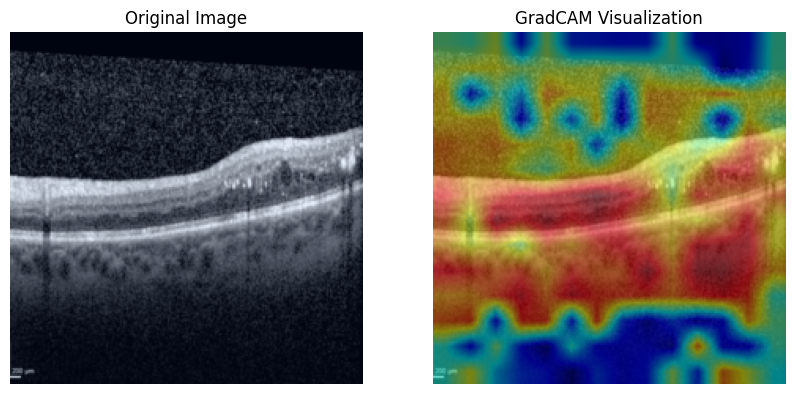

In [31]:
"""
GradCAM Implementation
"""

# Change based on "index"
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

class GradCAMForDeiT:
    def __init__(self, model, target_layer):
        """
        GradCAM for Vision Transformers, adapted to use attention scores or embeddings.

        Args:
        - model: Vision Transformer model (e.g., DeiT).
        - target_layer: The layer from which embeddings or attention maps are extracted.
        """
        self.model = model
        self.target_layer = target_layer
        self.attention = None
        self.embedding = None

        # Register hooks for attention and embeddings
        target_layer.register_forward_hook(self.save_attention)
        target_layer.register_forward_hook(self.save_embedding)

    def save_attention(self, module, input, output):
        self.attention = output.detach()
        print(f"Attention shape: {self.attention.shape}")

    def save_embedding(self, module, input, output):
        # Save the embeddings of the patches
        self.embedding = output.detach()

    def generate_heatmap(self, class_index):
        """
        Generate a GradCAM-like heatmap using embeddings.

        Args:
        - class_index: The class index to visualize.

        Returns:
        - heatmap: GradCAM heatmap in the shape of (H, W).
        """
        # Extract embeddings for image patches (excluding class token)
        patch_embeddings = self.attention[:, 1:, :]  # Shape: (batch_size, num_patches, hidden_dim)

        # Compute importance using class token embedding
        class_embedding = self.attention[:, 0, :]  # Class token embedding
        importance = torch.matmul(patch_embeddings, class_embedding.unsqueeze(-1)).squeeze(-1)

        # Reshape importance scores to match patch grid
        num_patches = int(importance.size(-1) ** 0.5)
        attention_map = importance.reshape(num_patches, num_patches)

        # Normalize and upscale the attention map to the input image size
        attention_map = F.interpolate(
            attention_map.unsqueeze(0).unsqueeze(0),
            size=(224, 224),
            mode="bilinear",
            align_corners=False
        ).squeeze()

        # Normalize heatmap to [0, 1]
        attention_map -= attention_map.min()
        attention_map /= attention_map.max()

        return attention_map

    def overlay_heatmap(self, heatmap, original_image, alpha=0.5):
        """
        Overlay the heatmap on the original image.

        Args:
        - heatmap: GradCAM heatmap.
        - original_image: Original input image.

        Returns:
        - overlayed_image: Image with heatmap overlay.
        """
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap.cpu().numpy()), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255.0
        overlayed = heatmap * alpha + original_image * (1 - alpha)
        return np.uint8(255 * overlayed)
    
    def clear_hooks(gradcam_deit):
        gradcam_deit.attention = None
        gradcam_deit.embedding = None

for batch_images, batch_labels in train_loader:
    images = batch_images  # Assign the first batch of images
    break
    
# Define the target layer (e.g., last attention block)
target_layer = model.blocks[-1].attn  # Example: Attention module in the last transformer block
gradcam_deit = GradCAMForDeiT(model, target_layer)

# Clear hooks
gradcam_deit.clear_hooks()

# Get specific input image
index = 0  # Change to desired image index
# Example of loading an image from the dataset
# for index, (image, label) in enumerate(train_loader):
#     input_image = image[0].unsqueeze(0).to('cuda')  # Select the first image in the batch
#     break

input_image = images[index].unsqueeze(0).to('cuda')

# Forward pass
model(input_image)

# Generate GradCAM heatmap for the desired class
class_index = 0  # Change to desired class index
heatmap = gradcam_deit.generate_heatmap(class_index)

# Overlay heatmap on the original image
original_image = images[index].permute(1, 2, 0).cpu().numpy()  # Convert tensor to NumPy
original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())  # Normalize
overlayed_image = gradcam_deit.overlay_heatmap(heatmap, original_image)

# Display the result
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("GradCAM Visualization")
plt.imshow(overlayed_image)
plt.axis('off')
plt.show()


15
Processing image at index: 0
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 76

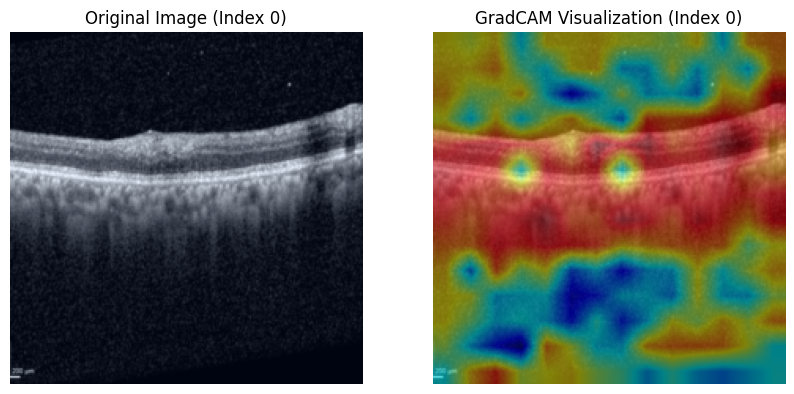

Processing image at index: 1
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

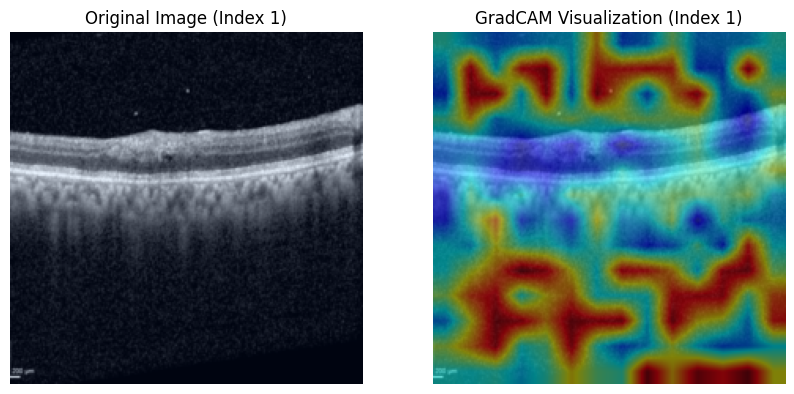

Processing image at index: 2
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

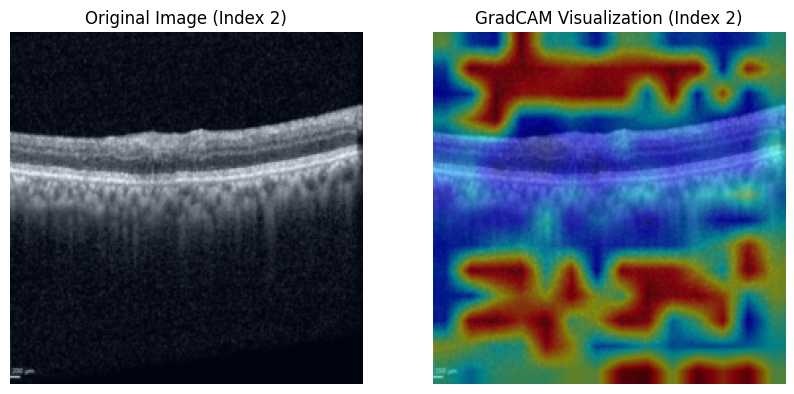

Processing image at index: 3
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

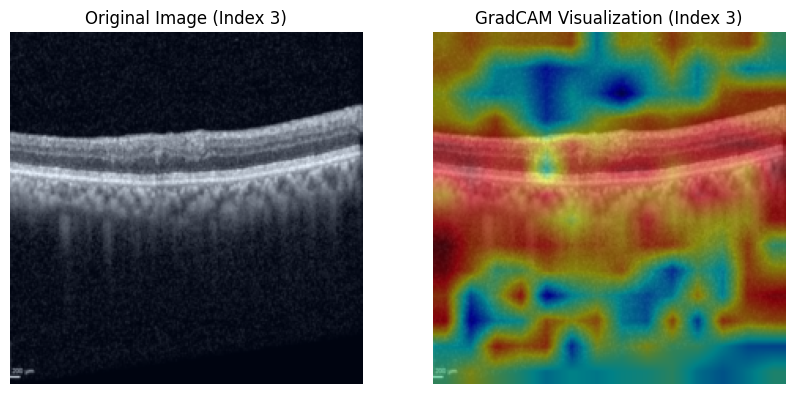

Processing image at index: 4
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

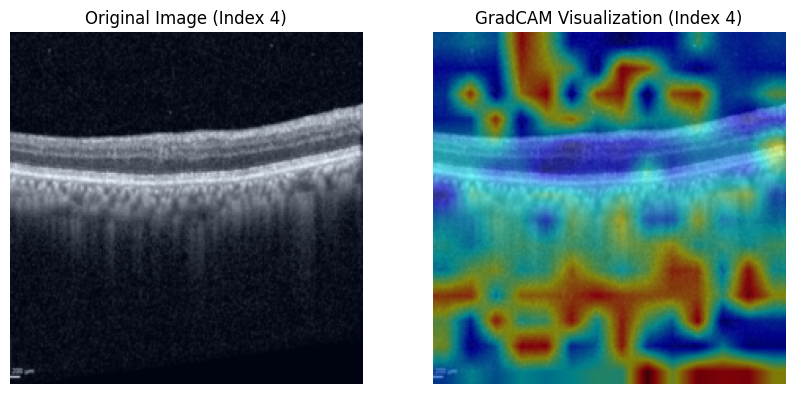

Processing image at index: 5
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

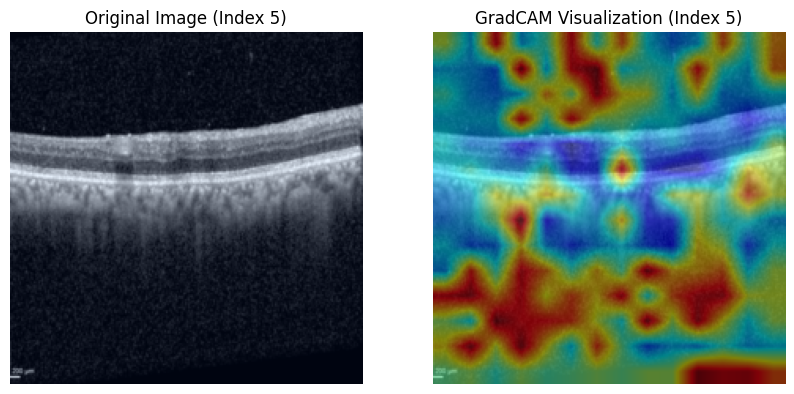

Processing image at index: 6
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

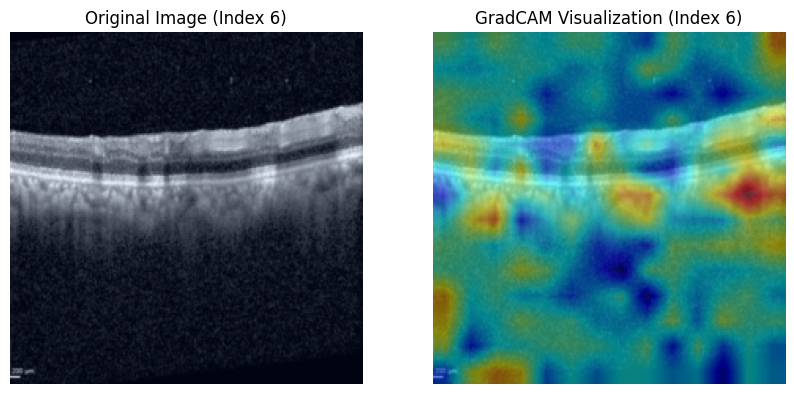

Processing image at index: 7
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

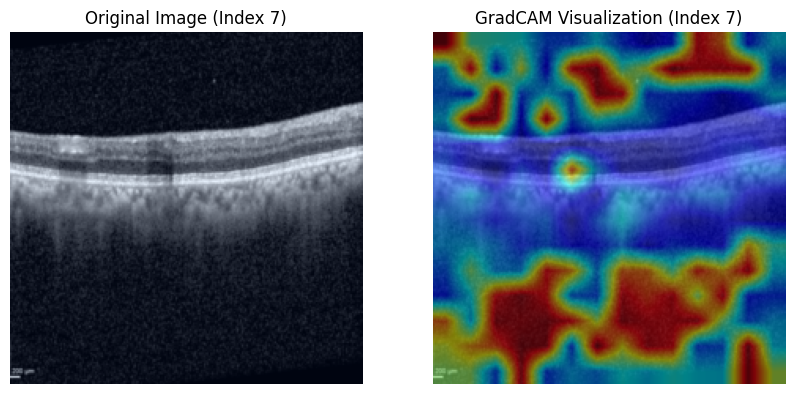

Processing image at index: 8
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

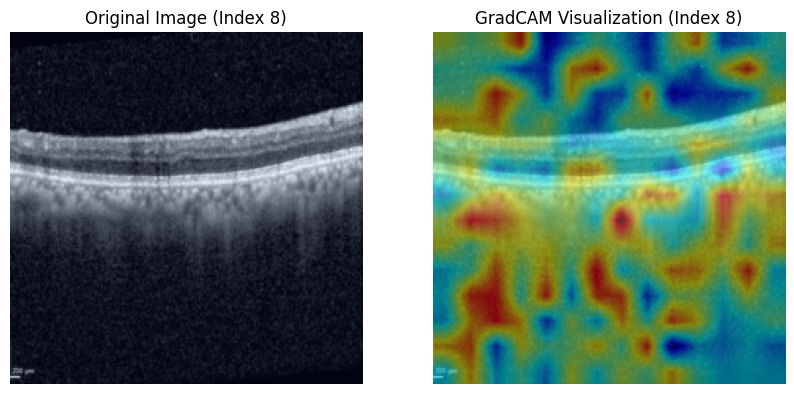

Processing image at index: 9
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])

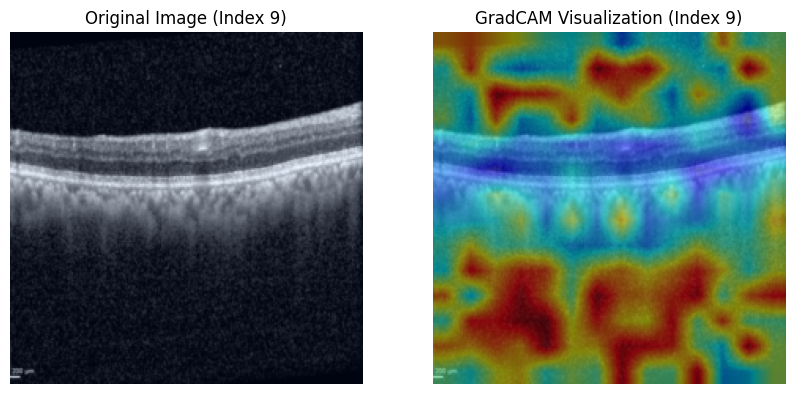

Processing image at index: 10
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

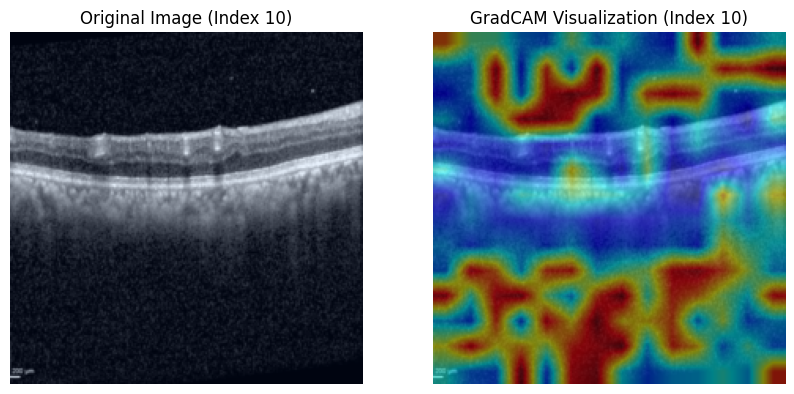

Processing image at index: 11
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

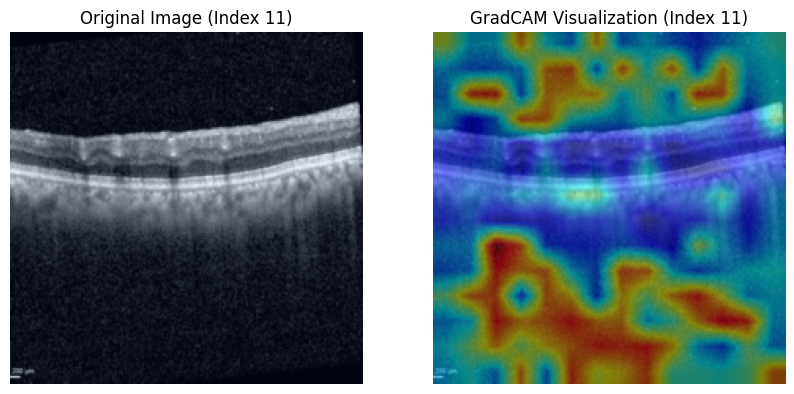

Processing image at index: 12
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

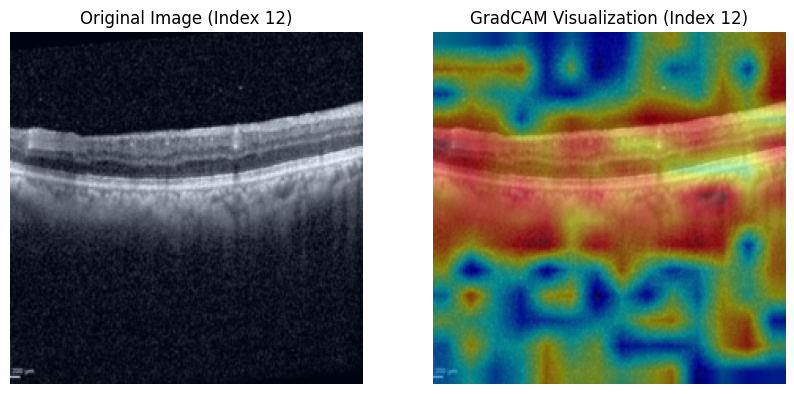

Processing image at index: 13
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

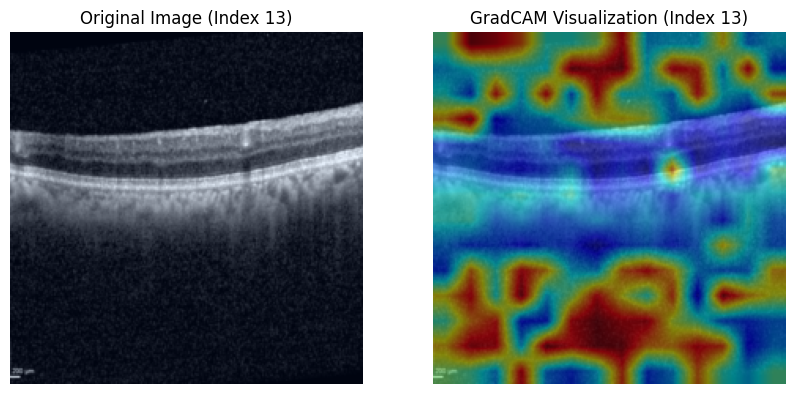

Processing image at index: 14
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

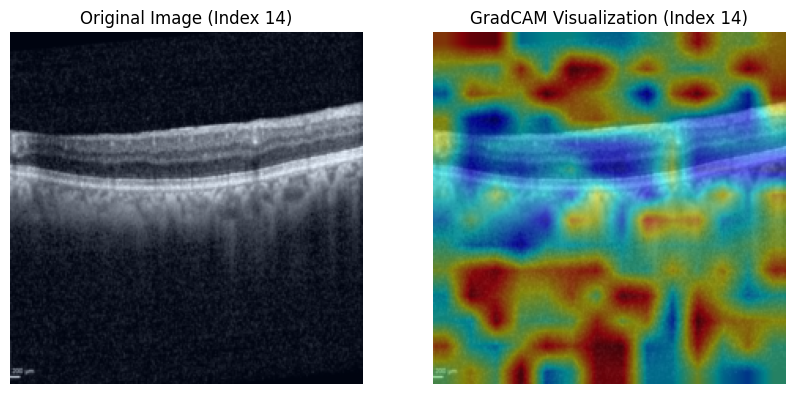

Processing image at index: 15
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

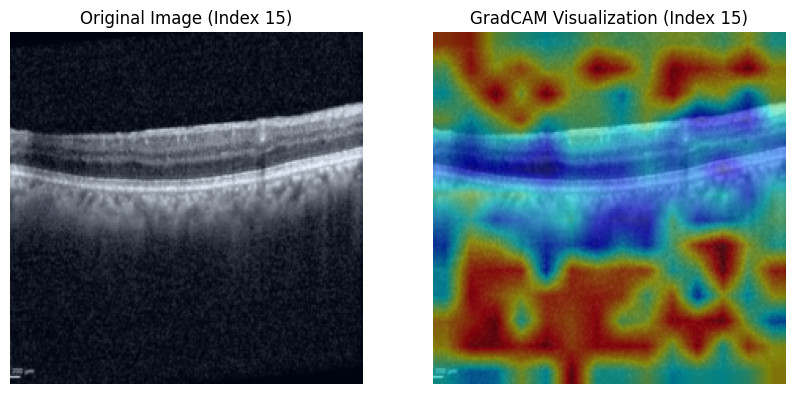

Processing image at index: 16
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

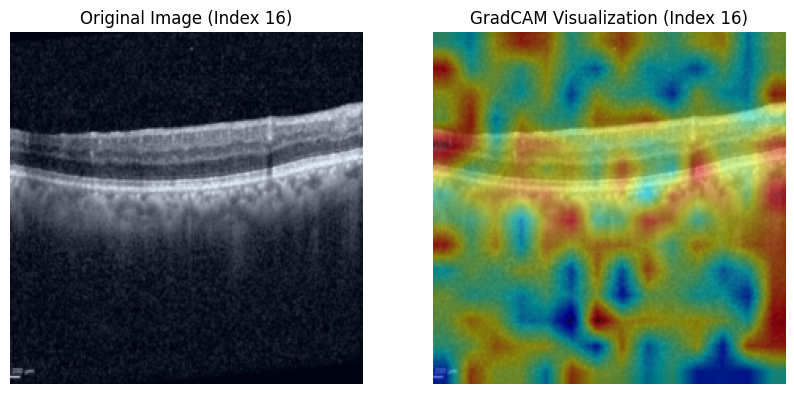

Processing image at index: 17
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

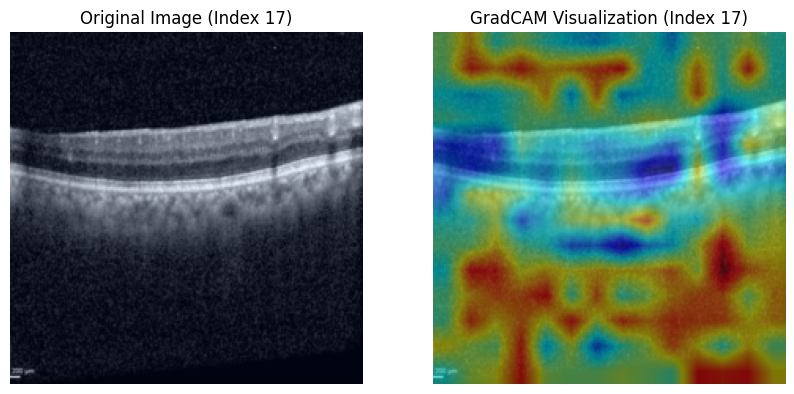

Processing image at index: 18
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

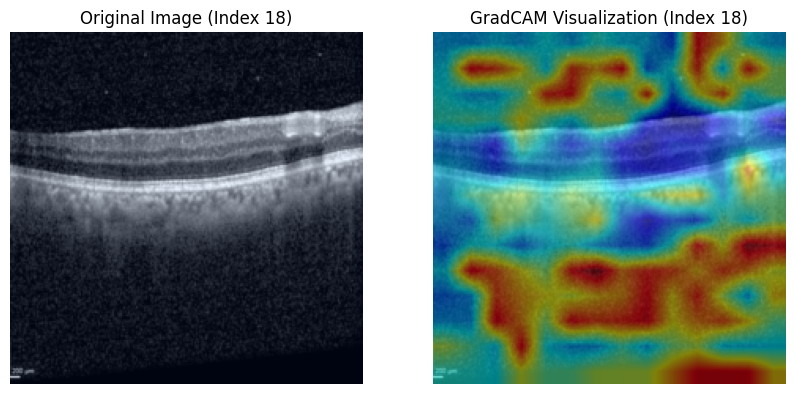

Processing image at index: 19
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

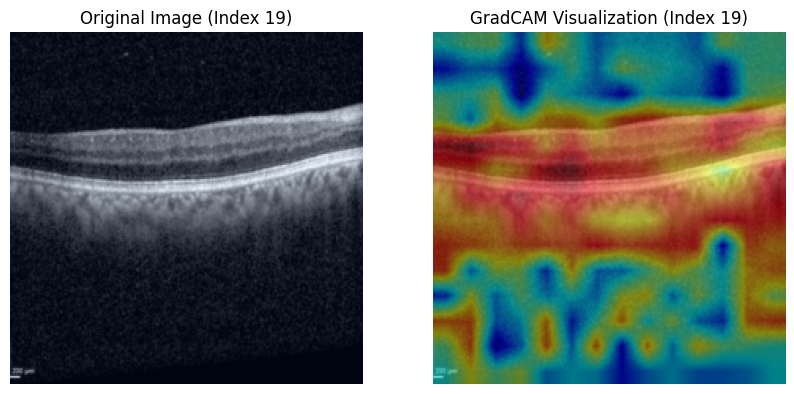

Processing image at index: 20
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

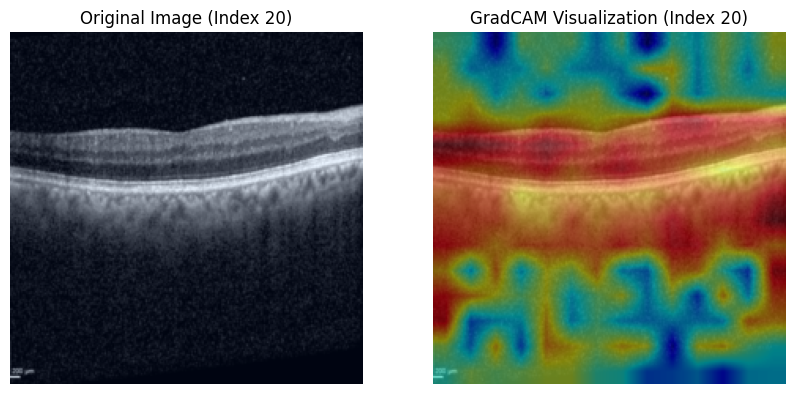

Processing image at index: 21
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

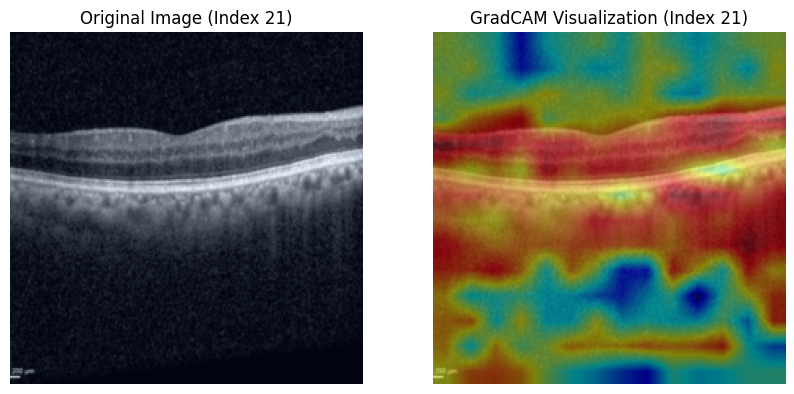

Processing image at index: 22
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

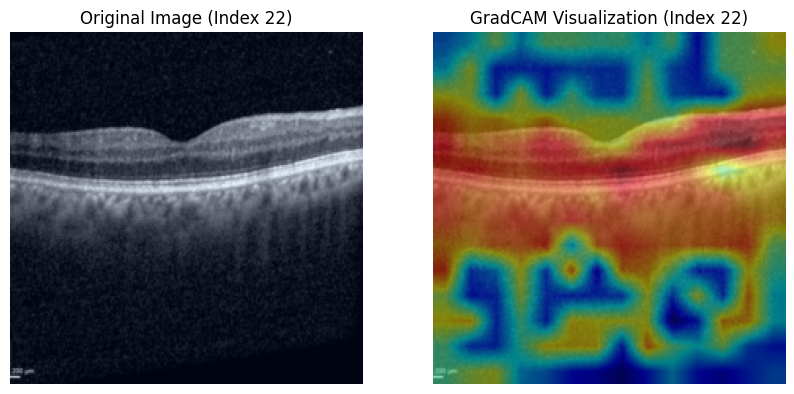

Processing image at index: 23
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

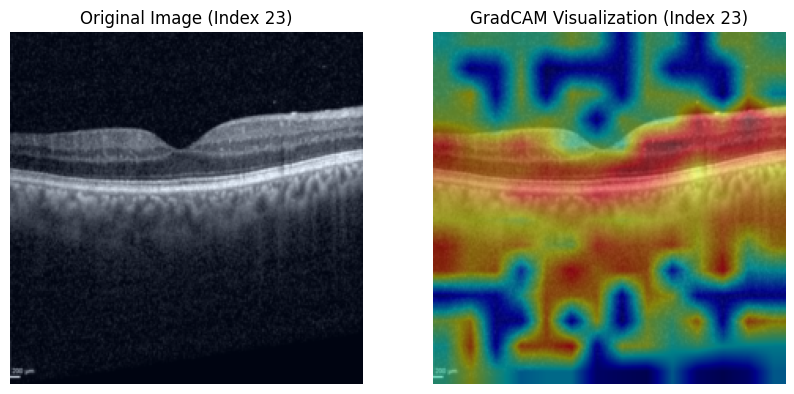

Processing image at index: 24
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

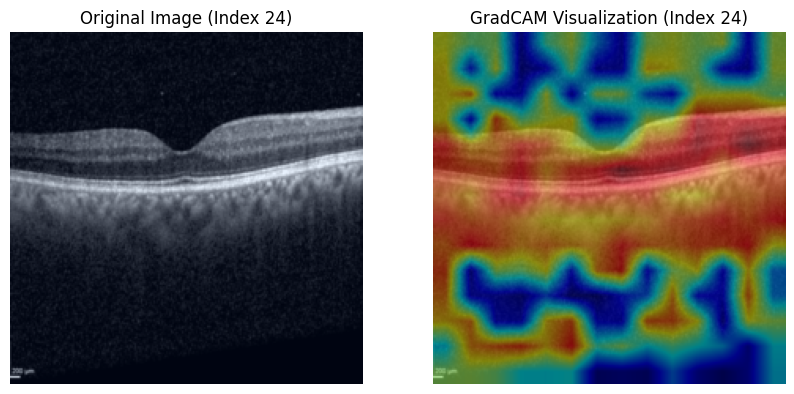

Processing image at index: 25
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

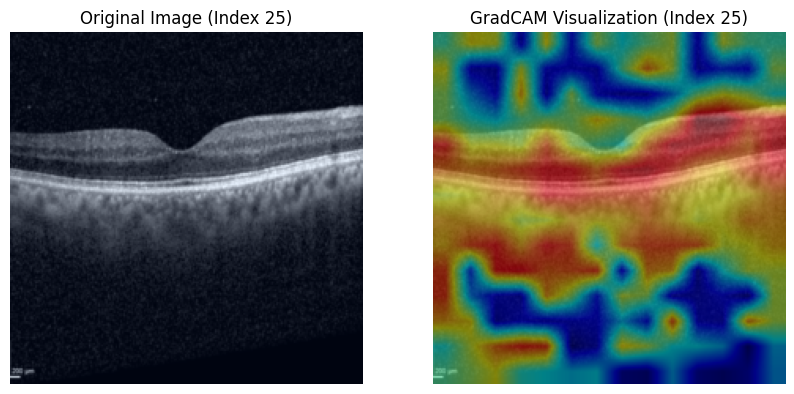

Processing image at index: 26
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

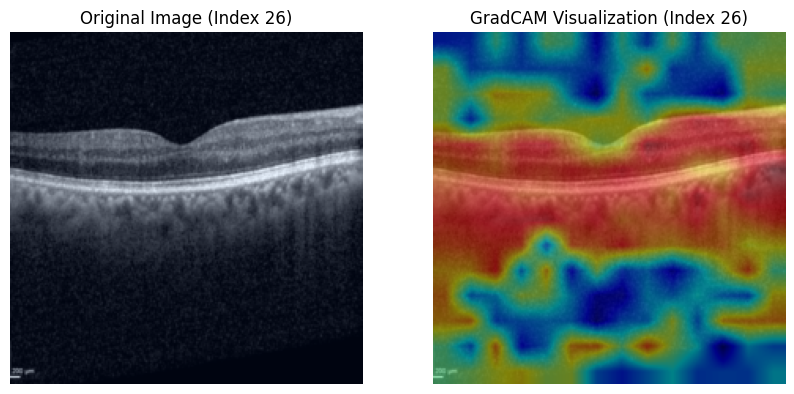

Processing image at index: 27
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

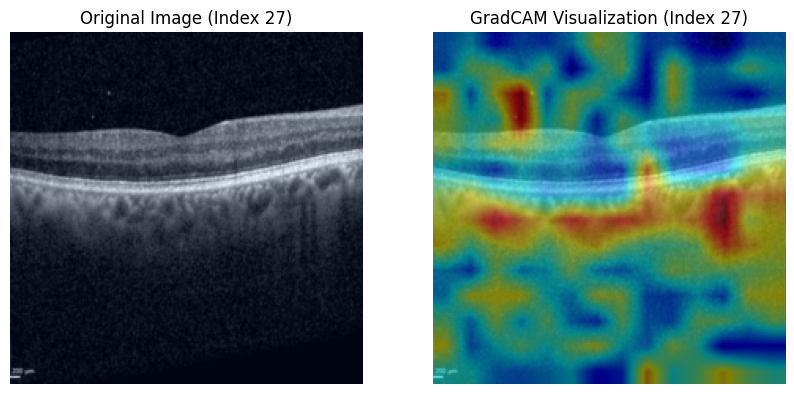

Processing image at index: 28
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

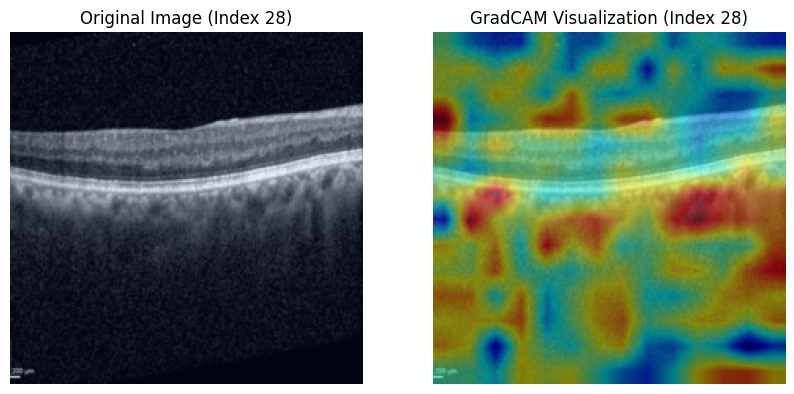

Processing image at index: 29
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

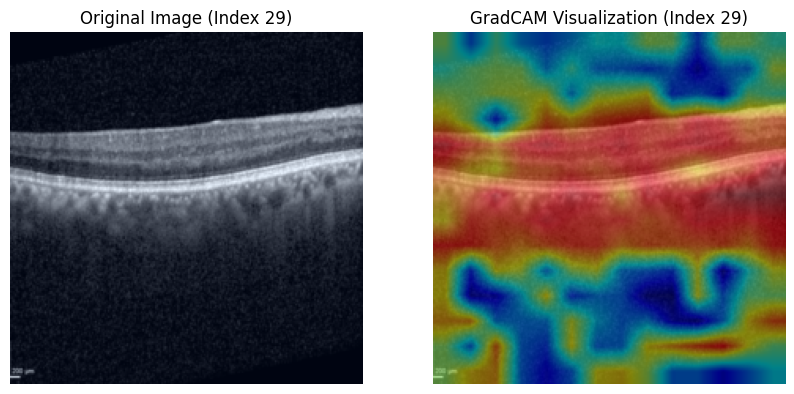

Processing image at index: 30
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

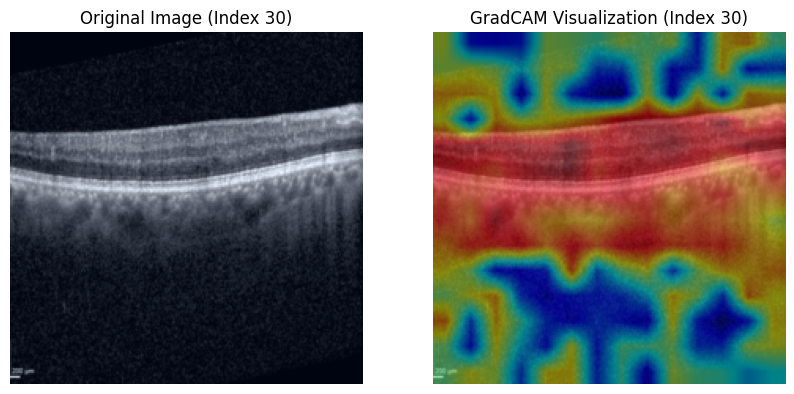

Processing image at index: 31
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Activations shape: torch.Size([1, 197, 768]), Captured in save_activations.
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Activations captured. Shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768])
Attention shape: torch.Size([1, 197, 768]

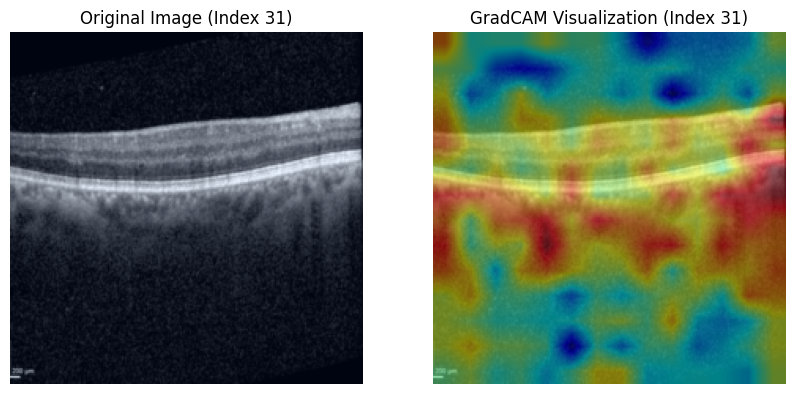

Processing image at index: 32


IndexError: index 32 is out of bounds for dimension 0 with size 32

In [176]:
# Define the range of indices
start_index = 0  # Starting index
end_index = 32  # Ending index (exclusive)

# Loop through the range of indices
for index in range(start_index, end_index):
    print(f"Processing image at index: {index}")
    
    # Clear hooks
    gradcam_deit.clear_hooks()

    # Get specific input image
    input_image = images[index].unsqueeze(0).to('cuda')

    # Forward pass
    model(input_image)

    # Generate GradCAM heatmap for the desired class
    class_index = 4  # Change to desired class index
    heatmap = gradcam_deit.generate_heatmap(class_index)

    # Overlay heatmap on the original image
    original_image = images[index].permute(1, 2, 0).cpu().numpy()  # Convert tensor to NumPy
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())  # Normalize
    overlayed_image = gradcam_deit.overlay_heatmap(heatmap, original_image)

    # Display the result
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title(f"Original Image (Index {index})")
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"GradCAM Visualization (Index {index})")
    plt.imshow(overlayed_image)
    plt.axis('off')
    plt.show()
